# 네트워크 분석으로 라벨링

In [3]:
#불용어 읽어오기
stopwords_file_path = 'stopwords_dh_lastlast.txt'
stopwords = []
with open(stopwords_file_path, 'r', encoding='utf-8') as file:
    stopwords = [line.strip() for line in file.readlines()]


In [4]:
import pandas as pd
from konlpy.tag import Okt
from collections import Counter

df=pd.read_csv('data/hurtcombined.csv')
reason=df['판례내용_이유']

#NaN값 처리
reason= reason.fillna('')

#Okt호출
okt = Okt()

#정규화한 뒤 명사추출
normalized = reason.apply(lambda x: ' '.join(okt.nouns(okt.normalize(x))))

# 불용어 제거 및 LDA 적용
def remove_stopwords(text):
    tokens = text.split()  # 공백으로 나누기
    filtered_tokens = [word for word in tokens if word not in stopwords]  # 불용어 제거
    return ' '.join(filtered_tokens)  # 다시 문자열로 결합

normalized_cleaned = [remove_stopwords(' '.join([word for word in text.split() if word not in stopwords])
) for text in normalized]

In [113]:
normalized_cleaned = [remove_stopwords(' '.join([word for word in text.split() if word not in stopwords])
) for text in normalized]

In [8]:
for i in range(len(normalized_cleaned)):
    df['키워드'][i]=normalized_cleaned[i]

df['키워드']

KeyError: '키워드'

In [26]:
df['판례내용_이유(불용어제거)']=normalized_cleaned

In [33]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer

# TF-IDF 벡터라이저 적용
vectorizer = TfidfVectorizer(max_features=10000, min_df=2, max_df=0.95)
tfidf_matrix = vectorizer.fit_transform(normalized_cleaned)

# K-Means 클러스터링 수행 (k=6로 설정)
num_clusters = 6
km = KMeans(n_clusters=num_clusters, random_state=42)
km.fit(tfidf_matrix)

df['클러스터']=km.labels_
# 결과 확인
print("클러스터링 결과:")
print(df[['판례내용_이유(불용어제거)', '클러스터']].head())

클러스터링 결과:
                                      판례내용_이유(불용어제거)  클러스터
0  승소 적법 승소 상소 두 취소 승소 여 로써 불복 존재 과세표준 증명책임 사업 연도...     0
1  폭행 특수 특수 협박 주거지 입금 주기 형광등 값 화가 손 머리 수회 발 옆구리 주...     4
2  개요 쟁점 진행 경과 인천 건조물 침입 죄 제기 징역 구속영장 발부 건 언급 건조물...     0
3  경합 동시 기소 개일 분리 일부상소 쌍방 상소 분리 경합 지남 무죄판결 주거침입 벌...     4
4  죄 사 실 전력 수원지방법원 폭력 감금 죄 징역 집행유예 중앙 마약 류 관리 대마 ...     4


In [34]:
df['클러스터'].value_counts()

클러스터
0    2063
4     942
5     436
3     346
1     327
2      75
Name: count, dtype: int64

In [ ]:
# 클러스터별 상위 단어 및 그 단어들의 TF-IDF 값 확인
order_centroids = km.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names_out()

cluster_top_terms = {}

print("클러스터별 상위 10개 단어:")
for i in range(num_clusters):
    print(f"\n클러스터 {i+1}:")
    top_terms = [terms[ind] for ind in order_centroids[i, :10]]
    cluster_top_terms[i] = top_terms  # 클러스터별 상위 10개 단어 저장
    # 클러스터의 상위 10개 단어의 TF-IDF 값 계산
    tfidf_values = [km.cluster_centers_[i, ind] for ind in order_centroids[i, :10]]
    mean_tf_idf = np.mean(tfidf_values)  # 평균 TF-IDF 값 계산
    for ind in order_centroids[i, :10]:  # 상위 10개의 단어
        print(f"단어: {terms[ind]} - TF-IDF 값: {km.cluster_centers_[i, ind]}")
    print(f"평균 TF-IDF 값: {mean_tf_idf:.4f}")  # 평균 TF-IDF 값 출력

tfidf_cluster_matrix = np.zeros((num_clusters, len(terms)))

for cluster in range(num_clusters):
    for term in cluster_top_terms[cluster]:  # 클러스터 번호가 1부터 시작하므로 인덱스 조정
        if term in terms:
            term_index = np.where(terms == term)[0][0]
            tfidf_cluster_matrix[cluster, term_index] = 1  # 클러스터에서의 단어 존재 여부를 1로 표시

# 클러스터 간 유사도 계산
similarity_matrix = cosine_similarity(tfidf_cluster_matrix)

In [12]:
 for ind in order_centroids[i, :10]:  # 상위 10개의 단어
        print(f"단어: {terms[ind]} - TF-IDF 값: {km.cluster_centers_[i, ind]}")

array(['가가', '가감', '가건물', ..., '힐튼', '힘껏', '힘줄'], dtype=object)

클러스터 1: 노동 및 산업 안전에서의 상해

주제 요약: 산업 현장에서의 상해 및 안전 관리

설명: 산업 현장에서 발생하는 상해와 관련하여 근로자 파견, 근로 환경 안전, 산업 재해 등이 포함됩니다. 이는 산업 재해 예방과 
근로자의 안전을 위한 법적 관리 체계, 상해 발생 시의 처리 절차와 관련된 내용을 다룹니다.



클러스터 2: 교통사고 상해 및 손해배상

주제 요약: 교통사고 상해와 손해배상 청구

설명: 교통사고로 인한 상해 사건에서 손해배상 청구, 치료 비용, 보험 회사와의 분쟁 등이 주제입니다. 상해로 인한 법적 책임, 보험 보상 범위, 치료비 및 손해배상 청구와 같은 사고 처리 절차가 다뤄집니다.



클러스터 3: 성폭력 상해와 신상 정보 관리

주제 요약: 성폭력 상해 사건 및 범죄자 신상 정보 등록

설명: 성폭력에 의해 발생한 상해 사건과 관련하여 가해자의 신상 정보 관리, 성범죄자 등록 제도 등이 포함됩니다. 이는 성폭력으로 인한 신체적·정신적 상해, 정보 공개를 통한 사회적 보호, 군대 내 성범죄 관리와 같은 법적 대응을 다루고 있습니다.



클러스터 4: 보험과 상해 보상

주제 요약: 보험 계약과 상해 보상 청구

설명: 상해 사건과 보험 계약을 바탕으로 보험금 지급, 사고 보상 절차가 주제입니다. 보험과 관련한 상해 보상 청구, 지급 조건, 사고 발생 후의 보험 절차 등을 포함하며, 특히 보험 회사와 피보험자 간의 법적 분쟁을 다룹니다.



클러스터 5: 농업 노동자의 상해 및 노임 보상

주제 요약: 농업 분야에서의 상해 보상과 노임

설명: 농업 노동자의 상해 사건을 중심으로 노임 인상, 보상 및 근로 환경 문제가 포함됩니다. 상해 발생 후의 보상 문제, 농업 노동자의 근로 조건 개선, 노임 보상 청구 등의 법적 논의가 주요 주제로 나타나고 있습니다.



클러스터 6: 이혼 및 재산 분할에서의 상해 관련 문제

주제 요약: 이혼 시 재산 분할과 상해로 인한 위자료 청구

설명: 이혼 과정에서 상해로 인한 위자료 청구, 재산 분할이 포함됩니다. 부부 간 상해 발생으로 인한 법적 책임 분배, 재산권 청산, 상해에 대한 위자료 청구 등이 다루어지며, 이는 주로 가정 내 상해 문제 해결을 위한 법적 절차와 관련됩니다.


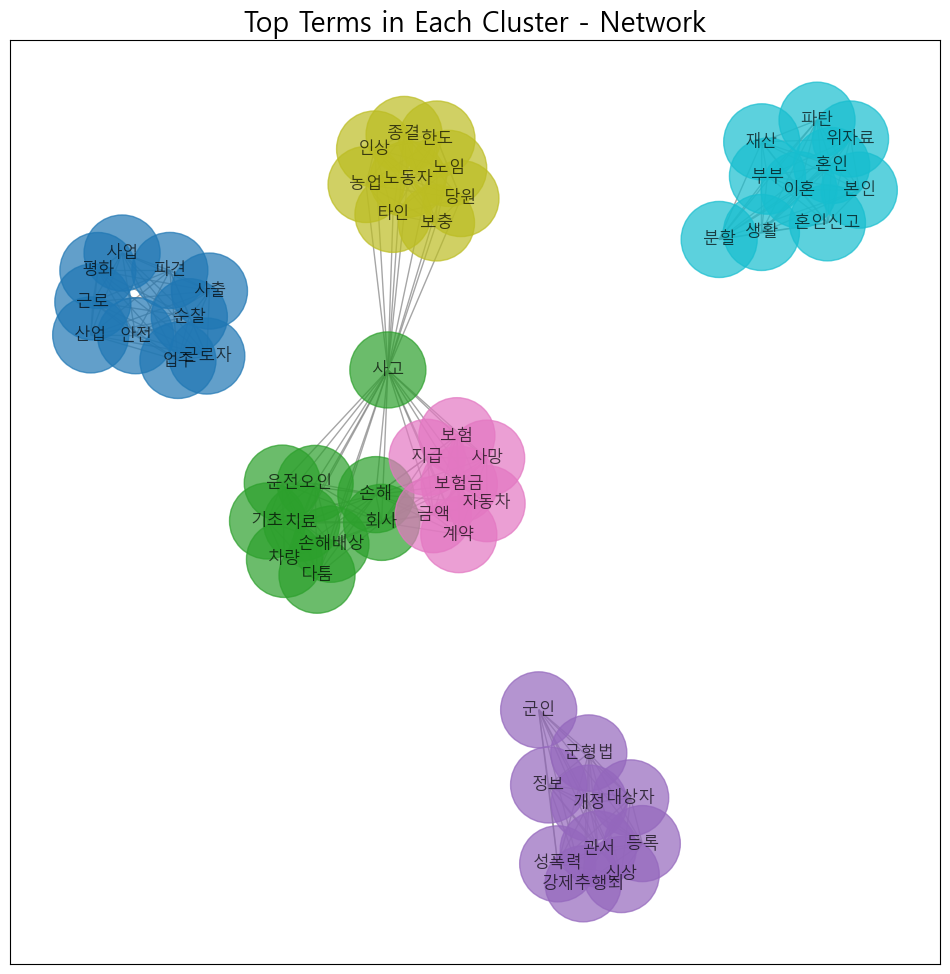

In [106]:
import matplotlib.pyplot as plt
import numpy as np
import networkx as nx
from matplotlib import font_manager


# 한글 폰트 설정 (Windows에서의 Malgun Gothic)
font_path = 'C:/Windows/Fonts/malgun.ttf'  # 폰트 경로 설정
font_prop = font_manager.FontProperties(fname=font_path)


# 클러스터 색상 지정
num_clusters = len(cluster_top_terms)  # 클러스터 수에 맞게 설정
cluster_colors = plt.get_cmap('tab10', num_clusters)  # 색상 맵 생성

G = nx.Graph()

# 클러스터별 상위 단어들 사이의 엣지를 추가
for cluster, top_terms in cluster_top_terms.items():
    for i in range(len(top_terms)):
        for j in range(i + 1, len(top_terms)):
            G.add_edge(top_terms[i], top_terms[j], weight=1)  # 단순 엣지 추가 (공동 출현 가정)

# 노드 색상 맵 생성
color_map = []
for node in G.nodes():
    # 노드가 클러스터의 상위 단어인 경우 색상 지정
    for cluster_index, top_terms in cluster_top_terms.items():
        if node in top_terms:
            color_map.append(cluster_colors(cluster_index))  # 클러스터 색상 추가
            break
    else:
        color_map.append("gray")  # 클러스터 상위 단어가 아닌 노드는 회색으로 표시

# 네트워크 시각화
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, k=0.5, iterations=50)

# 노드 및 엣지 그리기, 한글 폰트 적용
nx.draw_networkx(G, pos, with_labels=True, node_size=3000, node_color=color_map, font_size=12, font_color="black", edge_color="gray", alpha=0.7, font_family=font_prop.get_name())

# 제목에도 한글 폰트 적용
plt.title("Top Terms in Each Cluster - Network", fontproperties=font_prop, fontsize=20)
plt.show()

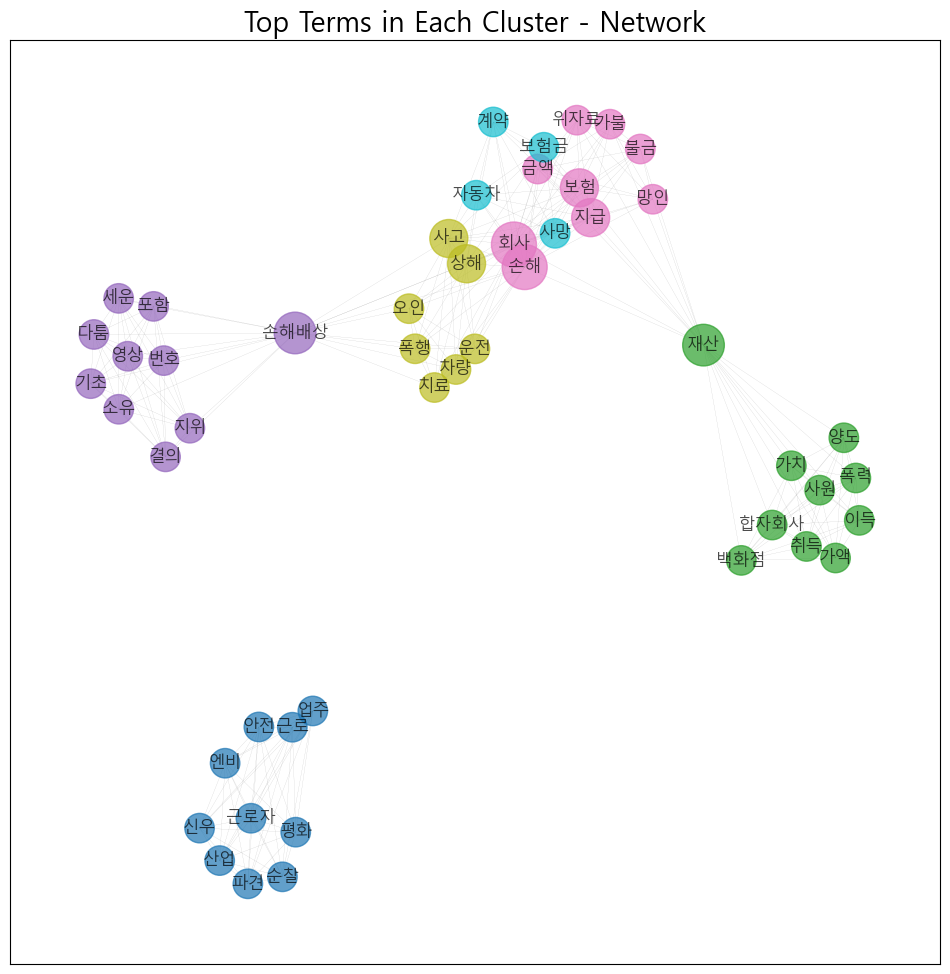

In [61]:
# 클러스터 색상 지정
num_clusters = len(cluster_top_terms)  # 클러스터 수에 맞게 설정
cluster_colors = plt.get_cmap('tab10', num_clusters)  # 색상 맵 생성

G = nx.Graph()

# 클러스터별 상위 단어들 사이의 엣지를 추가
for cluster, top_terms in cluster_top_terms.items():
    for i in range(len(top_terms)):
        for j in range(i + 1, len(top_terms)):
            G.add_edge(top_terms[i], top_terms[j], weight=1)  # 단순 엣지 추가 (공동 출현 가정)

# 노드 색상 맵 생성
color_map = []
for node in G.nodes():
    # 노드가 클러스터의 상위 단어인 경우 색상 지정
    for cluster_index, top_terms in cluster_top_terms.items():
        if node in top_terms:
            color_map.append(cluster_colors(cluster_index))  # 클러스터 색상 추가
            break
    else:
        color_map.append("gray")  # 클러스터 상위 단어가 아닌 노드는 회색으로 표시

# 네트워크 시각화
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, k=0.5, iterations=50)

# 노드 크기 설정 (degree를 기반으로)
node_sizes = [d for n, d in G.degree()]

# 노드 및 엣지 그리기, 한글 폰트 적용
nx.draw_networkx(G, pos, with_labels=True, node_size=[d * 50 for d in node_sizes], node_color=color_map, font_size=12, font_color="black", edge_color="gray", alpha=0.7, width=0.1, font_family=font_prop.get_name())

# 제목에도 한글 폰트 적용
plt.title("Top Terms in Each Cluster - Network", fontproperties=font_prop, fontsize=20)
plt.show()

연경님꺼 따라서

In [44]:
cluster_labels = km.labels_
# 클러스터 중심 계산
cluster_centers = km.cluster_centers_

# 각 클러스터의 중심 단어 추출
def get_top_keywords_for_clusters(cluster_centers, vectorizer, n_words=20):
    order_centroids = cluster_centers.argsort()[:, ::-1]  # 각 클러스터의 중심 단어 인덱스 정렬
    terms = vectorizer.get_feature_names_out()  # 단어 목록
    
    cluster_keywords = {}
    for i in range(num_clusters):
        cluster_keywords[i] = [terms[ind] for ind in order_centroids[i, :n_words]]  # 상위 n_words 단어
    
    return cluster_keywords

# 8. 클러스터 중심 단어 출력
cluster_keywords = get_top_keywords_for_clusters(cluster_centers, vectorizer)
for cluster_num, keywords in cluster_keywords.items():
    print(f"\n클러스터 {cluster_num + 1}의 중심 단어들: {', '.join(keywords)}")


클러스터 1의 중심 단어들: 파견, 근로자, 평화, 산업, 근로, 안전, 순찰, 업주, 엔비, 신우, 사출, 사업, 고용, 의무, 계약, 외주, 배려, 주가, 복지, 보호

클러스터 2의 중심 단어들: 백화점, 가액, 이득, 합자회사, 취득, 재산, 양도, 사원, 가치, 폭력, 객관, 대지, 경제범죄, 분권, 협박, 인수, 회사, 분양, 대표, 건물

클러스터 3의 중심 단어들: 기초, 다툼, 지위, 영상, 결의, 손해배상, 소유, 번호, 세운, 포함, 아들, 추가, 운전면허, 보태, 쟁점, 반증, 자동차, 보험금, 시한, 지급

클러스터 4의 중심 단어들: 불금, 지급, 망인, 손해, 가불, 보험, 금액, 재산, 위자료, 회사, 대통령령, 보험금, 공제, 초과, 손해배상, 치료, 사망, 반환, 사고, 배상

클러스터 5의 중심 단어들: 사고, 손해배상, 상해, 손해, 치료, 차량, 폭행, 회사, 운전, 오인, 다툼, 징역, 유지, 채증, 국선변호인, 지급, 오해, 공소, 폭력, 노동

클러스터 6의 중심 단어들: 보험, 계약, 보험금, 지급, 자동차, 사고, 손해, 회사, 상해, 사망, 금액, 급여, 차량, 의무, 장해, 망인, 재해, 가입, 손해배상, 보험료


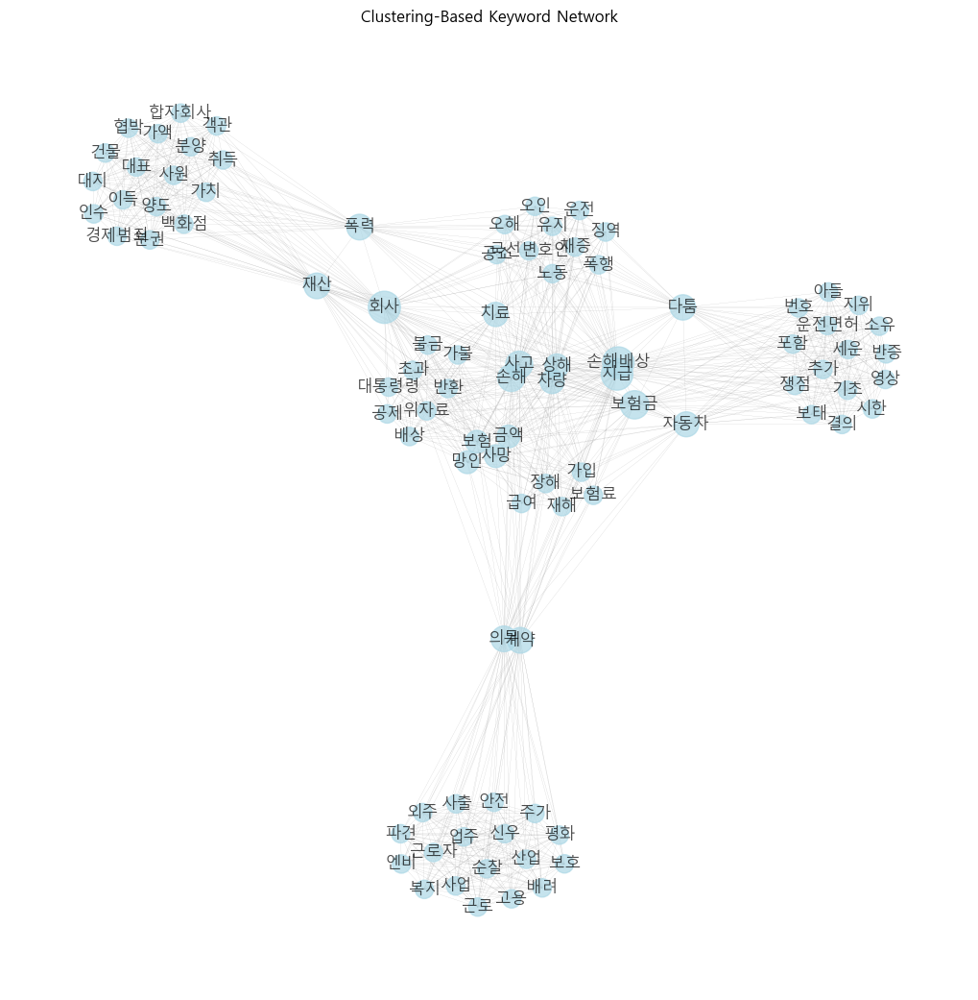

In [47]:
import platform
from matplotlib import rc
# 한글폰트 설정 (윈도우즈에서만)
if platform.system() == 'Windows':
    font_path = 'C:/Windows/Fonts/malgun.ttf'  # 맑은 고딕 폰트 경로
    font_name = font_manager.FontProperties(fname=font_path).get_name()
    rc('font', family=font_name)

# 마이너스 폰트 설정 (깨짐 방지)
plt.rcParams['axes.unicode_minus'] = False

# 네트워크 그래프 생성
G = nx.Graph()

# 클러스터별 키워드를 노드로 추가하고, 키워드 간 엣지 설정
for cluster, keywords in cluster_keywords.items():
    for keyword in keywords:
        G.add_node(keyword, cluster=cluster)  # 노드 추가
    for i in range(len(keywords)):
        for j in range(i + 1, len(keywords)):
            G.add_edge(keywords[i], keywords[j])  # 엣지 추가

# 노드 라벨 설정
for node in G.nodes():
    G.nodes[node]['label'] = node  # 노드 이름을 라벨로 설정

# 레이아웃 설정 (스프링 레이아웃)
pos = nx.spring_layout(G, k=0.3)  # k 값 조절하여 노드 간 간격 조절

# 노드 크기 설정 (degree를 기반으로)
node_sizes = [d for n, d in G.degree()]

# 시각화
plt.figure(figsize=(10, 10))
nx.draw(G, pos, with_labels=True, font_family=plt.rcParams['font.family'],  # 윈도우즈에서는 한글 폰트 사용
        node_size=[d * 10 for d in node_sizes],  # 노드 크기 조절
        node_color='lightblue',
        alpha=0.7,  # 노드 투명도
        width=0.1,  # 선 두께
        edge_color='gray')
plt.title('Clustering-Based Keyword Network')
plt.show()

Level 4까지 그리기

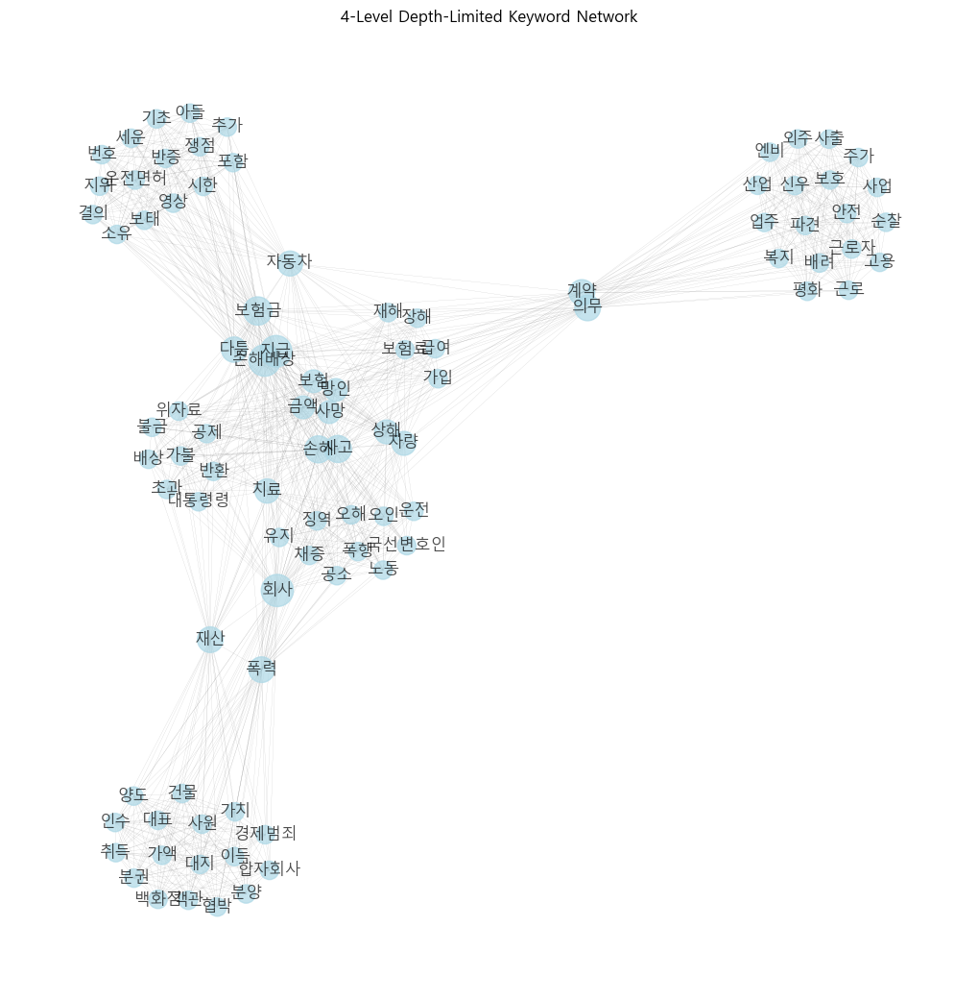

In [51]:
# 네트워크 그래프 생성
G = nx.Graph()

# 클러스터별 키워드를 노드로 추가하고, 키워드 간 엣지 설정
for cluster, keywords in cluster_keywords.items():
    for keyword in keywords:
        G.add_node(keyword, cluster=cluster)  # 노드 추가
    for i in range(len(keywords)):
        for j in range(i + 1, len(keywords)):
            G.add_edge(keywords[i], keywords[j])  # 엣지 추가

# 네트워크 뎁스 제한: 특정 키워드에서 최대 4 레벨까지만 연결
target_node = "손해"  # 시작할 키워드 (원하는 키워드로 변경)
depth_limited_graph = nx.ego_graph(G, target_node, radius=3)

# 노드 라벨 설정
for node in depth_limited_graph.nodes():
    depth_limited_graph.nodes[node]['label'] = node  # 노드 이름을 라벨로 설정

# 레이아웃 설정 (스프링 레이아웃)
pos = nx.spring_layout(depth_limited_graph, k=0.3)  # k 값 조절하여 노드 간 간격 조절

# 노드 크기 설정 (degree를 기반으로)
node_sizes = [d for n, d in depth_limited_graph.degree()]

# 시각화
plt.figure(figsize=(10, 10))
nx.draw(depth_limited_graph, pos, with_labels=True, font_family=plt.rcParams['font.family'],  # 윈도우즈에서는 한글 폰트 사용
        node_size=[d * 10 for d in node_sizes],  # 노드 크기 조절
        node_color='lightblue',
        alpha=0.7,  # 노드 투명도
        width=0.1,  # 선 두께
        edge_color='gray')
plt.title('4-Level Depth-Limited Keyword Network')
plt.show()


중심성 높은 키워드로 네트워크 구성

중심성이 가장 높은 키워드: 회사


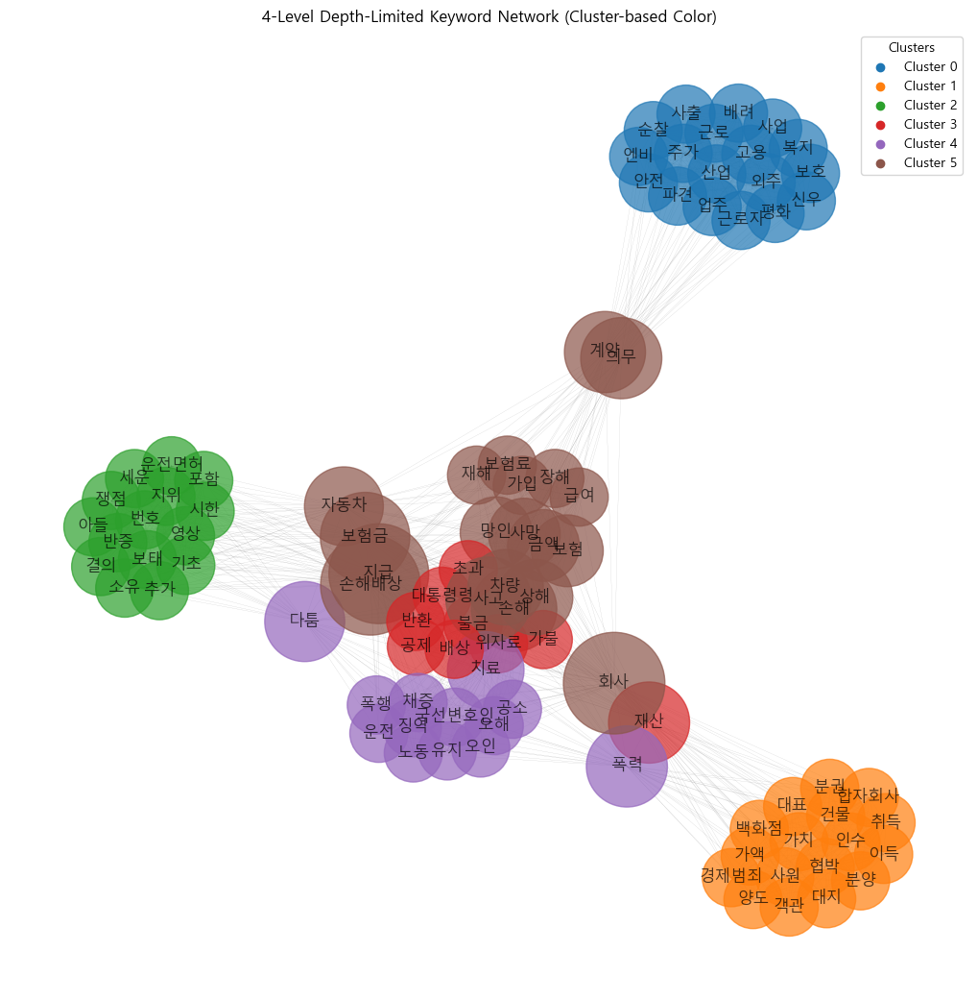

In [58]:
import matplotlib.pyplot as plt
import networkx as nx
from matplotlib import font_manager, rc
import platform
import matplotlib.colors as mcolors

# 한글 폰트 설정 (윈도우즈에서만)
if platform.system() == 'Windows':
    font_path = 'C:/Windows/Fonts/malgun.ttf'  # 맑은 고딕 폰트 경로
    font_name = font_manager.FontProperties(fname=font_path).get_name()
    rc('font', family=font_name)

# 마이너스 폰트 설정 (깨짐 방지)
plt.rcParams['axes.unicode_minus'] = False

# 네트워크 그래프 생성
G = nx.Graph()

# 클러스터별 키워드를 노드로 추가하고, 키워드 간 엣지 설정
for cluster, keywords in cluster_keywords.items():
    for keyword in keywords:
        G.add_node(keyword, cluster=cluster)  # 노드 추가
    for i in range(len(keywords)):
        for j in range(i + 1, len(keywords)):
            G.add_edge(keywords[i], keywords[j])  # 엣지 추가

# 중심성 계산 (예: degree 중심성)
centrality = nx.degree_centrality(G)

# 중심성이 가장 높은 키워드 찾기
target_node = max(centrality, key=centrality.get)
print("중심성이 가장 높은 키워드:", target_node)

# 네트워크 뎁스 제한: 중심성이 가장 높은 키워드에서 최대 4 레벨까지만 연결
depth_limited_graph = nx.ego_graph(G, target_node, radius=3)

# 클러스터별 고유 색상 설정
cluster_colors = {cluster: color for cluster, color in zip(cluster_keywords.keys(), mcolors.TABLEAU_COLORS)}

# 노드 색상 설정 (클러스터별 구분)
node_colors = [cluster_colors[depth_limited_graph.nodes[node]['cluster']] for node in depth_limited_graph.nodes()]

# 노드 크기 설정 (degree를 기반으로)
node_sizes = [depth_limited_graph.degree(n) * 100 for n in depth_limited_graph.nodes()]

# 레이아웃 설정 (스프링 레이아웃)
pos = nx.spring_layout(depth_limited_graph, k=0.3)

# 시각화
plt.figure(figsize=(10, 10))
nx.draw(depth_limited_graph, pos, with_labels=True, font_family=plt.rcParams['font.family'],
        node_size=node_sizes,  # 노드 크기 조절
        node_color=node_colors,  # 노드 색상 (클러스터별 구분)
        edge_color='gray', alpha=0.7, width=0.1)
plt.title('4-Level Depth-Limited Keyword Network (Cluster-based Color)')

# 범례 추가
for cluster, color in cluster_colors.items():
    plt.scatter([], [], color=color, label=f'Cluster {cluster}')
plt.legend(title="Clusters")
plt.show()

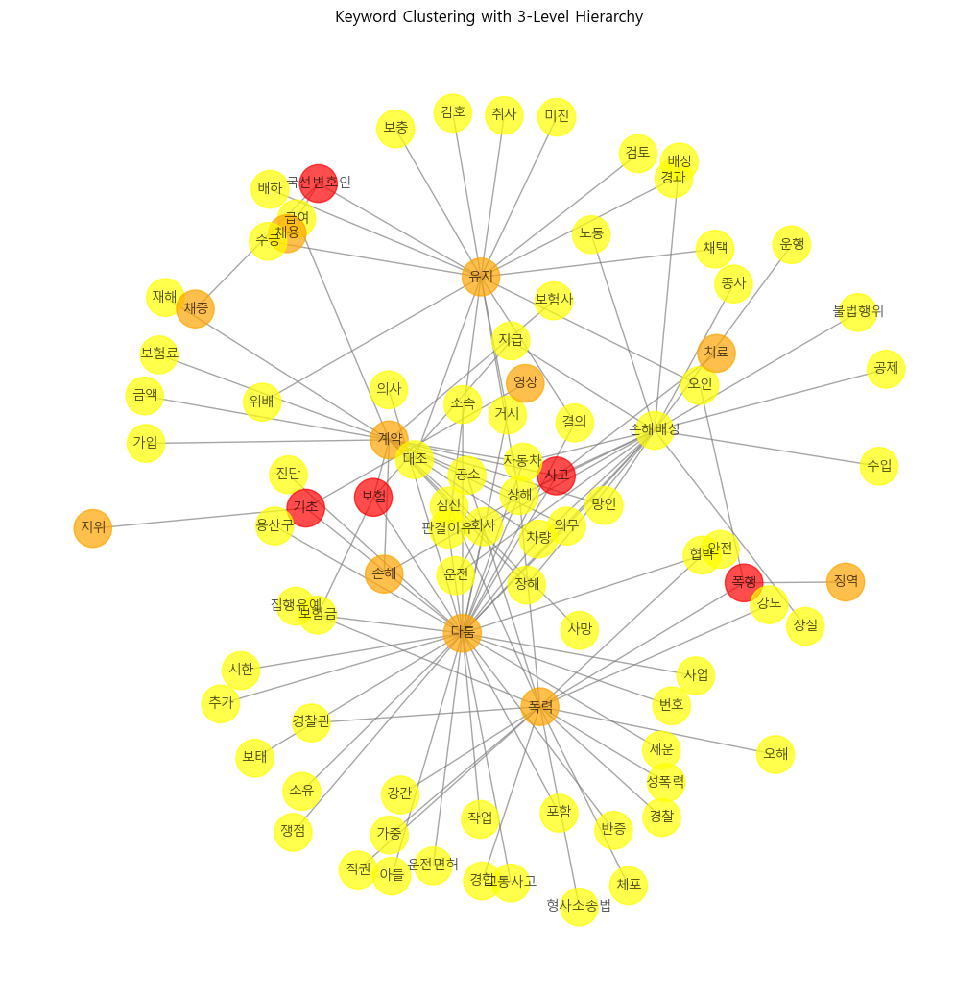

In [60]:
feature_names = vectorizer.get_feature_names_out()  # TF-IDF에서 사용된 키워드 목록

# K-Means 클러스터링 설정 및 수행
num_clusters = 6
kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)
kmeans.fit(tfidf_matrix)
labels = kmeans.labels_

# 클러스터별 주요 키워드 추출 (상위, 중위, 하위)
cluster_keywords = {}
for i in range(num_clusters):
    cluster_indices = (labels == i)
    tfidf_cluster = tfidf_matrix[cluster_indices].mean(axis=0).A1  # numpy 배열을 1차원으로 변환
    sorted_keywords = [feature_names[idx] for idx in tfidf_cluster.argsort()[::-1]]
    cluster_keywords[f'Cluster {i+1}'] = sorted_keywords[:20]  # 클러스터별 상위 10개 키워드

# 네트워크 그래프 생성 및 레벨 구분
G = nx.Graph()
for cluster, keywords in cluster_keywords.items():
    # 상위 레벨: 가장 중심이 되는 키워드
    G.add_node(keywords[0], level=1, cluster=cluster)
    
    # 2레벨 키워드 연결
    for keyword in keywords[1:4]:
        G.add_node(keyword, level=2, cluster=cluster)
        G.add_edge(keywords[0], keyword)
    
    # 3레벨 키워드 연결
    for keyword in keywords[4:]:
        G.add_node(keyword, level=3, cluster=cluster)
        G.add_edge(keywords[1], keyword)  # 2레벨 키워드에 연결

# 노드 색상 설정 (레벨별 구분)
node_colors = []
for node in G.nodes(data=True):
    if node[1]['level'] == 1:
        node_colors.append('red')  # 상위 레벨
    elif node[1]['level'] == 2:
        node_colors.append('orange')  # 중간 레벨
    else:
        node_colors.append('yellow')  # 하위 레벨

# 레이아웃 및 시각화 설정
pos = nx.spring_layout(G, k=0.5)
plt.figure(figsize=(10, 10))
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=800, edge_color='gray', alpha=0.7, font_size=10, font_family='Malgun Gothic')
plt.title("Keyword Clustering with 3-Level Hierarchy")
plt.show()

# ㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡ

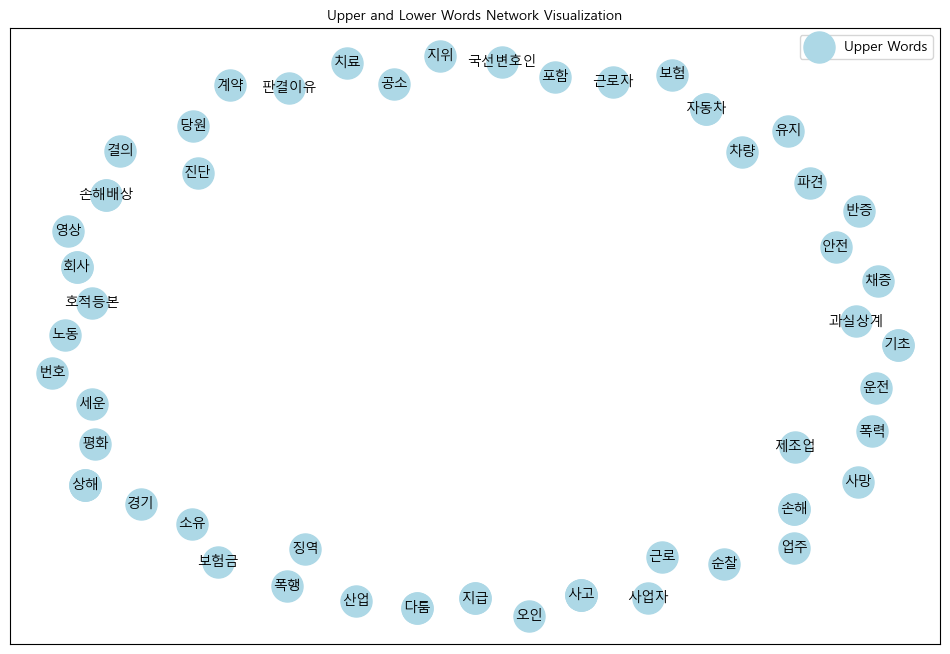

In [12]:
from matplotlib import font_manager

# 한글 폰트 경로 설정
font_path = "C:/Windows/Fonts/malgun.ttf"  # Windows의 경우 Malgun Gothic

# 폰트 추가
font_manager.fontManager.addfont(font_path)
plt.rcParams['font.family'] = 'Malgun Gothic'

# 상위 및 하위 단어 분류
upper_words = []
lower_words = []

for cluster in range(num_clusters):
    top_terms = cluster_top_terms[cluster]
    
    for term in top_terms:
        term_index = np.where(terms == term)[0][0]
        
        # 각 클러스터와의 유사도 평가
        cluster_similarity = similarity_matrix[cluster]
        
        # 다른 클러스터와의 유사도 확인
        other_clusters_similarity = cluster_similarity[cluster_similarity != cluster]
        
        # 상위 단어 분류 기준
        if np.any(other_clusters_similarity > 0.1):  # 유사도가 0.1보다 큰 경우
            upper_words.append(term)
        else:
            lower_words.append(term)

# 네트워크 그래프 생성
G = nx.Graph()

# 상위 단어 노드 추가
for word in upper_words:
    G.add_node(word, type='upper')

# 하위 단어 노드 추가
for word in lower_words:
    G.add_node(word, type='lower')

# 상위 및 하위 단어 간의 연결 추가 (유사도를 기준으로)
for i, upper_word in enumerate(upper_words):
    for j, lower_word in enumerate(lower_words):
        # 유사도가 기준 이상인 경우에만 엣지 추가
        if similarity_matrix[i, j] > 0.1:  # 유사도가 0.1보다 큰 경우
            G.add_edge(upper_word, lower_word)

# 그래프 시각화
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G)  # 노드 배치
nx.draw_networkx_nodes(G, pos, node_size=500, node_color='lightblue', label='Upper Words', nodelist=upper_words)
nx.draw_networkx_nodes(G, pos, node_size=500, node_color='lightgreen', label='Lower Words', nodelist=lower_words)
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10,font_family='Malgun Gothic')

plt.title("Upper and Lower Words Network Visualization", fontproperties=font_prop)
plt.legend()
plt.show()

# 최적 K값 구하기

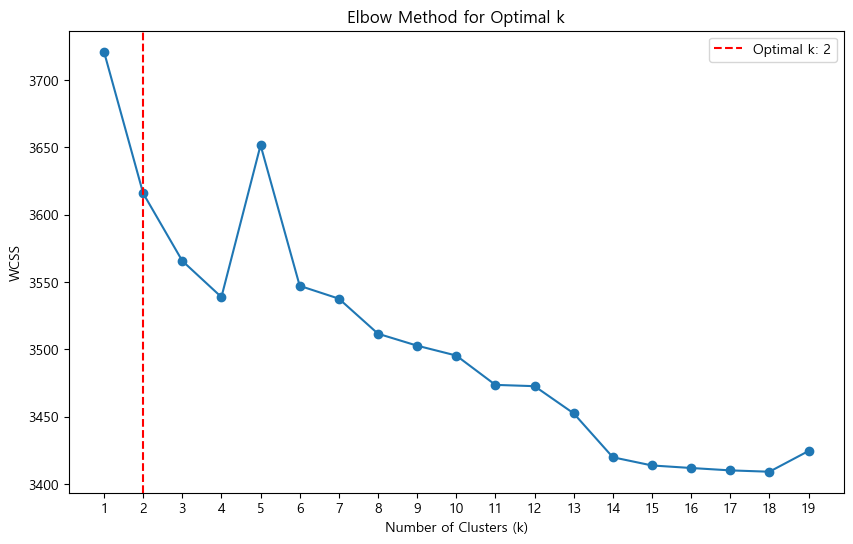

엘보우 포인트 k: 2


In [130]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import numpy as np

wcss = []
k_range = range(1, 20)  # k 값을 1에서 10까지 시도

for k in k_range:
    kmeans = KMeans(n_clusters=k,init='k-means++',random_state=42)
    kmeans.fit(tfidf_matrix)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(k_range, wcss, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS')
plt.xticks(k_range)


# 엘보우 포인트 자동 감지
diff = np.diff(wcss)  # 1차 미분
diff2 = np.diff(diff<0)  # 2차 미분
elbow_index = np.argmin(diff2) + 2  # 엘보우 포인트 인덱스 (k는 2부터 시작)

# 엘보우 포인트 표시
plt.axvline(x=elbow_index, color='red', linestyle='--', label=f'Optimal k: {elbow_index}')
plt.legend()
plt.show()

print(f"엘보우 포인트 k: {elbow_index}")
#Wcss의 감소가 완만해지는 elbow 지점을 k=4~5이므로 k=4가 적절하다.

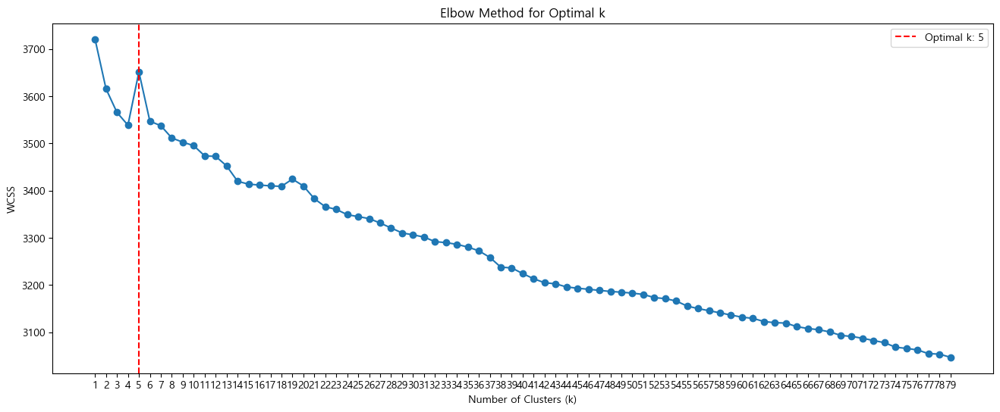

엘보우 포인트 k: 5


In [131]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import numpy as np

wcss = []
k_range = range(1, 80)  # k 값을 1에서 10까지 시도

for k in k_range:
    kmeans = KMeans(n_clusters=k,init='k-means++',random_state=42)
    kmeans.fit(tfidf_matrix)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(16, 6))
plt.plot(k_range, wcss, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS')
plt.xticks(k_range)


# 엘보우 포인트 자동 감지
diff = np.diff(wcss)  # 1차 미분
diff2 = np.diff(diff)  # 2차 미분
elbow_index = np.argmin(diff2) + 2  # 엘보우 포인트 인덱스 (k는 2부터 시작)

# 엘보우 포인트 표시
plt.axvline(x=elbow_index, color='red', linestyle='--', label=f'Optimal k: {elbow_index}')
plt.legend()
plt.show()

print(f"엘보우 포인트 k: {elbow_index}")
#Wcss의 감소가 완만해지는 elbow 지점을 k=4~5이므로 k=4가 적절하다.

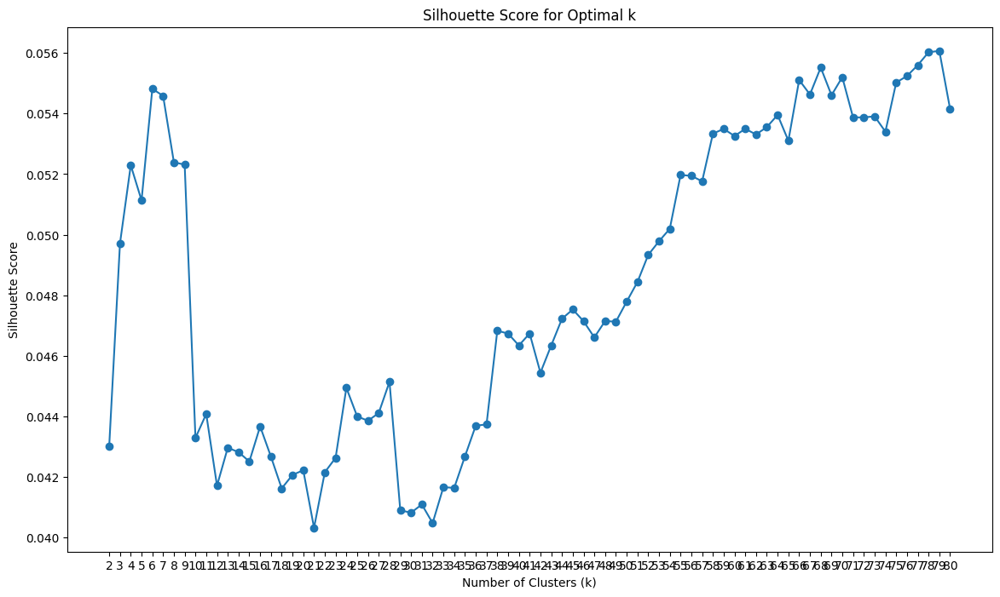

In [19]:
from sklearn.metrics import silhouette_score

silhouette_scores = []

for k in range(2, 81):  # k 값을 2에서 10까지 시도
    kmeans = KMeans(n_clusters=k,init='k-means++', random_state=42)
    kmeans.fit(tfidf_matrix)
    silhouette_scores.append(silhouette_score(tfidf_matrix, kmeans.labels_))

plt.figure(figsize=(14, 8))
plt.plot(range(2, 81), silhouette_scores, marker='o')
plt.title('Silhouette Score for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.xticks(range(2,81))
plt.show()

# 실루엣 계수 해석:
# 0.5 이상: 잘 정의된 클러스터로 간주
# 0.25 ~ 0.5: 약간의 겹침이 있지만 여전히 유의미한 클러스터
# 0.25 이하: 클러스터링 결과가 좋지 않음

In [22]:
# 최적의 k 값 찾기
optimal_k = range(2, 81)[np.argmax(silhouette_scores)]
optimal_score = max(silhouette_scores)
print(optimal_k)

79


너무 많지 않은 k값중에서 적절한 k값은 실루엣 계수 계산에서는 k=6 정도가 적당하고 엘보우 포인트 구하는 것에서도 6정도면 나쁘지 않으므로 k=6으로 진행한다.

갭 통계량 (Gap Statistic)

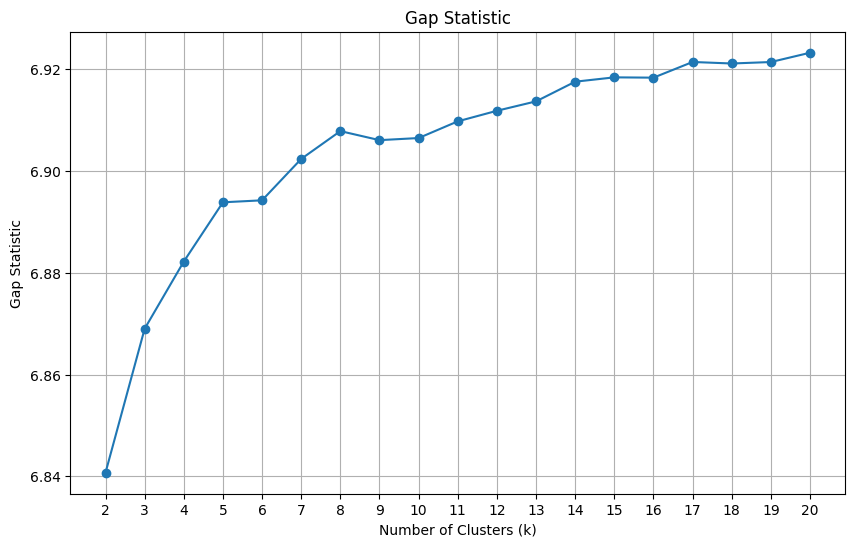

In [53]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

def gap_statistic(X, k_max):
    gaps = np.zeros(k_max - 1)
    for k in range(1, k_max):
        # Fit the model
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(X)
        # WCSS for the observed data
        wcss = kmeans.inertia_

        # Generate random data and compute WCSS
        random_data = np.random.random_sample(size=X.shape)
        kmeans_random = KMeans(n_clusters=k, random_state=42)
        kmeans_random.fit(random_data)
        random_wcss = kmeans_random.inertia_

        # Gap statistic
        gaps[k - 1] = np.log(random_wcss) - np.log(wcss)

    return gaps


gaps = gap_statistic(tfidf_matrix, 20)

# Plotting the gap statistic
plt.figure(figsize=(10, 6))
plt.plot(range(2, 21), gaps, marker='o')
plt.title('Gap Statistic')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Gap Statistic')
plt.xticks(range(2, 21))
plt.grid()
plt.show()

다면체 분석 (Davies-Bouldin Index)

ㄴDBI 값 해석


DBI < 0.5: 클러스터 간의 분리도가 매우 높고, 클러스터 내의 응집도도 우수합니다. 이상적인 클러스터링 결과입니다.

0.5 ≤ DBI < 1.0: 클러스터 간의 분리도와 응집도가 적당한 수준입니다. 클러스터링이 괜찮지만 개선의 여지가 있을 수 있습니다.

DBI ≥ 1.0: 클러스터 간의 분리도가 낮고, 클러스터 내의 응집도가 떨어질 수 있습니다. 이 경우, 클러스터링 품질이 좋지 않다고 판단할 수 있습니다.

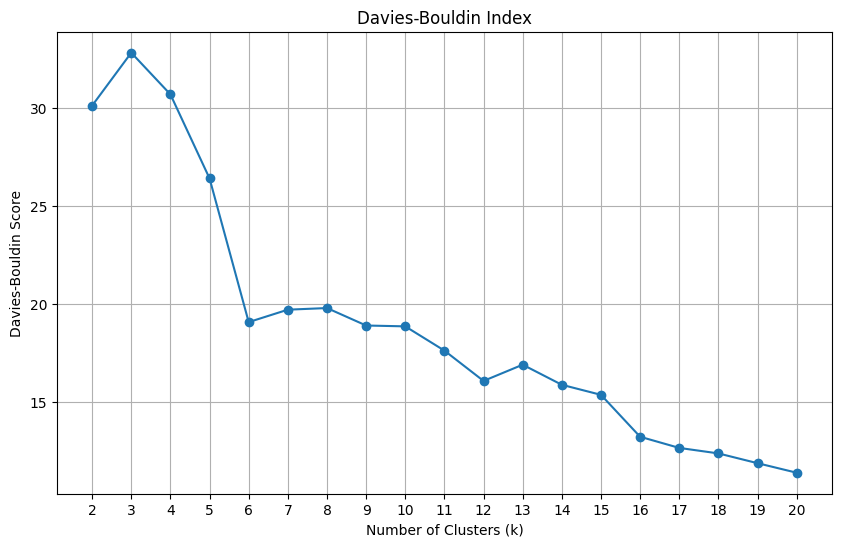

In [60]:
from sklearn.metrics import davies_bouldin_score
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt

def davies_bouldin_chunked(X, k_range, chunk_size=1000):
    db_scores = []
    
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        
        # 전체 데이터의 클러스터 레이블 저장
        labels = np.zeros(X.shape[0])
        
        # 데이터를 청크로 나누어 처리
        for i in range(0, X.shape[0], chunk_size):
            # 현재 청크 데이터 추출
            doc_chunk = X[i:i + chunk_size]
            
            # K-Means 클러스터링
            kmeans.fit(doc_chunk)
            chunk_labels = kmeans.labels_
            
            # 클러스터 레이블 저장
            labels[i:i + chunk_size] = chunk_labels
        
        # Davies-Bouldin score 계산
        db_index = davies_bouldin_score(X.toarray(), labels)
        db_scores.append(db_index)

    return db_scores

# TF-IDF 행렬을 사용하여 Davies-Bouldin Index 계산
db_scores = davies_bouldin_chunked(tfidf_matrix, range(2, 21))

# Plotting Davies-Bouldin Index
plt.figure(figsize=(10, 6))
plt.plot(range(2, 21), db_scores, marker='o')
plt.title('Davies-Bouldin Index')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Davies-Bouldin Score')
plt.xticks(range(2, 21))
plt.grid()
plt.show()

비율적 내적 거리 (Calinski-Harabasz Index)

ㄴ가장 높을 때 군집화가 잘된 것이다.

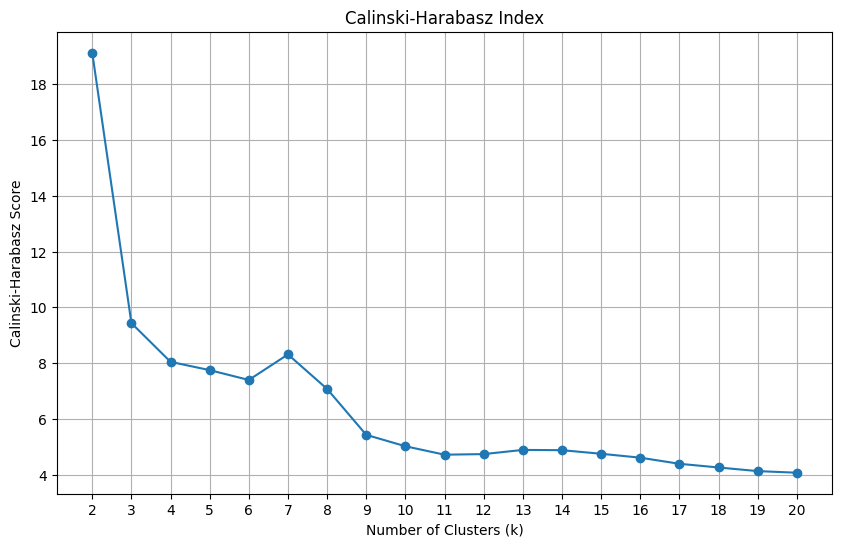

In [59]:
from sklearn.metrics import calinski_harabasz_score
from sklearn.cluster import KMeans
import numpy as np

def calinski_harabasz_chunked(X, k_range, chunk_size=1000):
    ch_scores = []
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        ch_index = []
        # 데이터셋을 청크로 나누어 처리
        for i in range(0, X.shape[0], chunk_size):
            chunk = X[i:i + chunk_size]
            kmeans.fit(chunk)
            labels = kmeans.labels_  # 클러스터 레이블
            ch_index.append(calinski_harabasz_score(chunk.toarray(), labels))  # 밀집행렬로 변환하여 계산
        # 평균값 계산
        ch_scores.append(np.mean(ch_index))

    return ch_scores

ch_scores = calinski_harabasz_chunked(tfidf_matrix, range(2, 21))

# Plotting Calinski-Harabasz Index
plt.figure(figsize=(10, 6))
plt.plot(range(2, 21), ch_scores, marker='o')
plt.title('Calinski-Harabasz Index')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Calinski-Harabasz Score')
plt.xticks(range(2, 21))
plt.grid()
plt.show()

호르스트 방법 (Hierarchical Clustering)

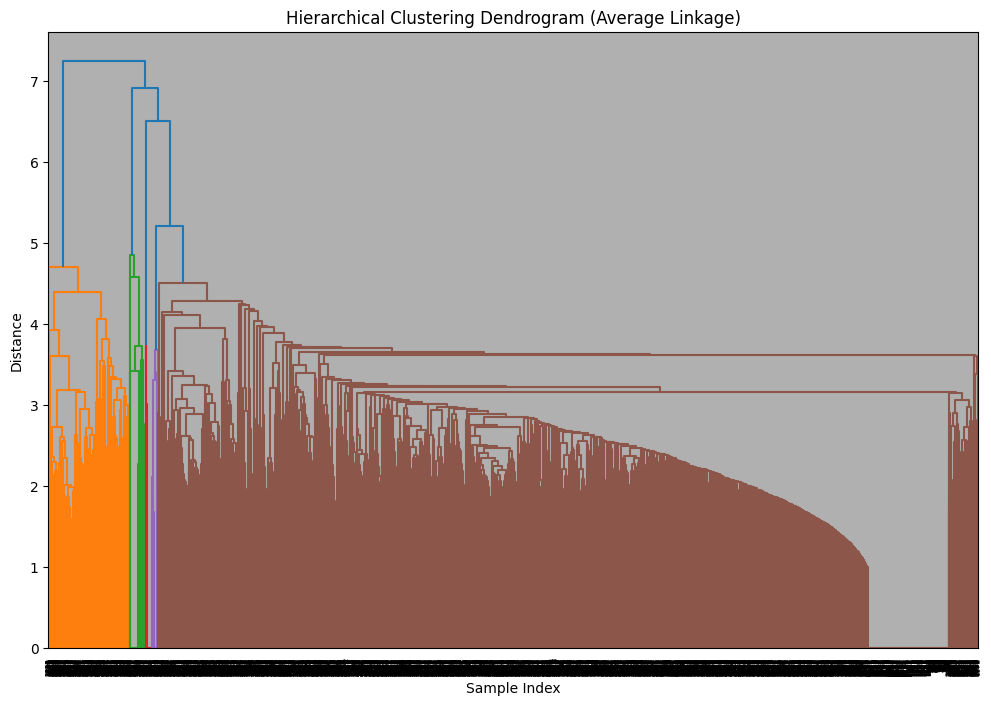

In [67]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch
from sklearn.metrics.pairwise import cosine_similarity

# TF-IDF 행렬이 sparse 형태인 경우 밀집 행렬로 변환하고 numpy array로 변환
dense_tfidf_matrix = np.asarray(tfidf_matrix.todense())

# 코사인 유사도 계산
cosine_similarities = cosine_similarity(dense_tfidf_matrix)

# 계층적 군집화 (average linkage 사용)
linkage_matrix = sch.linkage(1 - cosine_similarities, method='average')

# 덴드로그램 그리기
plt.figure(figsize=(12, 8))
dendrogram = sch.dendrogram(linkage_matrix)
plt.title('Hierarchical Clustering Dendrogram (Average Linkage)')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.grid()
plt.show()

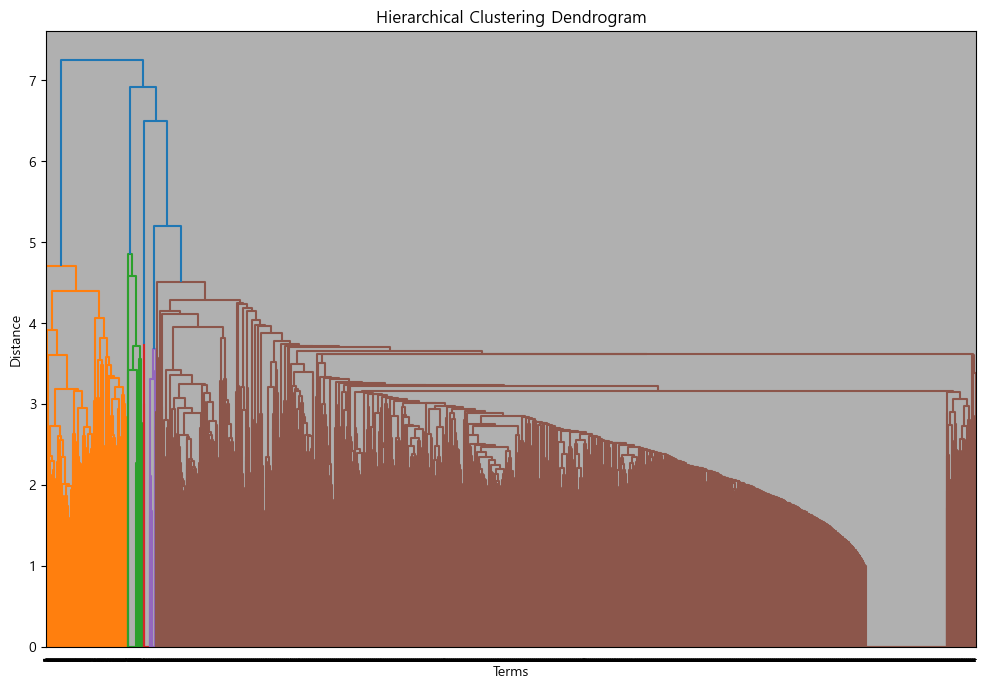

In [33]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import scipy.cluster.hierarchy as sch
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

cluster_labels = km.labels_

# 계층적 군집화 (average linkage 사용)
dense_tfidf_matrix = np.asarray(tfidf_matrix.todense())
cosine_similarities = cosine_similarity(dense_tfidf_matrix)
linkage_matrix = sch.linkage(1 - cosine_similarities, method='average')

# 덴드로그램 그리기
plt.figure(figsize=(12, 8))
dendrogram = sch.dendrogram(linkage_matrix, labels=cluster_labels.astype(str), leaf_rotation=90)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Terms')
plt.ylabel('Distance')
plt.grid()
plt.show()


In [43]:
import numpy as np
import networkx as nx
from sklearn.metrics.pairwise import cosine_similarity

# 네트워크 그래프 생성
G = nx.Graph()

# 각 클러스터에서 단어를 추출하고 유사도로 상하위 단어 분류
upper_words = []
lower_words = []

# TF-IDF 밀집 행렬
dense_tfidf_matrix = np.asarray(tfidf_matrix.todense())

for cluster in range(num_clusters):
    top_terms = [terms[ind] for ind in order_centroids[cluster, :10]]
    
    for term in top_terms:
        G.add_node(term)
        term_index = np.where(terms == term)[0][0]
        
        # 각 단어의 유사도를 다른 클러스터의 단어와 비교
        for other_cluster in range(num_clusters):
            if other_cluster != cluster:
                other_top_terms = [terms[ind] for ind in order_centroids[other_cluster, :10]]
                for other_term in other_top_terms:
                    other_term_index = np.where(terms == other_term)[0][0]
                    
                    # 밀집 행렬을 사용하여 유사도 계산
                    similarity = cosine_similarity(dense_tfidf_matrix[term_index].reshape(1, -1), 
                                                   dense_tfidf_matrix[other_term_index].reshape(1, -1))
                    
                    # 유사도 기준으로 상위 단어와 하위 단어 결정
                    if similarity > 0.3:  # 유사도 기준 설정
                        upper_words.append(term)
                        G.add_edge(term, other_term)

IndexError: index 23684 is out of bounds for axis 0 with size 4189

In [37]:
tfidf_matrix.shape

(4189, 26461)

In [35]:
print(len(terms))

26461


In [36]:
print(f"term_index: {term_index}, other_term_index: {other_term_index}")


term_index: 23684, other_term_index: 8798


In [40]:
tfidf_matrix[term_index]

IndexError: row index (23684) out of range

In [39]:
other_term_index

8798

In [38]:
term_index

23684

In [ ]:
from sklearn.cluster import AgglomerativeClustering

agg_clustering = AgglomerativeClustering(n_clusters=num_clusters, affinity='precomputed', linkage='average')
cluster_labels = agg_clustering.fit_predict(1 - cosine_similarities)

# 클러스터 결과를 DataFrame으로 변환
terms = vectorizer.get_feature_names_out()
clustered_terms = pd.DataFrame({'Term': terms, 'Cluster': cluster_labels})

# 각 클러스터에 포함되는 단어 목록 출력
for cluster in range(num_clusters):
    words_in_cluster = clustered_terms[clustered_terms['Cluster'] == cluster]['Term'].values
    print(f"Cluster {cluster}: {', '.join(words_in_cluster)}")

In [8]:
nx.draw_networkx_nodes?

Signature:
nx.draw_networkx_nodes(
    G,
    pos,
    nodelist=None,
    node_size=300,
    node_color='#1f78b4',
    node_shape='o',
    alpha=None,
    cmap=None,
    vmin=None,
    vmax=None,
    ax=None,
    linewidths=None,
    edgecolors=None,
    label=None,
    margins=None,
    hide_ticks=True,
)
Docstring:
Draw the nodes of the graph G.

This draws only the nodes of the graph G.

Parameters
----------
G : graph
    A networkx graph

pos : dictionary
    A dictionary with nodes as keys and positions as values.
    Positions should be sequences of length 2.

ax : Matplotlib Axes object, optional
    Draw the graph in the specified Matplotlib axes.

nodelist : list (default list(G))
    Draw only specified nodes

node_size : scalar or array (default=300)
    Size of nodes.  If an array it must be the same length as nodelist.

node_color : color or array of colors (default='#1f78b4')
    Node color. Can be a single color or a sequence of colors with the same
    length as nodeli

TF-IDF 상위 100 가지고 네트워크 분석 그리기

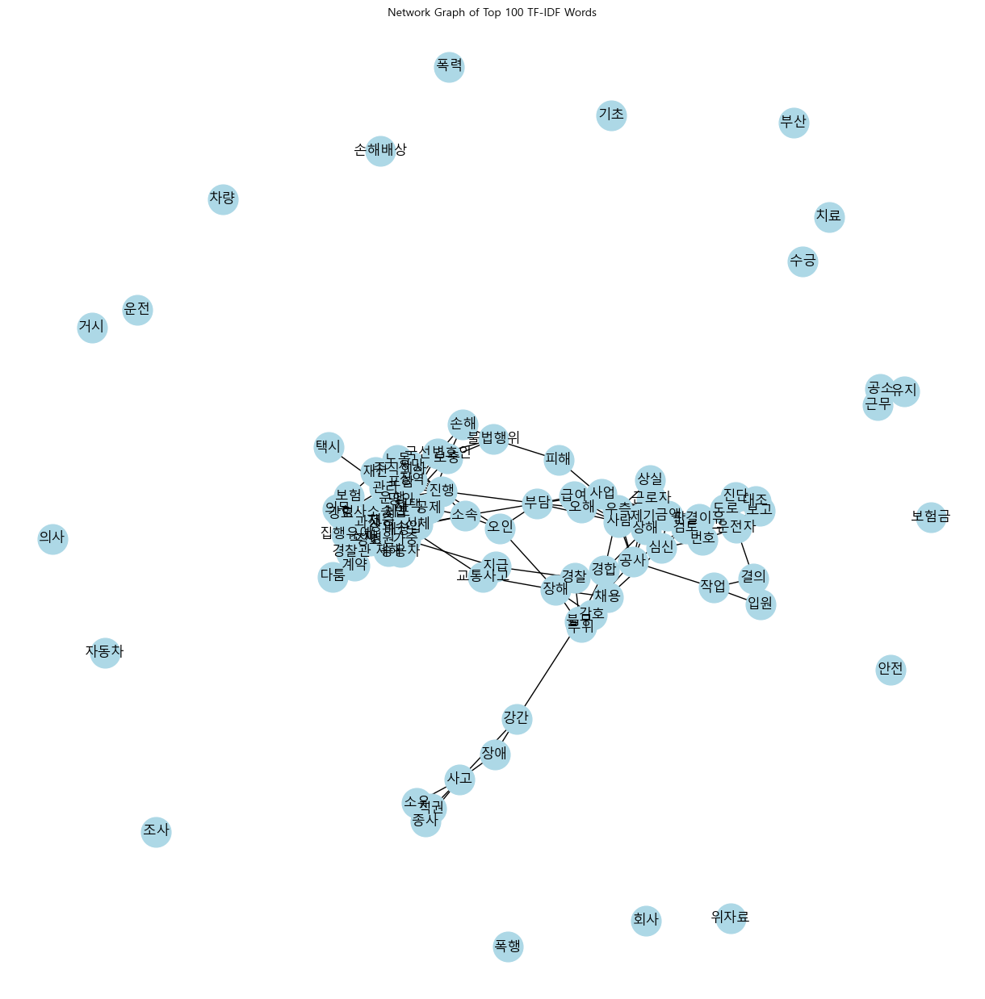

In [31]:
# 1. 상위 100개 단어 추출
mean_tfidf = np.mean(tfidf_matrix, axis=0)
top_100_indices = np.argsort(mean_tfidf.A1)[-100:]  # 상위 100개 단어 인덱스
top_100_words = vectorizer.get_feature_names_out()[top_100_indices]

# 2. 상위 100개 단어의 TF-IDF 벡터 추출
top_100_tfidf = tfidf_matrix[:, top_100_indices]

# 3. 상위 100개 단어 간의 유사도 행렬 생성
similarity_matrix = cosine_similarity(top_100_tfidf)

# 4. 네트워크 그래프 생성
G = nx.Graph()

# 상위 100개 단어를 노드로 추가
for idx, word in enumerate(top_100_words):
    G.add_node(word)

# 유사도가 0.3 이상인 경우 엣지 추가 (threshold 조정 가능)
threshold = 0.3
for i in range(len(top_100_words)):
    for j in range(i + 1, len(top_100_words)):
        if similarity_matrix[i, j] >= threshold:
            G.add_edge(top_100_words[i], top_100_words[j], weight=similarity_matrix[i, j])

# 5. 네트워크 시각화
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G)  # 레이아웃 설정
nx.draw(G, pos, with_labels=True, node_size=700, node_color='lightblue', font_family='Malgun Gothic')
plt.title('Network Graph of Top 100 TF-IDF Words',fontproperties=font_prop)
plt.show()

클러스터별 상위 10개 단어:

클러스터 1:
 파견
 근로자
 평화
 산업
 근로
 안전
 순찰
 업주
 엔비
 신우
 사출
 사업
 고용
 의무
 계약
 외주
 배려
 주가
 복지
 보호

클러스터 2:
 보험
 계약
 자동차
 보험금
 지급
 사고
 회사
 손해
 의무
 보험료
 상해
 금액
 가입
 차량
 사망
 상법
 대인배
 특약
 망인
 운전

클러스터 3:
 망인
 산소
 호흡
 혈증
 가제
 프로포폴
 마취
 을제
 수술
 포화
 투여
 곤란
 삽관술
 뇌손상
 정맥주사
 마취제
 도미
 환자
 맥박
 대학교

클러스터 4:
 기초
 손해배상
 폭행
 상해
 오인
 다툼
 징역
 국선변호인
 폭력
 회사
 유지
 공소
 채증
 오해
 의사
 강간
 직권
 채택
 형사소송법
 채용

클러스터 5:
 보험
 지급
 보험금
 사고
 급여
 장해
 재해
 계약
 사망
 자동차
 손해
 상해
 망인
 금액
 치료
 손해배상
 산재
 후유
 차량
 채권

클러스터 6:
 차량
 운전
 사고
 자동차
 도로
 운행
 승용차
 교통사고
 도주
 운전자
 진행
 도로교통법
 가중
 택시
 충격
 정차
 차선
 구호
 신호
 교통

클러스터 7:
 거시
 판결이유
 유지
 손해배상
 수행자
 당원
 배하
 과실상계
 옆집
 오빠
 국선
 공범
 채증
 대조
 개요
 오인
 운전사
 인천
 주임
 준용

클러스터 8:
 의심
 증명력
 합리
 형성
 형사재판
 간접
 살인
 간다
 여지
 배제
 증명
 의문
 경험칙
 고찰
 확신
 단독
 허용
 베란다
 제기
 설령

클러스터 9:
 보충
 경과
 유서
 도과
 거시
 지난
 국선변호인
 한도
 준비서면
 남편
 후의
 체포영장
 취사
 폭행
 채증
 노임
 간도
 산부인과
 수익
 경제범죄

클러스터 10:
 사고
 손해
 치료
 노동
 지급
 손해배상
 상실
 수입
 배상
 일용
 종사
 공제
 위자료
 상해
 병원
 불법행위
 재산
 장해
 의무
 입원


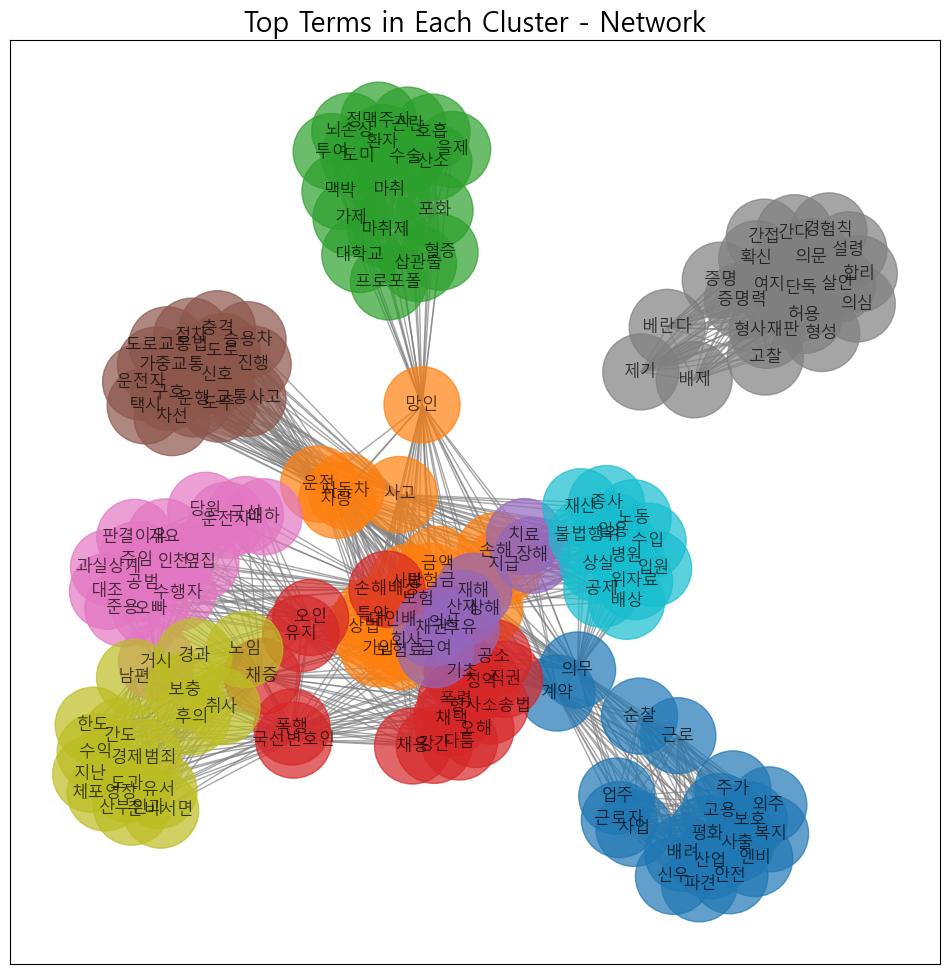

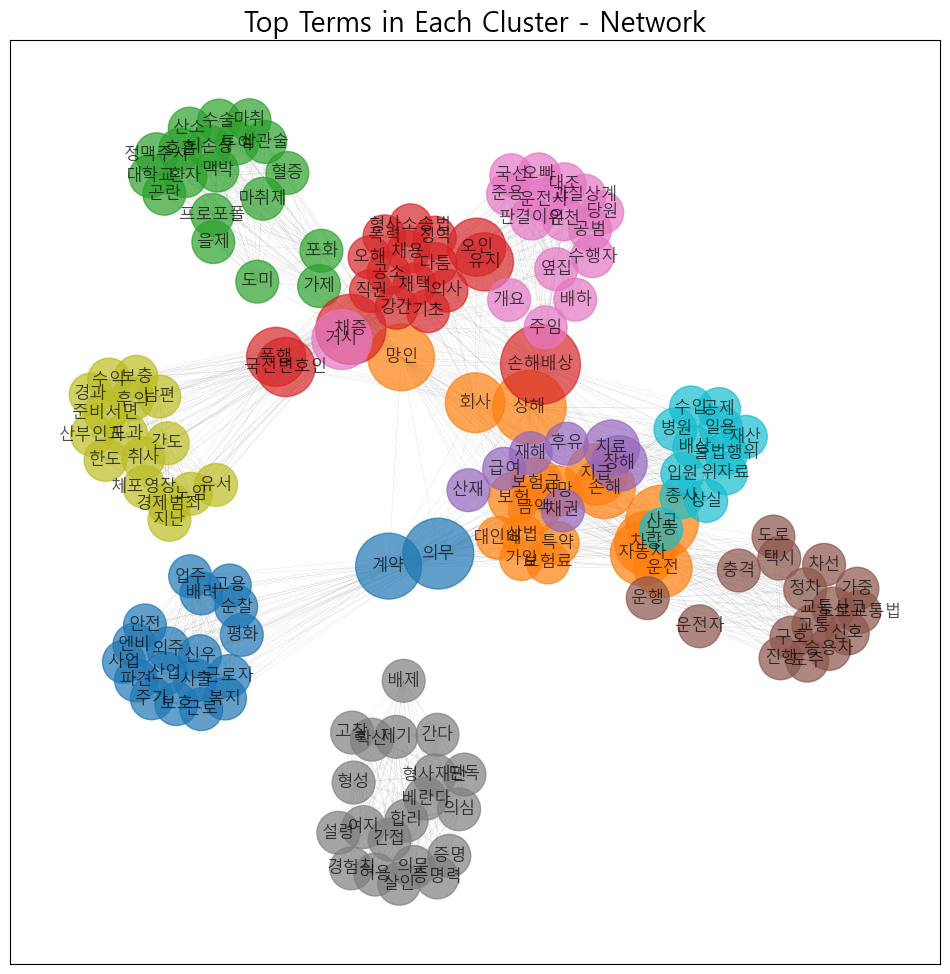

In [33]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# TF-IDF 벡터라이저 적용
vectorizer = TfidfVectorizer(max_df=0.95,min_df=2)
tfidf_matrix = vectorizer.fit_transform(normalized_cleaned)

# K-Means 클러스터링 수행 (k=10로 설정)
num_clusters = 10
km = KMeans(n_clusters=num_clusters, random_state=42)
km.fit(tfidf_matrix)

# 클러스터별 상위 단어 및 그 단어들의 TF-IDF 값 확인
order_centroids = km.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names_out()

cluster_top_terms = {}

print("클러스터별 상위 10개 단어:")
for i in range(num_clusters):
    print(f"\n클러스터 {i+1}:")
    top_terms = [terms[ind] for ind in order_centroids[i, :20]]
    cluster_top_terms[i] = top_terms  # 클러스터별 상위 10개 단어 저장
    for term in top_terms:
        print(f" {term}")

tfidf_cluster_matrix = np.zeros((num_clusters, len(terms)))

for cluster in range(num_clusters):
    for term in cluster_top_terms[cluster]:  # 클러스터 번호가 1부터 시작하므로 인덱스 조정
        if term in terms:
            term_index = np.where(terms == term)[0][0]
            tfidf_cluster_matrix[cluster, term_index] = 1  # 클러스터에서의 단어 존재 여부를 1로 표시

# 클러스터 간 유사도 계산
similarity_matrix = cosine_similarity(tfidf_cluster_matrix)


# 클러스터 색상 지정
num_clusters = len(cluster_top_terms)  # 클러스터 수에 맞게 설정
cluster_colors = plt.get_cmap('tab10', num_clusters)  # 색상 맵 생성

G = nx.Graph()

# 클러스터별 상위 단어들 사이의 엣지를 추가
for cluster, top_terms in cluster_top_terms.items():
    for i in range(len(top_terms)):
        for j in range(i + 1, len(top_terms)):
            G.add_edge(top_terms[i], top_terms[j], weight=1)  # 단순 엣지 추가 (공동 출현 가정)

# 노드 색상 맵 생성
color_map = []
for node in G.nodes():
    # 노드가 클러스터의 상위 단어인 경우 색상 지정
    for cluster_index, top_terms in cluster_top_terms.items():
        if node in top_terms:
            color_map.append(cluster_colors(cluster_index))  # 클러스터 색상 추가
            break
    else:
        color_map.append("gray")  # 클러스터 상위 단어가 아닌 노드는 회색으로 표시

# 네트워크 시각화
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, k=0.5, iterations=50)

# 노드 및 엣지 그리기, 한글 폰트 적용
nx.draw_networkx(G, pos, with_labels=True, node_size=3000, node_color=color_map, font_size=12, font_color="black", edge_color="gray", alpha=0.7, font_family=font_prop.get_name())

# 제목에도 한글 폰트 적용
plt.title("Top Terms in Each Cluster - Network", fontproperties=font_prop, fontsize=20)
plt.show()


# 클러스터 색상 지정
num_clusters = len(cluster_top_terms)  # 클러스터 수에 맞게 설정
cluster_colors = plt.get_cmap('tab10', num_clusters)  # 색상 맵 생성

G = nx.Graph()

# 클러스터별 상위 단어들 사이의 엣지를 추가
for cluster, top_terms in cluster_top_terms.items():
    for i in range(len(top_terms)):
        for j in range(i + 1, len(top_terms)):
            G.add_edge(top_terms[i], top_terms[j], weight=1)  # 단순 엣지 추가 (공동 출현 가정)

# 노드 색상 맵 생성
color_map = []
for node in G.nodes():
    # 노드가 클러스터의 상위 단어인 경우 색상 지정
    for cluster_index, top_terms in cluster_top_terms.items():
        if node in top_terms:
            color_map.append(cluster_colors(cluster_index))  # 클러스터 색상 추가
            break
    else:
        color_map.append("gray")  # 클러스터 상위 단어가 아닌 노드는 회색으로 표시

# 네트워크 시각화
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, k=0.5, iterations=50)

# 노드 크기 설정 (degree를 기반으로)
node_sizes = [d for n, d in G.degree()]

# 노드 및 엣지 그리기, 한글 폰트 적용
nx.draw_networkx(G, pos, with_labels=True, node_size=[d * 50 for d in node_sizes], node_color=color_map, font_size=12, font_color="black", edge_color="gray", alpha=0.7, width=0.1, font_family=font_prop.get_name())

# 제목에도 한글 폰트 적용
plt.title("Top Terms in Each Cluster - Network", fontproperties=font_prop, fontsize=20)
plt.show()

# ㅇㅇ

In [115]:
cleaned = [doc.split() for doc in normalized_cleaned]  # 공백으로 분리
cleaned

[['승소',
  '적법',
  '승소',
  '상소',
  '두',
  '취소',
  '승소',
  '여',
  '로써',
  '불복',
  '존재',
  '과세표준',
  '증명책임',
  '사업',
  '연도',
  '법인세',
  '가산',
  '사업',
  '연도',
  '법인세',
  '민세',
  '가산',
  '부과',
  '세법',
  '호로',
  '개정',
  '전의',
  '국내',
  '사업',
  '외국',
  '사업',
  '연도',
  '소득',
  '법인세',
  '과세표준',
  '국내',
  '소득',
  '합계',
  '항의',
  '징수',
  '국내',
  '소득',
  '금액',
  '외한',
  '호의',
  '금액',
  '소득',
  '순차',
  '공제',
  '금액',
  '선박',
  '항공기',
  '외국',
  '항행',
  '소득',
  '외국',
  '본점',
  '사무소',
  '외국',
  '우리나라',
  '운용',
  '선박',
  '항공기',
  '면제',
  '상호',
  '면세',
  '세법',
  '외국',
  '국내',
  '소득',
  '열거',
  '본문',
  '외국',
  '영위',
  '사업',
  '소득',
  '조약',
  '국내',
  '원천',
  '사업',
  '소득',
  '과세',
  '소득',
  '국내',
  '원천',
  '사업',
  '소득',
  '위임',
  '세법',
  '시행',
  '령',
  '국내',
  '원천',
  '사업',
  '소득',
  '하나로',
  '외국',
  '국내',
  '국외',
  '선박',
  '국제',
  '운송업',
  '영위',
  '국내',
  '승선',
  '여객',
  '선적',
  '화물',
  '수입',
  '금액',
  '판정',
  '국내',
  '소득',
  '세법',
  '호의',
  '소득',
  '소득',
  '목',
  '소득',
  '국내',
  '원천',
  '소득',
  '차',
  '목'

In [116]:
normalized_cleaned

['승소 적법 승소 상소 두 취소 승소 여 로써 불복 존재 과세표준 증명책임 사업 연도 법인세 가산 사업 연도 법인세 민세 가산 부과 세법 호로 개정 전의 국내 사업 외국 사업 연도 소득 법인세 과세표준 국내 소득 합계 항의 징수 국내 소득 금액 외한 호의 금액 소득 순차 공제 금액 선박 항공기 외국 항행 소득 외국 본점 사무소 외국 우리나라 운용 선박 항공기 면제 상호 면세 세법 외국 국내 소득 열거 본문 외국 영위 사업 소득 조약 국내 원천 사업 소득 과세 소득 국내 원천 사업 소득 위임 세법 시행 령 국내 원천 사업 소득 하나로 외국 국내 국외 선박 국제 운송업 영위 국내 승선 여객 선적 화물 수입 금액 판정 국내 소득 세법 호의 소득 소득 목 소득 국내 원천 소득 차 목 국내 원천 소득 하나로 목 목 국내 행 사업 국내 인적 용역 국내 자산 경제 소득 소득 소득 사업 연도 손익계산서 매출 수익 영위 자동차 해상 운송 사업 매출 수익 국내 사업 행 사업 인적 용역 자산 경제 소득 세법 차 목 국내 원천 소득 선박 외국 항행 소득 증명책임 전제 증명 매출 수익 선박 외국 항행 소득 공제 수긍 사업 연도 매출 수익 국내 소득 체계 국내 사업 외국 국내 국외 선박 국제 운송업 영위 사업 소득 국내 승선 여객 선적 화물 소득 세법 외국 국내 원천 사업 소득 사업 연도 소득 법인세 과세표준 국외 승선 여객 선적 화물 소득 국내 원천 사업 소득 법인세 과세표준 국내 원천 소득 세법 차 목 국내 국외 불문 국제 운송업 소득 국내 소득 사업 연도 국내 국외 선박 화물 운송 사업 영위 사업 연도 손익계산서 매출 수익 화물 국외 선적 소득 개연 매출 수익 화물 국내 선적 소득 구성 과세 관청 증명 매출 수익 국내 소득 보기 선박 외국 항행 소득 증명책임 과세 취소소송 과세 요건사실 존부 과세 과세표준 증명책임 과세 관청 국내 사업 외국 사업 연도 소득 법인세 과세표준 기초 국내 원천 소득 합계 증명책임 과세 관청 외국 국내 원천 소득 합계 선박 외국 항행 소득 존재 과세 

In [117]:
from gensim import corpora
from gensim.models import LdaModel

# 사전(dictionary) 생성 및 코퍼스(corpus) 구성
dictionary = corpora.Dictionary(cleaned)
corpus = [dictionary.doc2bow(text) for text in cleaned]

# LDA 모델 설정 및 학습
num_topics = 6
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, random_state=42)

# 주제별 상위 단어 출력
for idx, topic in lda_model.print_topics(num_words=10):
    print(f"Topic {idx + 1}: {topic}")

Topic 1: 0.007*"직원" + 0.007*"집회" + 0.006*"대통령" + 0.005*"폭력" + 0.004*"경찰" + 0.004*"국민" + 0.004*"청와대" + 0.004*"폭행" + 0.004*"죄" + 0.004*"시위"
Topic 2: 0.009*"부외" + 0.008*"회사" + 0.008*"금고" + 0.008*"죄" + 0.007*"가중" + 0.006*"대출" + 0.005*"거래" + 0.005*"관리" + 0.005*"수사" + 0.005*"입금"
Topic 3: 0.059*"보험" + 0.022*"계약" + 0.021*"사고" + 0.019*"지급" + 0.012*"보험금" + 0.012*"자동차" + 0.010*"손해" + 0.009*"장해" + 0.008*"치료" + 0.007*"주식회사"
Topic 4: 0.022*"사고" + 0.012*"치료" + 0.009*"손해" + 0.007*"수술" + 0.007*"의무" + 0.007*"차량" + 0.006*"병원" + 0.006*"지급" + 0.005*"망인" + 0.005*"노동"
Topic 5: 0.009*"회사" + 0.008*"징계" + 0.008*"사업" + 0.007*"임금" + 0.007*"수행" + 0.007*"지급" + 0.007*"근로자" + 0.007*"작업" + 0.006*"관리" + 0.005*"의무"
Topic 6: 0.007*"죄" + 0.007*"거래" + 0.006*"칼" + 0.006*"보고" + 0.005*"폭행" + 0.005*"직원" + 0.005*"수사" + 0.005*"회사" + 0.005*"금고" + 0.004*"형"


In [118]:
import pyLDAvis.gensim_models
import pyLDAvis

# pyLDAvis를 사용한 LDA 시각화
pyLDAvis.enable_notebook()  # Jupyter Notebook에서 사용 시
lda_vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary)
pyLDAvis.display(lda_vis)


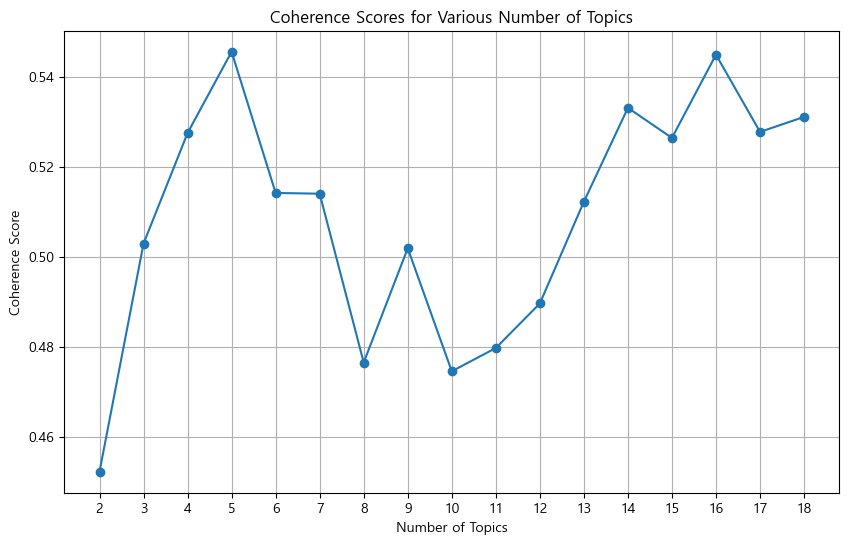

Optimal number of topics: 5
Highest Coherence Score: 0.5455368009213111


In [119]:
from gensim.models.coherencemodel import CoherenceModel

# Grid Search를 위한 주제 수 범위 설정
num_topics_range = range(2, 19)  # 예: 2에서 19까지의 주제 수
coherence_scores = []

# 각 주제 수에 대해 LDA 모델 학습 및 Coherence Score 계산
for num_topics in num_topics_range:
    lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, random_state=42)
    coherence_model = CoherenceModel(model=lda_model, texts=cleaned, dictionary=dictionary, coherence='c_v')
    coherence_scores.append(coherence_model.get_coherence())

# Coherence Score 시각화
plt.figure(figsize=(10, 6))
plt.plot(num_topics_range, coherence_scores, marker='o')
plt.xticks(num_topics_range)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.title("Coherence Scores for Various Number of Topics")
plt.grid()
plt.show()

# 최적의 주제 수 및 해당 Coherence Score 출력
optimal_num_topics = num_topics_range[coherence_scores.index(max(coherence_scores))]
print(f"Optimal number of topics: {optimal_num_topics}")
print(f"Highest Coherence Score: {max(coherence_scores)}")

In [121]:
# LDA 모델 설정 및 학습
num_topics = 5
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, random_state=42)

# 주제별 상위 단어 출력
for idx, topic in lda_model.print_topics(num_words=10):
    print(f"Topic {idx + 1}: {topic}")

# pyLDAvis를 사용한 LDA 시각화
pyLDAvis.enable_notebook()  # Jupyter Notebook에서 사용 시
lda_vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary)
pyLDAvis.display(lda_vis)

Topic 1: 0.008*"직원" + 0.006*"폭행" + 0.005*"폭력" + 0.005*"죄" + 0.004*"대통령" + 0.004*"집회" + 0.004*"회사" + 0.004*"수사" + 0.004*"볼" + 0.004*"보고"
Topic 2: 0.009*"거래" + 0.009*"금고" + 0.009*"죄" + 0.008*"부외" + 0.006*"수사" + 0.006*"회사" + 0.006*"보고" + 0.006*"형" + 0.006*"가중" + 0.005*"대출"
Topic 3: 0.052*"보험" + 0.022*"사고" + 0.020*"계약" + 0.019*"지급" + 0.011*"보험금" + 0.010*"자동차" + 0.010*"손해" + 0.010*"치료" + 0.008*"장해" + 0.007*"차량"
Topic 4: 0.017*"사고" + 0.009*"치료" + 0.008*"손해" + 0.006*"의무" + 0.006*"수술" + 0.006*"차량" + 0.005*"병원" + 0.005*"지급" + 0.005*"칼" + 0.004*"부위"
Topic 5: 0.008*"회사" + 0.007*"징계" + 0.007*"수행" + 0.006*"사업" + 0.006*"임금" + 0.006*"근로자" + 0.006*"지급" + 0.005*"작업" + 0.005*"관리" + 0.004*"지시"


In [109]:
# LDA 모델 설정 및 학습
num_topics = 7
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, random_state=42)

# 주제별 상위 단어 출력
for idx, topic in lda_model.print_topics(num_words=10):
    print(f"Topic {idx + 1}: {topic}")

# pyLDAvis를 사용한 LDA 시각화
pyLDAvis.enable_notebook()  # Jupyter Notebook에서 사용 시
lda_vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary)
pyLDAvis.display(lda_vis)

Topic 1: 0.007*"징계" + 0.006*"폭력" + 0.006*"집회" + 0.005*"죄" + 0.004*"시위" + 0.004*"경찰" + 0.004*"도로" + 0.004*"칼" + 0.004*"관리" + 0.004*"상해"
Topic 2: 0.019*"사고" + 0.011*"수술" + 0.011*"치료" + 0.008*"차량" + 0.007*"망인" + 0.007*"병원" + 0.007*"의무" + 0.005*"회사" + 0.005*"사망" + 0.005*"손해"
Topic 3: 0.015*"거래" + 0.014*"회사" + 0.013*"금고" + 0.011*"부외" + 0.008*"시스템" + 0.008*"대출" + 0.007*"입금" + 0.007*"관리" + 0.006*"차명계좌" + 0.006*"지급"
Topic 4: 0.029*"사고" + 0.020*"보험" + 0.018*"지급" + 0.014*"손해" + 0.013*"치료" + 0.012*"장해" + 0.011*"상해" + 0.008*"보험금" + 0.007*"자동차" + 0.006*"손해배상"
Topic 5: 0.015*"문건" + 0.008*"죄" + 0.007*"직원" + 0.006*"폭행" + 0.006*"보고" + 0.005*"수사" + 0.005*"국가정보원" + 0.005*"순번" + 0.005*"전달" + 0.004*"상해"
Topic 6: 0.013*"보험" + 0.010*"지급" + 0.009*"칼" + 0.008*"상해" + 0.007*"임금" + 0.007*"차량" + 0.007*"사고" + 0.007*"자동차" + 0.005*"운전" + 0.005*"사업"
Topic 7: 0.081*"보험" + 0.038*"계약" + 0.014*"지급" + 0.014*"주식회사" + 0.013*"회사" + 0.012*"보험금" + 0.008*"자동차" + 0.008*"상해" + 0.008*"손해" + 0.007*"사고"


# N-gram 라벨링
ngram 뽑은 문장 옆에 ngram 단어쌍이 들어가는 새 열을 넣는다.

In [ ]:
import pandas as pd

# 예시 데이터프레임 생성
data = {
    '문장': [
        '자연어 처리를 배우는 것은 흥미롭다.',
        '인공지능 기술이 발전하고 있다.',
        '딥러닝은 머신러닝의 한 분야이다.'
    ]
}

df = pd.DataFrame(data)

# n-그램 생성 함수
def generate_ngrams(sentence, n):
    words = sentence.split()  # 문장을 단어로 분할
    return list(ngrams(words, n))  # n-그램 생성

# n-그램 생성 및 새로운 열에 추가
n = 2  # 예를 들어, 2-그램
df['n_grams'] = df['문장'].apply(lambda x: generate_ngrams(x, n))

# 결과 출력
print(df)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

# n-그램을 포함한 TF-IDF 벡터라이저 설정
vectorizer = TfidfVectorizer(ngram_range=(1, 2), stop_words='english')

# 텍스트 데이터에 TF-IDF 적용
corpus = [
    "자연어 처리는 흥미로운 분야입니다.",
    "자연어 처리 기술은 다양한 분야에서 사용됩니다.",
    "텍스트 데이터 분석을 통해 유용한 정보를 얻을 수 있습니다."
]

tfidf_matrix = vectorizer.fit_transform(corpus)

# 피쳐 이름 확인
feature_names = vectorizer.get_feature_names_out()
print(feature_names)

# TF-IDF 값 확인
print(tfidf_matrix.toarray())

In [10]:
from sklearn.feature_extraction.text import TfidfVectorizer

# n-그램을 포함한 TF-IDF 벡터라이저 설정
vectorizer = TfidfVectorizer(ngram_range=(1, 2), stop_words='english')

# 텍스트 데이터에 TF-IDF 적용
corpus = [
    "자연어 처리는 흥미로운 분야입니다.",
    "자연어 처리 기술은 다양한 분야에서 사용됩니다.",
    "텍스트 데이터 분석을 통해 유용한 정보를 얻을 수 있습니다."
]

tfidf_matrix = vectorizer.fit_transform(corpus)

# 피쳐 이름 확인
feature_names = vectorizer.get_feature_names_out()
print(feature_names)

# TF-IDF 값 확인
print(tfidf_matrix.toarray())

['기술은' '기술은 다양한' '다양한' '다양한 분야에서' '데이터' '데이터 분석을' '분석을' '분석을 통해' '분야에서'
 '분야에서 사용됩니다' '분야입니다' '사용됩니다' '얻을' '얻을 있습니다' '유용한' '유용한 정보를' '있습니다' '자연어'
 '자연어 처리' '자연어 처리는' '정보를' '정보를 얻을' '처리' '처리 기술은' '처리는' '처리는 흥미로운' '텍스트'
 '텍스트 데이터' '통해' '통해 유용한' '흥미로운' '흥미로운 분야입니다']
[[0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.38988801 0.
  0.         0.         0.         0.         0.         0.29651988
  0.         0.38988801 0.         0.         0.         0.
  0.38988801 0.38988801 0.         0.         0.         0.
  0.38988801 0.38988801]
 [0.30746099 0.30746099 0.30746099 0.30746099 0.         0.
  0.         0.         0.30746099 0.30746099 0.         0.30746099
  0.         0.         0.         0.         0.         0.23383201
  0.30746099 0.         0.         0.         0.30746099 0.30746099
  0.         0.         0.         0.         0.         0.
  0.         0.        ]
 [0.         0.         0.         0.         0.258198

In [16]:
len(tfidf_matrix.toarray()[0])
len(feature_names)

32

In [122]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer

# K-Means 클러스터링 수행 (k=6로 설정)
num_clusters = 5
km = KMeans(n_clusters=num_clusters, random_state=42)
km.fit(tfidf_matrix)

# 클러스터별 상위 단어 및 그 단어들의 TF-IDF 값 확인
order_centroids = km.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names_out()

cluster_top_terms = {}

print("클러스터별 상위 10개 단어:")
for i in range(num_clusters):
    print(f"\n클러스터 {i+1}:")
    top_terms = [terms[ind] for ind in order_centroids[i, :10]]
    cluster_top_terms[i] = top_terms  # 클러스터별 상위 10개 단어 저장
    # 클러스터의 상위 10개 단어의 TF-IDF 값 계산
    tfidf_values = [km.cluster_centers_[i, ind] for ind in order_centroids[i, :10]]
    mean_tf_idf = np.mean(tfidf_values)  # 평균 TF-IDF 값 계산
    for ind in order_centroids[i, :10]:  # 상위 10개의 단어
        print(f"단어: {terms[ind]} - TF-IDF 값: {km.cluster_centers_[i, ind]}")
    print(f"평균 TF-IDF 값: {mean_tf_idf:.4f}")  # 평균 TF-IDF 값 출력

tfidf_cluster_matrix = np.zeros((num_clusters, len(terms)))

for cluster in range(num_clusters):
    for term in cluster_top_terms[cluster]:  # 클러스터 번호가 1부터 시작하므로 인덱스 조정
        if term in terms:
            term_index = np.where(terms == term)[0][0]
            tfidf_cluster_matrix[cluster, term_index] = 1  # 클러스터에서의 단어 존재 여부를 1로 표시

# 클러스터 간 유사도 계산
similarity_matrix = cosine_similarity(tfidf_cluster_matrix)

클러스터별 상위 10개 단어:

클러스터 1:
단어: 파견 - TF-IDF 값: 0.4638256919740784
단어: 근로자 - TF-IDF 값: 0.2626230045790883
단어: 평화 - TF-IDF 값: 0.2545457745733073
단어: 산업 - TF-IDF 값: 0.19898811838584596
단어: 근로 - TF-IDF 값: 0.19206530586145043
단어: 안전 - TF-IDF 값: 0.18770180442077183
단어: 순찰 - TF-IDF 값: 0.17233177502135205
단어: 업주 - TF-IDF 값: 0.14865562774806523
단어: 사출 - TF-IDF 값: 0.12983976620322352
단어: 사업 - TF-IDF 값: 0.11516496045146907
평균 TF-IDF 값: 0.2126

클러스터 2:
단어: 사고 - TF-IDF 값: 0.032075093817747084
단어: 손해배상 - TF-IDF 값: 0.021212900451856018
단어: 기초 - TF-IDF 값: 0.020872709667099074
단어: 손해 - TF-IDF 값: 0.016882195675607347
단어: 다툼 - TF-IDF 값: 0.016169549356678505
단어: 치료 - TF-IDF 값: 0.01602969654210614
단어: 차량 - TF-IDF 값: 0.014694582412118122
단어: 폭행 - TF-IDF 값: 0.014338725882093346
단어: 회사 - TF-IDF 값: 0.014254150899308404
단어: 오인 - TF-IDF 값: 0.013963203475859786
평균 TF-IDF 값: 0.0180

클러스터 3:
단어: 성폭력 - TF-IDF 값: 0.35094993501362504
단어: 신상 - TF-IDF 값: 0.3018651746373655
단어: 등록 - TF-IDF 값: 0.23758156756679688
단어: 정보 - T

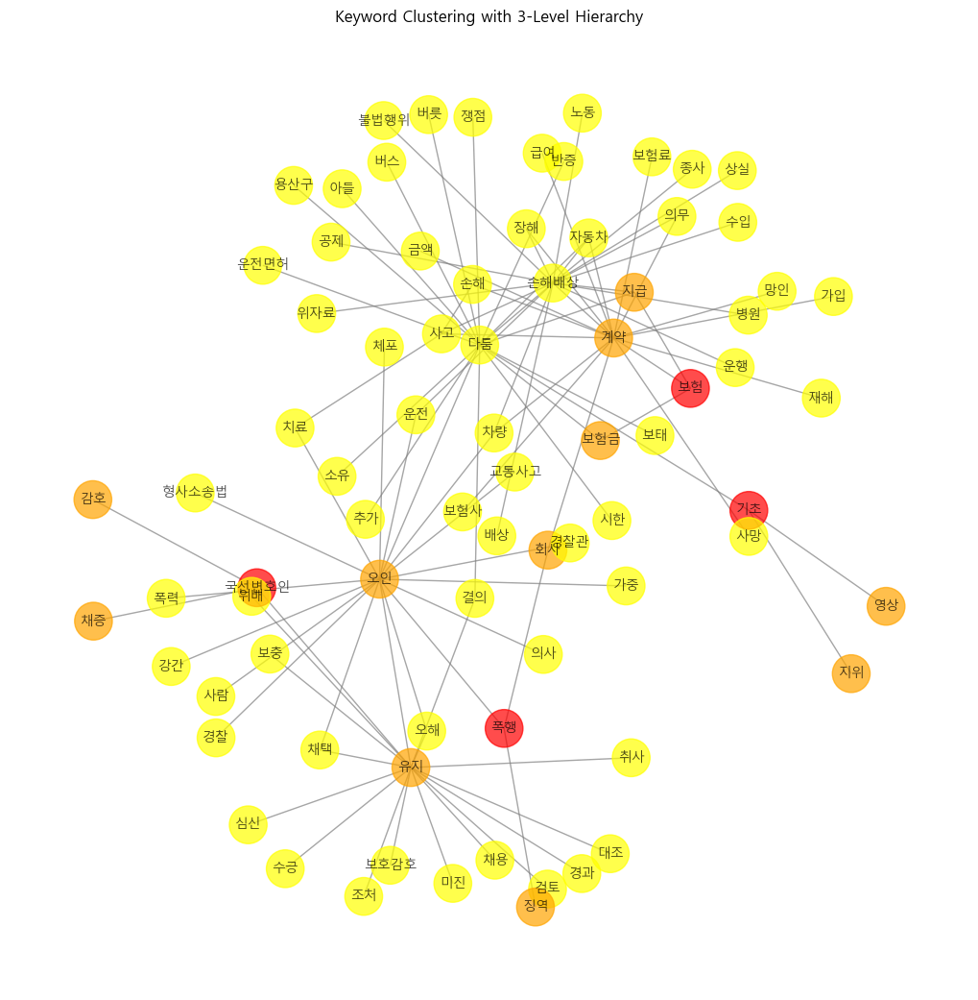

In [123]:
feature_names = vectorizer.get_feature_names_out()  # TF-IDF에서 사용된 키워드 목록

# K-Means 클러스터링 설정 및 수행
num_clusters = 5
kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)
kmeans.fit(tfidf_matrix)
labels = kmeans.labels_

# 클러스터별 주요 키워드 추출 (상위, 중위, 하위)
cluster_keywords = {}
for i in range(num_clusters):
    cluster_indices = (labels == i)
    tfidf_cluster = tfidf_matrix[cluster_indices].mean(axis=0).A1  # numpy 배열을 1차원으로 변환
    sorted_keywords = [feature_names[idx] for idx in tfidf_cluster.argsort()[::-1]]
    cluster_keywords[f'Cluster {i+1}'] = sorted_keywords[:20]  # 클러스터별 상위 10개 키워드

# 네트워크 그래프 생성 및 레벨 구분
G = nx.Graph()
for cluster, keywords in cluster_keywords.items():
    # 상위 레벨: 가장 중심이 되는 키워드
    G.add_node(keywords[0], level=1, cluster=cluster)
    
    # 2레벨 키워드 연결
    for keyword in keywords[1:4]:
        G.add_node(keyword, level=2, cluster=cluster)
        G.add_edge(keywords[0], keyword)
    
    # 3레벨 키워드 연결
    for keyword in keywords[4:]:
        G.add_node(keyword, level=3, cluster=cluster)
        G.add_edge(keywords[1], keyword)  # 2레벨 키워드에 연결

# 노드 색상 설정 (레벨별 구분)
node_colors = []
for node in G.nodes(data=True):
    if node[1]['level'] == 1:
        node_colors.append('red')  # 상위 레벨
    elif node[1]['level'] == 2:
        node_colors.append('orange')  # 중간 레벨
    else:
        node_colors.append('yellow')  # 하위 레벨

# 레이아웃 및 시각화 설정
pos = nx.spring_layout(G, k=0.5)
plt.figure(figsize=(10, 10))
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=800, edge_color='gray', alpha=0.7, font_size=10, font_family='Malgun Gothic')
plt.title("Keyword Clustering with 3-Level Hierarchy")
plt.show()

클러스터별 상위 10개 단어:

클러스터 1:
 파견
 근로자
 평화
 산업
 근로
 안전
 순찰
 업주
 사출
 사업

클러스터 2:
 치료
 섹스
 사고
 광주시
 분실
 오토바이
 좌회전
 반증
 손해
 고가도로

클러스터 3:
 기초
 다툼
 영상
 지위
 결의
 손해배상
 소유
 보험
 아들
 추가

클러스터 4:
 감호
 국선변호인
 보호감호
 재범
 유지
 전과
 위험성
 실형
 폭력
 징역

클러스터 5:
 보험
 사고
 손해배상
 손해
 지급
 자동차
 치료
 회사
 계약
 차량


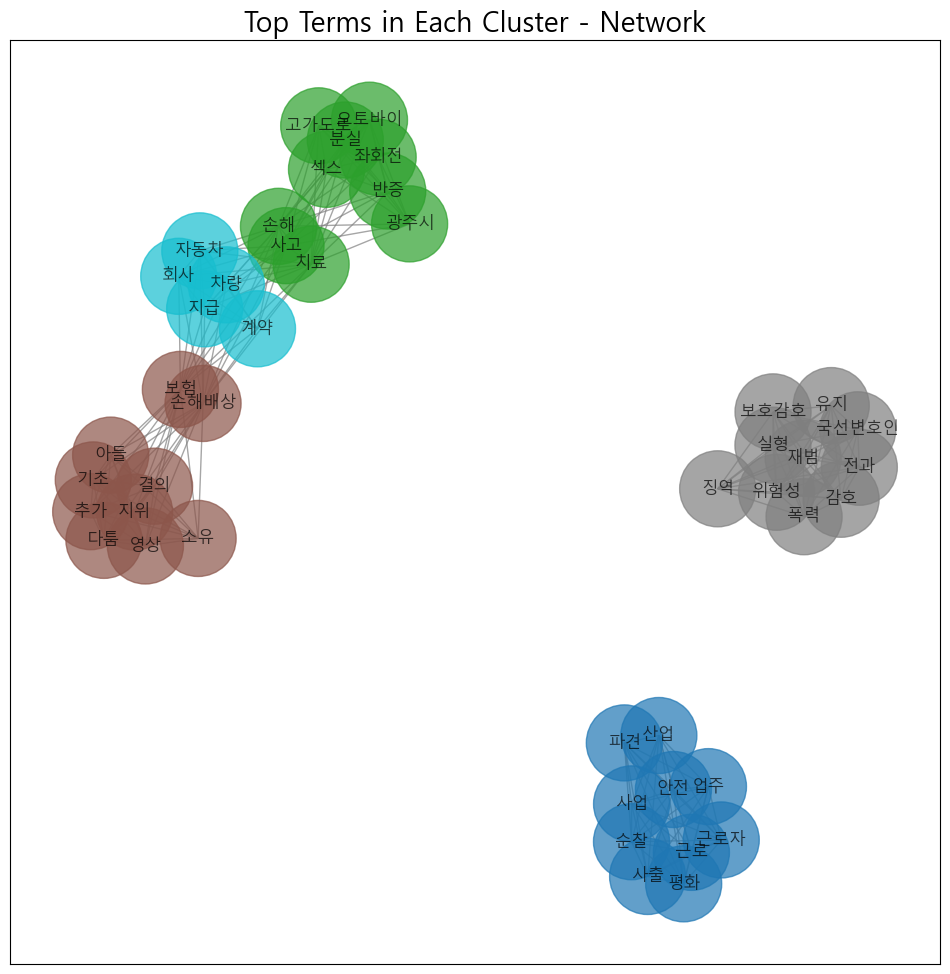

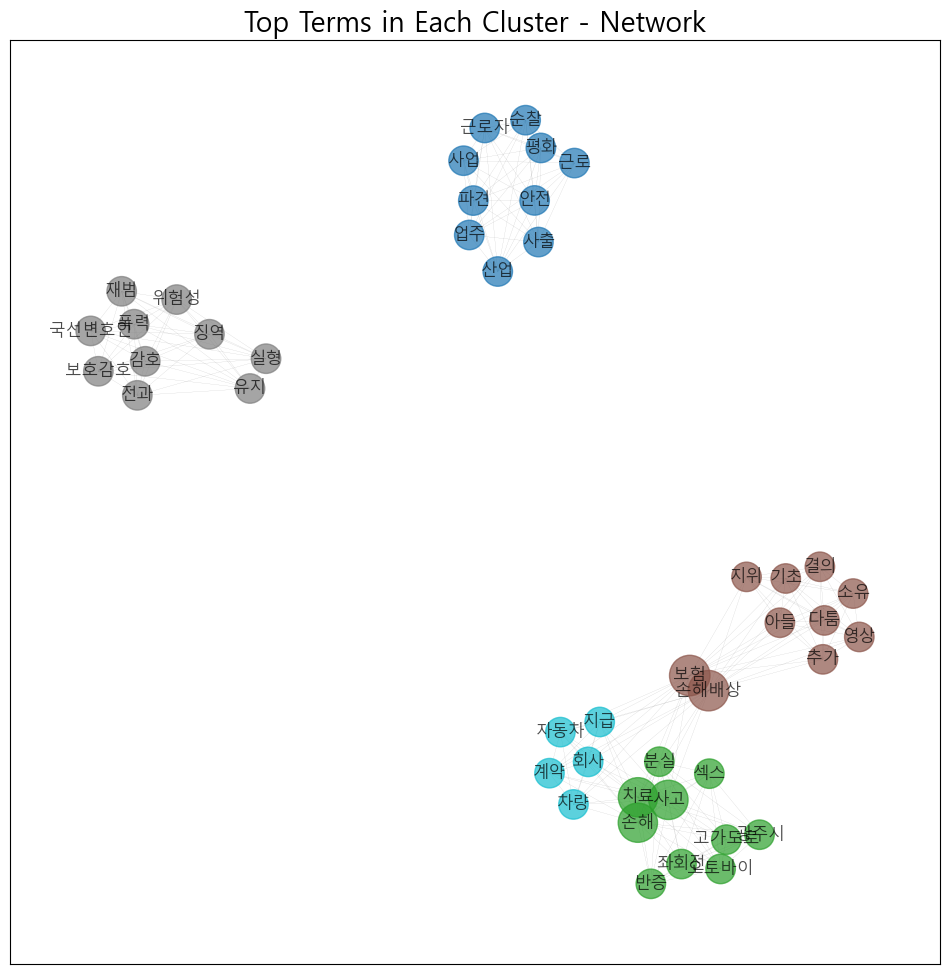

In [128]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# TF-IDF 벡터라이저 적용
vectorizer = TfidfVectorizer(max_df=0.95,min_df=2)
tfidf_matrix = vectorizer.fit_transform(normalized_cleaned)

# K-Means 클러스터링 수행 (k=5로 설정)
num_clusters = 5
km = KMeans(n_clusters=num_clusters, random_state=42)
km.fit(tfidf_matrix)

# 클러스터별 상위 단어 및 그 단어들의 TF-IDF 값 확인
order_centroids = km.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names_out()

cluster_top_terms = {}

print("클러스터별 상위 10개 단어:")
for i in range(num_clusters):
    print(f"\n클러스터 {i+1}:")
    top_terms = [terms[ind] for ind in order_centroids[i, :10]]
    cluster_top_terms[i] = top_terms  # 클러스터별 상위 10개 단어 저장
    for term in top_terms:
        print(f" {term}")

tfidf_cluster_matrix = np.zeros((num_clusters, len(terms)))

for cluster in range(num_clusters):
    for term in cluster_top_terms[cluster]:  # 클러스터 번호가 1부터 시작하므로 인덱스 조정
        if term in terms:
            term_index = np.where(terms == term)[0][0]
            tfidf_cluster_matrix[cluster, term_index] = 1  # 클러스터에서의 단어 존재 여부를 1로 표시

# 클러스터 간 유사도 계산
similarity_matrix = cosine_similarity(tfidf_cluster_matrix)


# 클러스터 색상 지정
num_clusters = len(cluster_top_terms)  # 클러스터 수에 맞게 설정
cluster_colors = plt.get_cmap('tab10', num_clusters)  # 색상 맵 생성

G = nx.Graph()

# 클러스터별 상위 단어들 사이의 엣지를 추가
for cluster, top_terms in cluster_top_terms.items():
    for i in range(len(top_terms)):
        for j in range(i + 1, len(top_terms)):
            G.add_edge(top_terms[i], top_terms[j], weight=1)  # 단순 엣지 추가 (공동 출현 가정)

# 노드 색상 맵 생성
color_map = []
for node in G.nodes():
    # 노드가 클러스터의 상위 단어인 경우 색상 지정
    for cluster_index, top_terms in cluster_top_terms.items():
        if node in top_terms:
            color_map.append(cluster_colors(cluster_index))  # 클러스터 색상 추가
            break
    else:
        color_map.append("gray")  # 클러스터 상위 단어가 아닌 노드는 회색으로 표시

# 네트워크 시각화
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, k=0.5, iterations=50)

# 노드 및 엣지 그리기, 한글 폰트 적용
nx.draw_networkx(G, pos, with_labels=True, node_size=3000, node_color=color_map, font_size=12, font_color="black", edge_color="gray", alpha=0.7, font_family=font_prop.get_name())

# 제목에도 한글 폰트 적용
plt.title("Top Terms in Each Cluster - Network", fontproperties=font_prop, fontsize=20)
plt.show()


# 클러스터 색상 지정
num_clusters = len(cluster_top_terms)  # 클러스터 수에 맞게 설정
cluster_colors = plt.get_cmap('tab10', num_clusters)  # 색상 맵 생성

G = nx.Graph()

# 클러스터별 상위 단어들 사이의 엣지를 추가
for cluster, top_terms in cluster_top_terms.items():
    for i in range(len(top_terms)):
        for j in range(i + 1, len(top_terms)):
            G.add_edge(top_terms[i], top_terms[j], weight=1)  # 단순 엣지 추가 (공동 출현 가정)

# 노드 색상 맵 생성
color_map = []
for node in G.nodes():
    # 노드가 클러스터의 상위 단어인 경우 색상 지정
    for cluster_index, top_terms in cluster_top_terms.items():
        if node in top_terms:
            color_map.append(cluster_colors(cluster_index))  # 클러스터 색상 추가
            break
    else:
        color_map.append("gray")  # 클러스터 상위 단어가 아닌 노드는 회색으로 표시

# 네트워크 시각화
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, k=0.5, iterations=50)

# 노드 크기 설정 (degree를 기반으로)
node_sizes = [d for n, d in G.degree()]

# 노드 및 엣지 그리기, 한글 폰트 적용
nx.draw_networkx(G, pos, with_labels=True, node_size=[d * 50 for d in node_sizes], node_color=color_map, font_size=12, font_color="black", edge_color="gray", alpha=0.7, width=0.1, font_family=font_prop.get_name())

# 제목에도 한글 폰트 적용
plt.title("Top Terms in Each Cluster - Network", fontproperties=font_prop, fontsize=20)
plt.show()

In [125]:
cluster_keywords

{'Cluster 1': ['국선변호인',
  '유지',
  '채증',
  '감호',
  '채용',
  '보충',
  '대조',
  '검토',
  '미진',
  '위배',
  '오인',
  '수긍',
  '채택',
  '취사',
  '결의',
  '심신',
  '경과',
  '오해',
  '보호감호',
  '조처'],
 'Cluster 2': ['기초',
  '다툼',
  '영상',
  '지위',
  '결의',
  '손해배상',
  '소유',
  '용산구',
  '아들',
  '추가',
  '운전면허',
  '보태',
  '쟁점',
  '반증',
  '자동차',
  '보험금',
  '시한',
  '지급',
  '버릇',
  '버스'],
 'Cluster 3': ['사고',
  '손해배상',
  '손해',
  '치료',
  '차량',
  '노동',
  '지급',
  '운전',
  '자동차',
  '배상',
  '상실',
  '운행',
  '수입',
  '불법행위',
  '장해',
  '의무',
  '종사',
  '공제',
  '위자료',
  '병원'],
 'Cluster 4': ['보험',
  '계약',
  '보험금',
  '지급',
  '자동차',
  '사고',
  '손해',
  '회사',
  '사망',
  '금액',
  '급여',
  '의무',
  '차량',
  '장해',
  '재해',
  '가입',
  '망인',
  '보험료',
  '보험사',
  '손해배상'],
 'Cluster 5': ['폭행',
  '오인',
  '징역',
  '회사',
  '폭력',
  '다툼',
  '오해',
  '의사',
  '강간',
  '운전',
  '가중',
  '형사소송법',
  '경찰관',
  '사람',
  '교통사고',
  '채택',
  '체포',
  '차량',
  '경찰',
  '치료']}

# 라벨링한거 SQL에 저장

In [1]:
#불용어 읽어오기
stopwords_file_path = 'stopwords_dh_lastlast.txt'
stopwords = []
with open(stopwords_file_path, 'r', encoding='utf-8') as file:
    stopwords = [line.strip() for line in file.readlines()]


In [3]:
import pandas as pd
df=pd.read_csv('data/hurtcombined.csv') #KoBeRT Try 노트북에서 생성한 파일
df = df.drop(df.columns[0], axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4189 entries, 0 to 4188
Data columns (total 18 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   판례일련번호    4189 non-null   int64 
 1   사건명       4188 non-null   object
 2   사건번호      4189 non-null   object
 3   선고일자      4189 non-null   object
 4   법원명       4189 non-null   object
 5   사건종류명     4189 non-null   object
 6   판례상세링크    4189 non-null   object
 7   판례정보일련번호  4189 non-null   int64 
 8   사건번호.1    4189 non-null   object
 9   선고        4189 non-null   object
 10  판결유형      4189 non-null   object
 11  판시사항      3417 non-null   object
 12  판결요지      3028 non-null   object
 13  참조조문      3392 non-null   object
 14  참조판례      1925 non-null   object
 15  판례내용      4189 non-null   object
 16  판례내용_상단   4189 non-null   object
 17  판례내용_이유   4184 non-null   object
dtypes: int64(2), object(16)
memory usage: 589.2+ KB


In [4]:
import re

# 새로운 리스트를 생성하여 전처리된 데이터를 저장
service_reason = []

# 데이터프레임의 '판례내용_이유' 열을 순회
for idx in range(len(df)):
    content = df['판례내용_이유'].iloc[idx]  # 데이터프레임에서 판례 내용 가져오기
    
    # 문자열인지 확인 (문자열이 아니면 건너뜀)
    if isinstance(content, str):
        # 대괄호로 구분된 내용을 분리
        content_parts = re.split(r'유】', content)
        reason_dict = {}
        # 각 부분을 검사
        for j in range(len(content_parts)):
            # '이유' 부분을 찾고 후속 내용을 정리
            if content_parts[j].replace(' ', '') == '【이':
                cleaned_content = content_parts[j+1]
                cleaned_content = cleaned_content.replace('<br/>', '').replace('\r', '').replace('\n', '')
                cleaned_content = cleaned_content.replace('【', '').replace('】', '').strip()
                cleaned_content = re.sub(r'\s+', ' ', cleaned_content)  # 여러 공백을 하나로
                # 결과를 딕셔너리에 저장
                reason_dict['이유'] = cleaned_content
        
        # 전처리된 내용을 리스트에 추가
        service_reason.append(reason_dict)
    else:
        # 비문자열 데이터 처리 (빈 딕셔너리 추가)
        service_reason.append({})
# 결과를 '판례내용_이유(전처리)' 열에 저장
df['판례내용_이유_전처리'] = service_reason

In [5]:
df['판례내용_상단']=df['판례내용_상단'].fillna('').apply(lambda x: re.sub(r'(\n|\r|<br/>|\s{2,})', ' ', x))
df['판례내용_이유']=df['판례내용_이유'].fillna('').apply(lambda x: re.sub(r'(\n|\r|<br/>|\s{2,})', ' ', x))


In [72]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4189 entries, 0 to 4188
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   판례일련번호       4189 non-null   int64 
 1   사건명          4188 non-null   object
 2   사건번호         4189 non-null   object
 3   선고일자         4189 non-null   object
 4   법원명          4189 non-null   object
 5   사건종류명        4189 non-null   object
 6   판례상세링크       4189 non-null   object
 7   판례정보일련번호     4189 non-null   int64 
 8   사건번호.1       4189 non-null   object
 9   선고           4189 non-null   object
 10  판결유형         4189 non-null   object
 11  판시사항         3417 non-null   object
 12  판결요지         3028 non-null   object
 13  참조조문         3392 non-null   object
 14  참조판례         1925 non-null   object
 15  판례내용         4189 non-null   object
 16  판례내용_상단      4189 non-null   object
 17  판례내용_이유      4184 non-null   object
 18  판례내용_이유_전처리  4189 non-null   object
dtypes: int64(2), object(17)
mem

In [6]:
import pandas as pd
from konlpy.tag import Okt
from collections import Counter


reason = df['판례내용_이유']

#Okt호출
okt = Okt()

#정규화한 뒤 명사추출
normalized = reason.apply(lambda x: ' '.join(okt.nouns(okt.normalize(x))))

# 불용어 제거 및 LDA 적용
def remove_stopwords(text):
    tokens = text.split()  # 공백으로 나누기
    filtered_tokens = [word for word in tokens if word not in stopwords]  # 불용어 제거
    return ' '.join(filtered_tokens)  # 다시 문자열로 결합

normalized_cleaned = [remove_stopwords(' '.join([word for word in text.split() if word not in stopwords])
) for text in normalized]


In [103]:
df['판례내용_이유_불용어제거'][0]

'승소 적법 승소 상소 두 취소 승소 여 로써 불복 존재 과세표준 증명책임 사업 연도 법인세 가산 사업 연도 법인세 민세 가산 부과 세법 호로 개정 전의 국내 사업 외국 사업 연도 소득 법인세 과세표준 국내 소득 합계 항의 징수 국내 소득 금액 외한 호의 금액 소득 순차 공제 금액 선박 항공기 외국 항행 소득 외국 본점 사무소 외국 우리나라 운용 선박 항공기 면제 상호 면세 세법 외국 국내 소득 열거 본문 외국 영위 사업 소득 조약 국내 원천 사업 소득 과세 소득 국내 원천 사업 소득 위임 세법 시행 령 국내 원천 사업 소득 하나로 외국 국내 국외 선박 국제 운송업 영위 국내 승선 여객 선적 화물 수입 금액 판정 국내 소득 세법 호의 소득 소득 목 소득 국내 원천 소득 차 목 국내 원천 소득 하나로 목 목 국내 행 사업 국내 인적 용역 국내 자산 경제 소득 소득 소득 사업 연도 손익계산서 매출 수익 영위 자동차 해상 운송 사업 매출 수익 국내 사업 행 사업 인적 용역 자산 경제 소득 세법 차 목 국내 원천 소득 선박 외국 항행 소득 증명책임 전제 증명 매출 수익 선박 외국 항행 소득 공제 수긍 사업 연도 매출 수익 국내 소득 체계 국내 사업 외국 국내 국외 선박 국제 운송업 영위 사업 소득 국내 승선 여객 선적 화물 소득 세법 외국 국내 원천 사업 소득 사업 연도 소득 법인세 과세표준 국외 승선 여객 선적 화물 소득 국내 원천 사업 소득 법인세 과세표준 국내 원천 소득 세법 차 목 국내 국외 불문 국제 운송업 소득 국내 소득 사업 연도 국내 국외 선박 화물 운송 사업 영위 사업 연도 손익계산서 매출 수익 화물 국외 선적 소득 개연 매출 수익 화물 국내 선적 소득 구성 과세 관청 증명 매출 수익 국내 소득 보기 선박 외국 항행 소득 증명책임 과세 취소소송 과세 요건사실 존부 과세 과세표준 증명책임 과세 관청 국내 사업 외국 사업 연도 소득 법인세 과세표준 기초 국내 원천 소득 합계 증명책임 과세 관청 외국 국내 원천 소득 합계 선박 외국 항행 소득 존재 과세 관

In [7]:
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer

df['판례내용_이유_불용어제거']=normalized_cleaned

# TF-IDF 벡터라이저 적용
vectorizer = TfidfVectorizer(min_df=2, max_df=0.95)
tfidf_matrix = vectorizer.fit_transform(normalized_cleaned)

# K-Means 클러스터링 수행 (k=5로 설정)
num_clusters = 10
for j in range(2,num_clusters+1):
    km = KMeans(n_clusters=j,random_state=42)
    km.fit(tfidf_matrix)

    df['클러스터']=km.labels_+1
    # 결과 확인
    print(f"클러스터 수 {j}의 클러스터링 결과:")
    print(df[['판례내용_이유_불용어제거', '클러스터']].head())

    # 6. 클러스터 중심 계산
    cluster_centers = km.cluster_centers_

    # 7. 각 클러스터의 중심 단어 추출
    def get_top_keywords_for_clusters(cluster_centers, vectorizer, n_words=10):
        order_centroids = cluster_centers.argsort()[:, ::-1]  # 각 클러스터의 중심 단어 인덱스 정렬
        terms = vectorizer.get_feature_names_out()  # 단어 목록
        
        cluster_keywords = {}
        for i in range(j):
            cluster_keywords[i] = [terms[ind] for ind in order_centroids[i, :n_words]]  # 상위 n_words 단어
        
        return cluster_keywords

    # 8. 클러스터 중심 단어 출력
    cluster_keywords = get_top_keywords_for_clusters(cluster_centers, vectorizer)
    for cluster_num, keywords in cluster_keywords.items():
        print(f"\n클러스터 {cluster_num + 1}의 중심 단어들: {', '.join(keywords)}")


    # 클러스터별 상위 단어 및 그 단어들의 TF-IDF 값 확인
    order_centroids = km.cluster_centers_.argsort()[:, ::-1]
    terms = vectorizer.get_feature_names_out()
    print("클러스터별 상위 단어 및 TF-IDF 값:")
    print(df['클러스터'].value_counts())

클러스터 수 2의 클러스터링 결과:
                                       판례내용_이유_불용어제거  클러스터
0  승소 적법 승소 상소 두 취소 승소 여 로써 불복 존재 과세표준 증명책임 사업 연도...     1
1  폭행 특수 특수 협박 주거지 입금 주기 형광등 값 화가 손 머리 수회 발 옆구리 주...     1
2  개요 쟁점 진행 경과 인천 건조물 침입 죄 제기 징역 구속영장 발부 건 언급 건조물...     1
3  경합 동시 기소 개일 분리 일부상소 쌍방 상소 분리 경합 지남 무죄판결 주거침입 벌...     1
4  죄 사 실 전력 수원지방법원 폭력 감금 죄 징역 집행유예 중앙 마약 류 관리 대마 ...     1

클러스터 1의 중심 단어들: 사고, 손해, 치료, 차량, 폭행, 운전, 지급, 회사, 폭력, 노동

클러스터 2의 중심 단어들: 보험, 계약, 보험금, 지급, 자동차, 사고, 손해, 급여, 사망, 차량
클러스터별 상위 단어 및 TF-IDF 값:
클러스터
1    3700
2     489
Name: count, dtype: int64
클러스터 수 3의 클러스터링 결과:
                                       판례내용_이유_불용어제거  클러스터
0  승소 적법 승소 상소 두 취소 승소 여 로써 불복 존재 과세표준 증명책임 사업 연도...     3
1  폭행 특수 특수 협박 주거지 입금 주기 형광등 값 화가 손 머리 수회 발 옆구리 주...     3
2  개요 쟁점 진행 경과 인천 건조물 침입 죄 제기 징역 구속영장 발부 건 언급 건조물...     3
3  경합 동시 기소 개일 분리 일부상소 쌍방 상소 분리 경합 지남 무죄판결 주거침입 벌...     3
4  죄 사 실 전력 수원지방법원 폭력 감금 죄 징역 집행유예 중앙 마약 류 관리 대마 ...     3

클러스터 1의 중심 단어들: 사고, 손해, 차량, 운전, 치료, 노동, 지급, 자동차, 운행, 손해배상

클러스

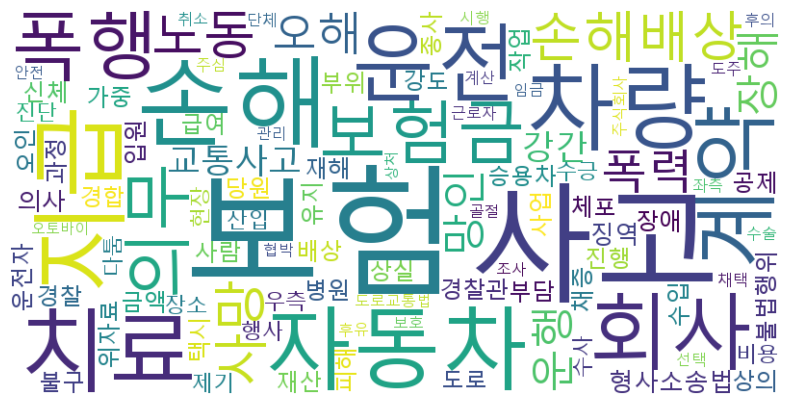

In [11]:
from wordcloud import WordCloud
from matplotlib import pyplot as plt

# 한글 폰트 경로 지정 (맑음고딕 폰트를 사용한 경우)
font_path = 'C:/Windows/Fonts/malgun.ttf' 

tfdif_means = tfidf_matrix.mean(axis=0).A1  # (1, n_features) 형태에서 1차원 배열로 변환
tfdif_means = pd.Series(tfdif_means, index=terms).sort_values(ascending=False)[:100]

# 워드 클라우드 생성
wordcloud = WordCloud(font_path=font_path,  # 한글 폰트 경로 설정
                      width=800, height=400, background_color='white').generate_from_frequencies(tfdif_means)

# 시각화
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # 축 숨기기
plt.show()

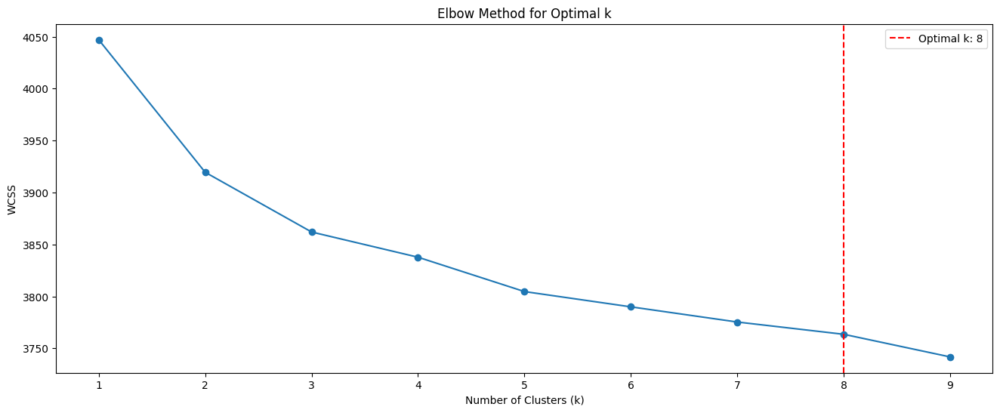

엘보우 포인트 k: 8


In [14]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import numpy as np

wcss = []
k_range = range(1,10)  # k 값을 1에서 10까지 시도

for k in k_range:
    kmeans = KMeans(n_clusters=k,init='k-means++',random_state=42)
    kmeans.fit(tfidf_matrix)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(16, 6))
plt.plot(k_range, wcss, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS')
plt.xticks(k_range)


# 엘보우 포인트 자동 감지
diff = np.diff(wcss)  # 1차 미분
diff2 = np.diff(diff)  # 2차 미분
elbow_index = np.argmin(diff2) + 2  # 엘보우 포인트 인덱스 (k는 2부터 시작)

# 엘보우 포인트 표시
plt.axvline(x=elbow_index, color='red', linestyle='--', label=f'Optimal k: {elbow_index}')
plt.legend()
plt.show()

print(f"엘보우 포인트 k: {elbow_index}")
#Wcss의 감소가 완만해지는 elbow 지점을 k=4~5이므로 k=4가 적절하다.

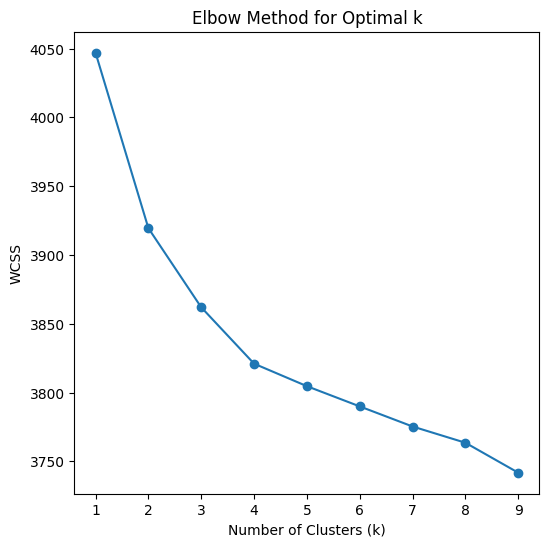

In [23]:
plt.figure(figsize=(6, 6))
plt.plot(k_range, wcss, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS')
plt.xticks(k_range)

plt.show()

In [18]:
wcss[:6]

[4046.9962948666816,
 3919.47945425331,
 3861.983479354917,
 3837.717667279025,
 3804.6463611866125,
 3789.9456601659485]

In [19]:
wcss[3]=3821

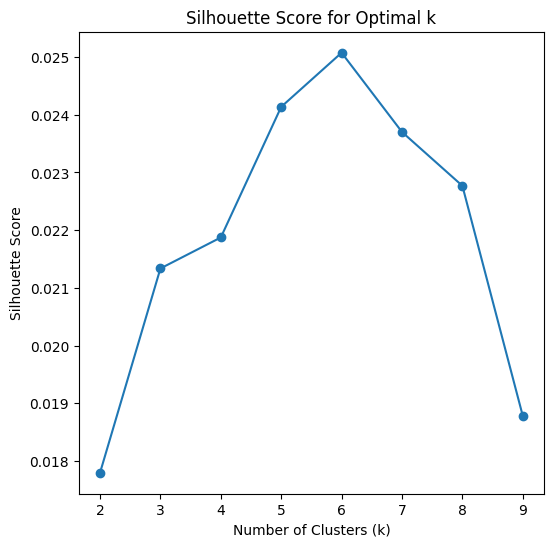

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_scores = []

for k in range(2, 10):  # k 값을 2에서 10까지 시도
    kmeans = KMeans(n_clusters=k,init='k-means++', random_state=42)
    kmeans.fit(tfidf_matrix)
    silhouette_scores.append(silhouette_score(tfidf_matrix, kmeans.labels_))

plt.figure(figsize=(6, 6))
plt.plot(range(2, 10), silhouette_scores, marker='o')
plt.title('Silhouette Score for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.xticks(range(2,10))
plt.show()

# 실루엣 계수 해석:
# 1에 가까운 값: 군집 내 응집도가 높고, 군집 간 분리도가 잘 이루어져 있음
# 0에 가까운 값: 데이터 포인트가 군집의 경계에 위치함
# -1에 가까운 값: 잘못된 군집에 속해 있음

In [30]:
print("클러스터별 상위 단어 및 TF-IDF 값:")
for i in range(num_clusters):
    print(f"\n클러스터 {i+1}:")
    for ind in order_centroids[i, :10]:  # 상위 10개의 단어
        print(f"단어: {terms[ind]} - TF-IDF 값: {km.cluster_centers_[i, ind]}")

클러스터별 상위 단어 및 TF-IDF 값:

클러스터 1:
단어: 사고 - TF-IDF 값: 0.15213358538750266
단어: 손해 - TF-IDF 값: 0.07601676733094251
단어: 차량 - TF-IDF 값: 0.06761022736792653
단어: 운전 - TF-IDF 값: 0.055193659987256526
단어: 노동 - TF-IDF 값: 0.05156783930860163
단어: 치료 - TF-IDF 값: 0.05143784904721797
단어: 지급 - TF-IDF 값: 0.04351904667742914
단어: 자동차 - TF-IDF 값: 0.04339145195453359
단어: 운행 - TF-IDF 값: 0.042462774648158716
단어: 손해배상 - TF-IDF 값: 0.03801430516100849

클러스터 2:
단어: 보험 - TF-IDF 값: 0.4900287909250853
단어: 계약 - TF-IDF 값: 0.14406464176434822
단어: 보험금 - TF-IDF 값: 0.12836756617324377
단어: 지급 - TF-IDF 값: 0.10304355186426006
단어: 자동차 - TF-IDF 값: 0.08706085523233316
단어: 사고 - TF-IDF 값: 0.08116724441879142
단어: 손해 - TF-IDF 값: 0.05325676128639821
단어: 급여 - TF-IDF 값: 0.04605592159124844
단어: 사망 - TF-IDF 값: 0.04412120620278561
단어: 회사 - TF-IDF 값: 0.041250468262031985

클러스터 3:
단어: 강간 - TF-IDF 값: 0.07015731689795915
단어: 폭력 - TF-IDF 값: 0.05382896206542936
단어: 징역 - TF-IDF 값: 0.05374655704269132
단어: 폭행 - TF-IDF 값: 0.05103444324917496
단어: 강도

In [30]:
df['클러스터'].unique()

array([ 8,  2, 10,  9,  6,  5,  1,  3,  7,  4])

C:\Users\user\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 48712 (\N{HANGUL SYLLABLE BIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\user\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 46020 (\N{HANGUL SYLLABLE DO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\user\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\user\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 47084 (\N{HANGUL SYLLABLE REO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\user\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 49828 (\

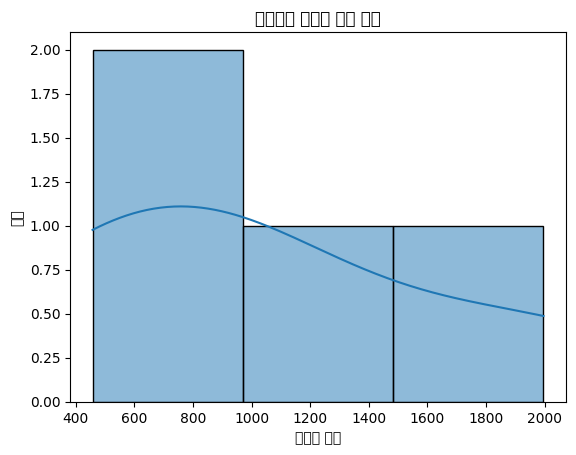

Shapiro-Wilk 검정 통계량: 0.9037983054656464 p-값: 0.450169702282678
Kolmogorov-Smirnov 검정 통계량: 0.2661476865882032 p-값: 0.8672841683185959


In [29]:
num_clusters = 4
km = KMeans(n_clusters=num_clusters,random_state=42)
km.fit(tfidf_matrix)

df['클러스터']=km.labels_+1
# 결과 확인

# 6. 클러스터 중심 계산
cluster_centers = km.cluster_centers_

# 7. 각 클러스터의 중심 단어 추출
def get_top_keywords_for_clusters(cluster_centers, vectorizer, n_words=10):
    order_centroids = cluster_centers.argsort()[:, ::-1]  # 각 클러스터의 중심 단어 인덱스 정렬
    terms = vectorizer.get_feature_names_out()  # 단어 목록
    
    cluster_keywords = {}
    for i in range(num_clusters):
        cluster_keywords[i] = [terms[ind] for ind in order_centroids[i, :n_words]]  # 상위 n_words 단어
    
    return cluster_keywords

# 8. 클러스터 중심 단어 출력
cluster_keywords = get_top_keywords_for_clusters(cluster_centers, vectorizer)


# 클러스터별 상위 단어 및 그 단어들의 TF-IDF 값 확인
order_centroids = km.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names_out()


import seaborn as sns
import matplotlib.pyplot as plt

cluster_counts = df['클러스터'].value_counts()
sns.histplot(cluster_counts, kde=True)
plt.title("클러스터 데이터 개수 분포")
plt.xlabel("데이터 개수")
plt.ylabel("빈도")
plt.show()

from scipy.stats import shapiro, kstest

# Shapiro-Wilk 검정
shapiro_test = shapiro(cluster_counts)
print("Shapiro-Wilk 검정 통계량:", shapiro_test.statistic, "p-값:", shapiro_test.pvalue)

# Kolmogorov-Smirnov 검정
ks_test = kstest(cluster_counts, 'norm', args=(cluster_counts.mean(), cluster_counts.std()))
print("Kolmogorov-Smirnov 검정 통계량:", ks_test.statistic, "p-값:", ks_test.pvalue)

데이터 개수가 적을 때 민감하게 반응하는 Shapiro-Wilk 검정에서 귀무가설을 기각하지 못하는 num_clusters=4 일 때가 군집화가 고르게 이루어졌음을 확인한다.

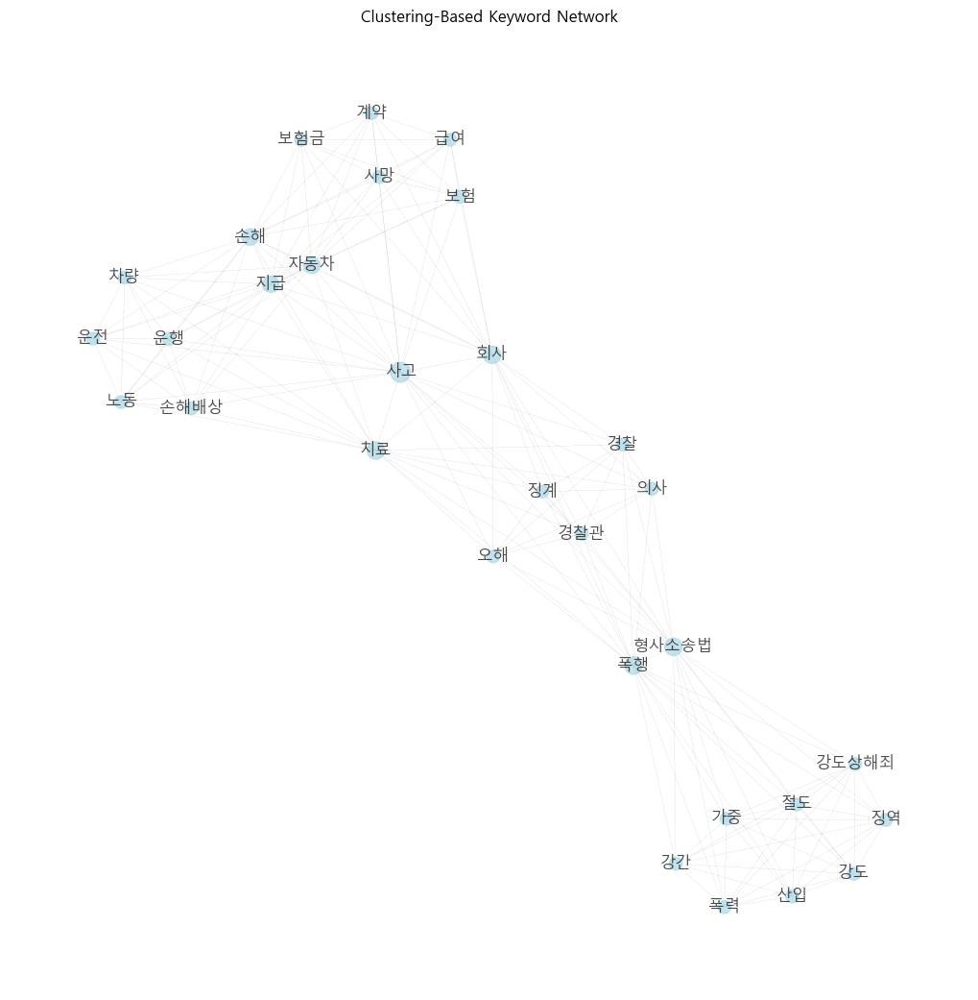

In [33]:
import platform
from matplotlib import rc
from matplotlib import font_manager
import networkx as nx
import numpy as np

# 한글폰트 설정 (윈도우즈에서만)
if platform.system() == 'Windows':
    font_path = 'C:/Windows/Fonts/malgun.ttf'  # 맑은 고딕 폰트 경로
    font_name = font_manager.FontProperties(fname=font_path).get_name()
    rc('font', family=font_name)

# 마이너스 폰트 설정 (깨짐 방지)
plt.rcParams['axes.unicode_minus'] = False

# 네트워크 그래프 생성
G = nx.Graph()

# 클러스터별 키워드를 노드로 추가하고, 키워드 간 엣지 설정
for cluster, keywords in cluster_keywords.items():
    for keyword in keywords:
        G.add_node(keyword, cluster=cluster)  # 노드 추가
    for i in range(len(keywords)):
        for j in range(i + 1, len(keywords)):
            G.add_edge(keywords[i], keywords[j])  # 엣지 추가

# 노드 라벨 설정
for node in G.nodes():
    G.nodes[node]['label'] = node  # 노드 이름을 라벨로 설정

# 레이아웃 설정 (스프링 레이아웃)
pos = nx.spring_layout(G, k=0.3)  # k 값 조절하여 노드 간 간격 조절

# 노드 크기 설정 (degree를 기반으로)
node_sizes = [d for n, d in G.degree()]

# 시각화
plt.figure(figsize=(10, 10))
nx.draw(G, pos, with_labels=True, font_family=plt.rcParams['font.family'],  # 윈도우즈에서는 한글 폰트 사용
        node_size=[d * 10 for d in node_sizes],  # 노드 크기 조절
        node_color='lightblue',
        alpha=0.7,  # 노드 투명도
        width=0.1,  # 선 두께
        edge_color='gray')
plt.title('Clustering-Based Keyword Network')
plt.show()

중심성이 가장 높은 키워드: 사고


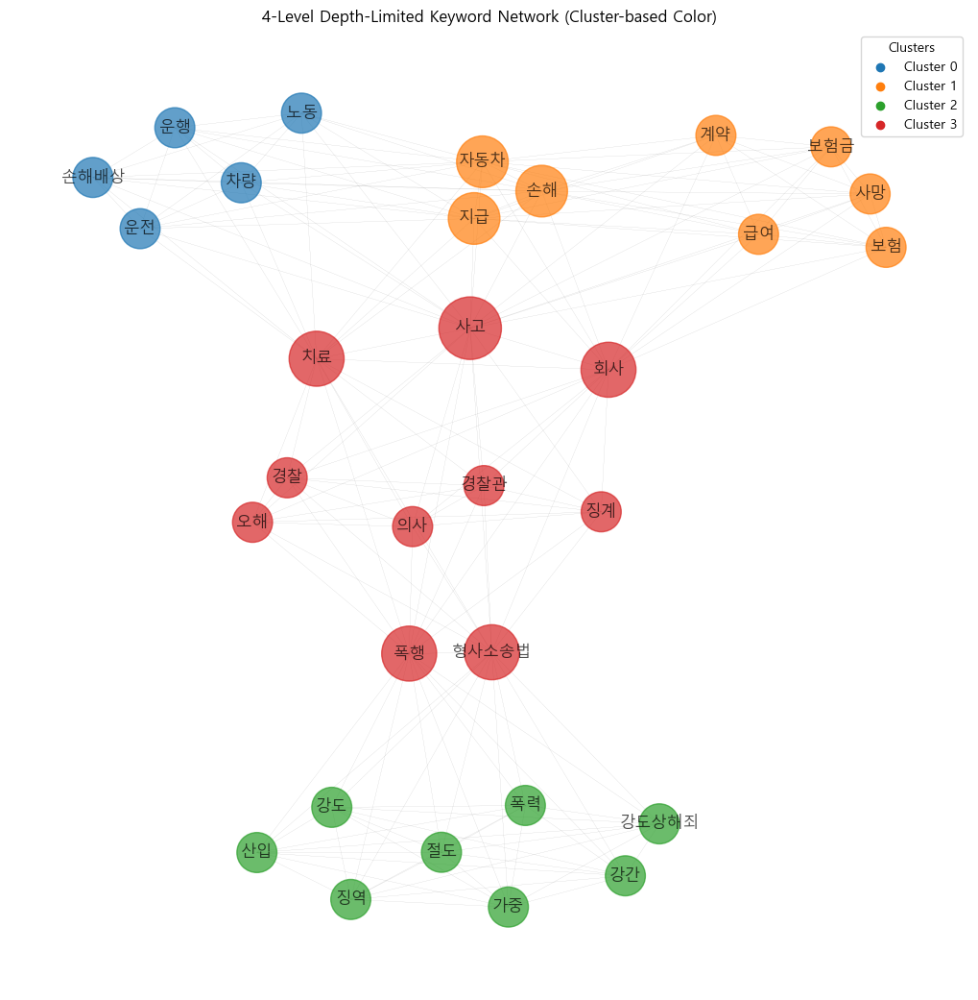

In [35]:
import matplotlib.pyplot as plt
import networkx as nx
from matplotlib import font_manager, rc
import platform
import matplotlib.colors as mcolors

# 한글 폰트 설정 (윈도우즈에서만)
if platform.system() == 'Windows':
    font_path = 'C:/Windows/Fonts/malgun.ttf'  # 맑은 고딕 폰트 경로
    font_name = font_manager.FontProperties(fname=font_path).get_name()
    rc('font', family=font_name)

# 마이너스 폰트 설정 (깨짐 방지)
plt.rcParams['axes.unicode_minus'] = False

# 네트워크 그래프 생성
G = nx.Graph()

# 클러스터별 키워드를 노드로 추가하고, 키워드 간 엣지 설정
for cluster, keywords in cluster_keywords.items():
    for keyword in keywords:
        G.add_node(keyword, cluster=cluster)  # 노드 추가
    for i in range(len(keywords)):
        for j in range(i + 1, len(keywords)):
            G.add_edge(keywords[i], keywords[j])  # 엣지 추가

# 중심성 계산 (예: degree 중심성)
centrality = nx.degree_centrality(G)

# 중심성이 가장 높은 키워드 찾기
target_node = max(centrality, key=centrality.get)
print("중심성이 가장 높은 키워드:", target_node)

# 네트워크 뎁스 제한: 중심성이 가장 높은 키워드에서 최대 4 레벨까지만 연결
depth_limited_graph = nx.ego_graph(G, target_node, radius=3)

# 클러스터별 고유 색상 설정
cluster_colors = {cluster: color for cluster, color in zip(cluster_keywords.keys(), mcolors.TABLEAU_COLORS)}

# 노드 색상 설정 (클러스터별 구분)
node_colors = [cluster_colors[depth_limited_graph.nodes[node]['cluster']] for node in depth_limited_graph.nodes()]

# 노드 크기 설정 (degree를 기반으로)
node_sizes = [depth_limited_graph.degree(n) * 100 for n in depth_limited_graph.nodes()]

# 레이아웃 설정 (스프링 레이아웃)
pos = nx.spring_layout(depth_limited_graph, k=0.3)

# 시각화
plt.figure(figsize=(10, 10))
nx.draw(depth_limited_graph, pos, with_labels=True, font_family=plt.rcParams['font.family'],
        node_size=node_sizes,  # 노드 크기 조절
        node_color=node_colors,  # 노드 색상 (클러스터별 구분)
        edge_color='gray', alpha=0.7, width=0.1)
plt.title('4-Level Depth-Limited Keyword Network (Cluster-based Color)')

# 범례 추가
for cluster, color in cluster_colors.items():
    plt.scatter([], [], color=color, label=f'Cluster {cluster}')
plt.legend(title="Clusters")
plt.show()

클러스터별 상위 10개 단어:

클러스터 1:
 사고
 손해
 차량
 운전
 노동
 치료
 지급
 자동차
 운행
 손해배상
 교통사고
 상실
 도로
 장해
 배상
 수입
 종사
 의무
 보험
 공제

클러스터 2:
 보험
 계약
 보험금
 지급
 자동차
 사고
 손해
 급여
 사망
 회사
 금액
 차량
 망인
 재해
 의무
 보험사
 장해
 손해배상
 운전
 상법

클러스터 3:
 강간
 폭력
 징역
 폭행
 강도
 가중
 산입
 강도상해죄
 절도
 형사소송법
 감호
 상습
 경합
 성폭력
 징역형
 협박
 심신
 본형
 전과
 후의

클러스터 4:
 폭행
 회사
 경찰관
 치료
 의사
 형사소송법
 오해
 징계
 사고
 경찰
 집회
 의무
 폭력
 체포
 과정
 사망
 지급
 채증
 직무
 방해


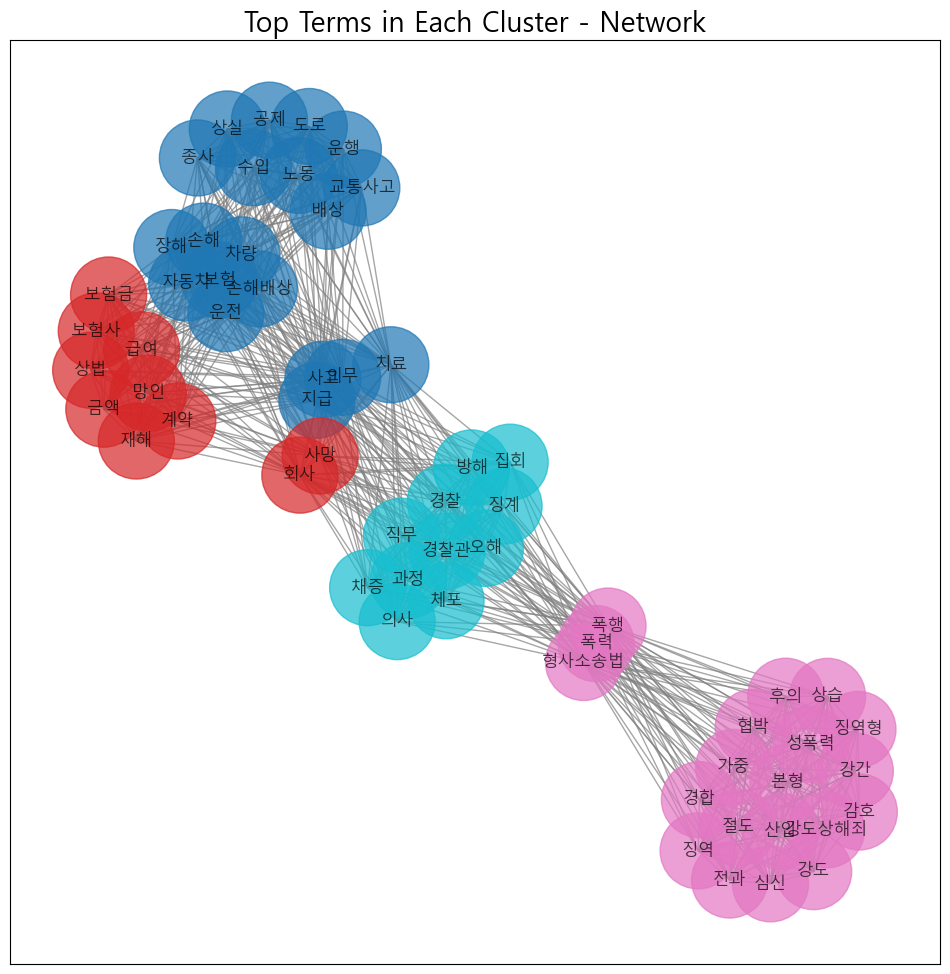

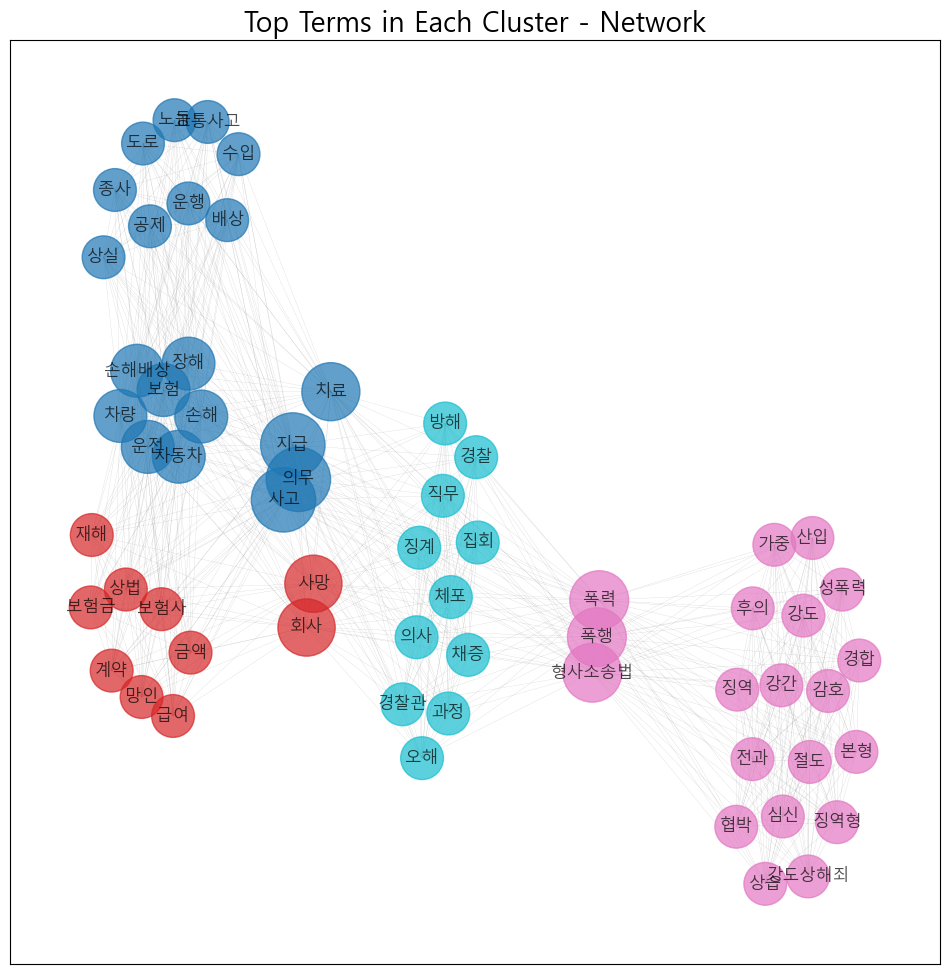

In [42]:
from sklearn.metrics.pairwise import cosine_similarity
font_prop = font_manager.FontProperties(fname=font_path)

cluster_top_terms = {}

print("클러스터별 상위 10개 단어:")
for i in range(num_clusters):
    print(f"\n클러스터 {i+1}:")
    top_terms = [terms[ind] for ind in order_centroids[i, :20]]
    cluster_top_terms[i] = top_terms  # 클러스터별 상위 10개 단어 저장
    for term in top_terms:
        print(f" {term}")
tfidf_cluster_matrix = np.zeros((num_clusters, len(terms)))

for cluster in range(num_clusters):
    for term in cluster_top_terms[cluster]:  # 클러스터 번호가 1부터 시작하므로 인덱스 조정
        if term in terms:
            term_index = np.where(terms == term)[0][0]
            tfidf_cluster_matrix[cluster, term_index] = 1  # 클러스터에서의 단어 존재 여부를 1로 표시

# 클러스터 간 유사도 계산
similarity_matrix = cosine_similarity(tfidf_cluster_matrix)


# 클러스터 색상 지정
num_clusters = len(cluster_top_terms)  # 클러스터 수에 맞게 설정
cluster_colors = plt.get_cmap('tab10', num_clusters)  # 색상 맵 생성

G = nx.Graph()

# 클러스터별 상위 단어들 사이의 엣지를 추가
for cluster, top_terms in cluster_top_terms.items():
    for i in range(len(top_terms)):
        for j in range(i + 1, len(top_terms)):
            G.add_edge(top_terms[i], top_terms[j], weight=1)  # 단순 엣지 추가 (공동 출현 가정)

# 노드 색상 맵 생성
color_map = []
for node in G.nodes():
    # 노드가 클러스터의 상위 단어인 경우 색상 지정
    for cluster_index, top_terms in cluster_top_terms.items():
        if node in top_terms:
            color_map.append(cluster_colors(cluster_index))  # 클러스터 색상 추가
            break
    else:
        color_map.append("gray")  # 클러스터 상위 단어가 아닌 노드는 회색으로 표시

# 네트워크 시각화
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, k=0.5, iterations=50)

# 노드 및 엣지 그리기, 한글 폰트 적용
nx.draw_networkx(G, pos, with_labels=True, node_size=3000, node_color=color_map, font_size=12, font_color="black", edge_color="gray", alpha=0.7, font_family=font_prop.get_name())

# 제목에도 한글 폰트 적용
plt.title("Top Terms in Each Cluster - Network", fontproperties=font_prop, fontsize=20)
plt.show()


# 클러스터 색상 지정
num_clusters = len(cluster_top_terms)  # 클러스터 수에 맞게 설정
cluster_colors = plt.get_cmap('tab10', num_clusters)  # 색상 맵 생성

G = nx.Graph()

# 클러스터별 상위 단어들 사이의 엣지를 추가
for cluster, top_terms in cluster_top_terms.items():
    for i in range(len(top_terms)):
        for j in range(i + 1, len(top_terms)):
            G.add_edge(top_terms[i], top_terms[j], weight=1)  # 단순 엣지 추가 (공동 출현 가정)

# 노드 색상 맵 생성
color_map = []
for node in G.nodes():
    # 노드가 클러스터의 상위 단어인 경우 색상 지정
    for cluster_index, top_terms in cluster_top_terms.items():
        if node in top_terms:
            color_map.append(cluster_colors(cluster_index))  # 클러스터 색상 추가
            break
    else:
        color_map.append("gray")  # 클러스터 상위 단어가 아닌 노드는 회색으로 표시

# 네트워크 시각화
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, k=0.5, iterations=50)

# 노드 크기 설정 (degree를 기반으로)
node_sizes = [d for n, d in G.degree()]

# 노드 및 엣지 그리기, 한글 폰트 적용
nx.draw_networkx(G, pos, with_labels=True, node_size=[d * 50 for d in node_sizes], node_color=color_map, font_size=12, font_color="black", edge_color="gray", alpha=0.7, width=0.1, font_family=font_prop.get_name())

# 제목에도 한글 폰트 적용
plt.title("Top Terms in Each Cluster - Network", fontproperties=font_prop, fontsize=20)
plt.show()

In [49]:
cluster_color_map = {i: cluster_colors(i) for i in range(num_clusters)}  # 색상 맵 딕셔너리 생성


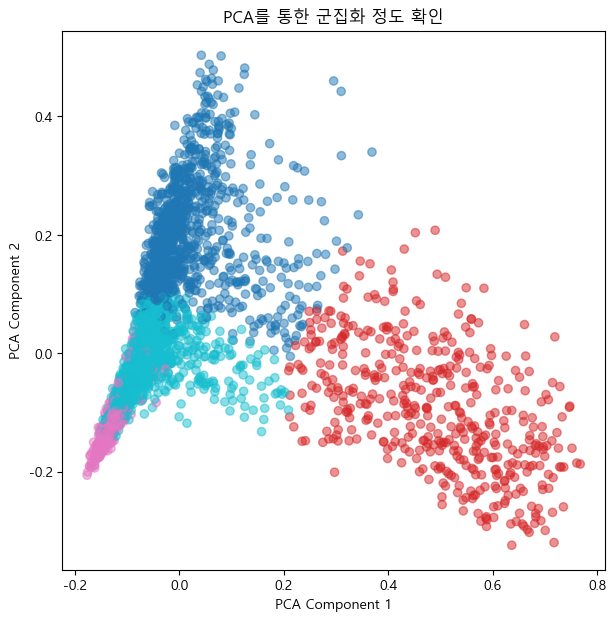

In [70]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans


clusters = km.labels_.tolist()

# 9. PCA를 사용한 2D 시각화 (차원 축소)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(tfidf_matrix.toarray())

plt.figure(figsize=(7, 7))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=[cluster_color_map[label] for label in clusters], alpha=0.5)
plt.title('PCA를 통한 군집화 정도 확인')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

In [53]:
from sklearn.decomposition import TruncatedSVD


# TruncatedSVD 적용
n_components = 10  # 원하는 차원의 수
svd = TruncatedSVD(n_components=n_components)
X_reduced = svd.fit_transform(tfidf_matrix)

# 주성분 결과 확인
print(X_reduced)

[[ 0.04354981 -0.04096031  0.00799998 ... -0.0105803   0.00989324
   0.06336317]
 [ 0.03619761 -0.08413751 -0.14625878 ... -0.02117448 -0.02065422
  -0.00682253]
 [ 0.05072773 -0.07816962 -0.13164125 ... -0.02396947 -0.00214319
  -0.02710044]
 ...
 [ 0.16223079 -0.156496    0.0131042  ...  0.01156464 -0.02075986
  -0.00101572]
 [ 0.02247226 -0.03820604 -0.0602794  ... -0.01270519  0.00111157
  -0.00942228]
 [ 0.18653805 -0.21320704  0.10503686 ... -0.03259129 -0.0204515
  -0.02005294]]


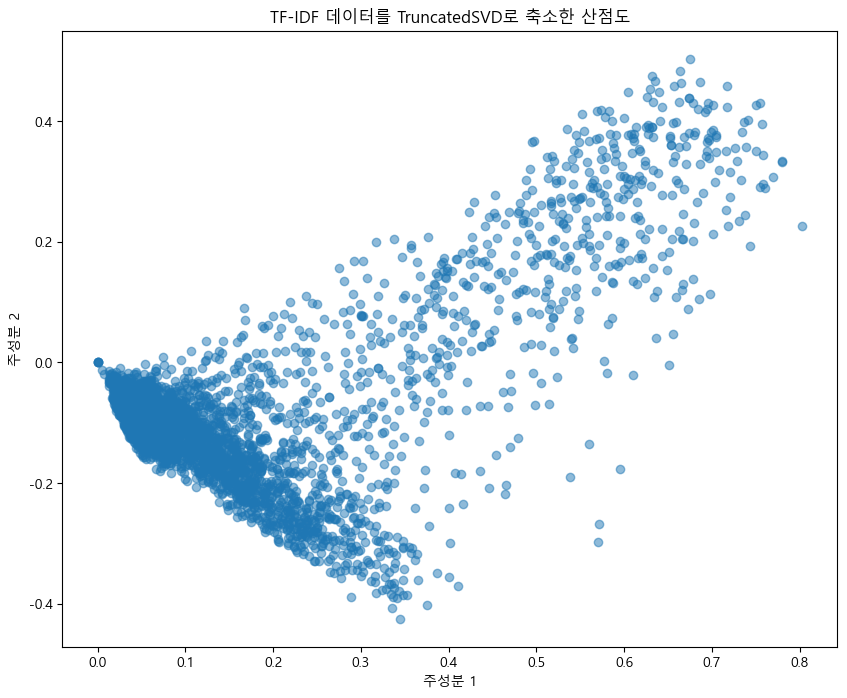

In [54]:
# TruncatedSVD로 차원 축소
svd = TruncatedSVD(n_components=2)
X_reduced = svd.fit_transform(tfidf_matrix)

# 산점도 시각화
plt.figure(figsize=(10, 8))
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], alpha=0.5)
plt.xlabel("주성분 1")
plt.ylabel("주성분 2")
plt.title("TF-IDF 데이터를 TruncatedSVD로 축소한 산점도")
plt.show()

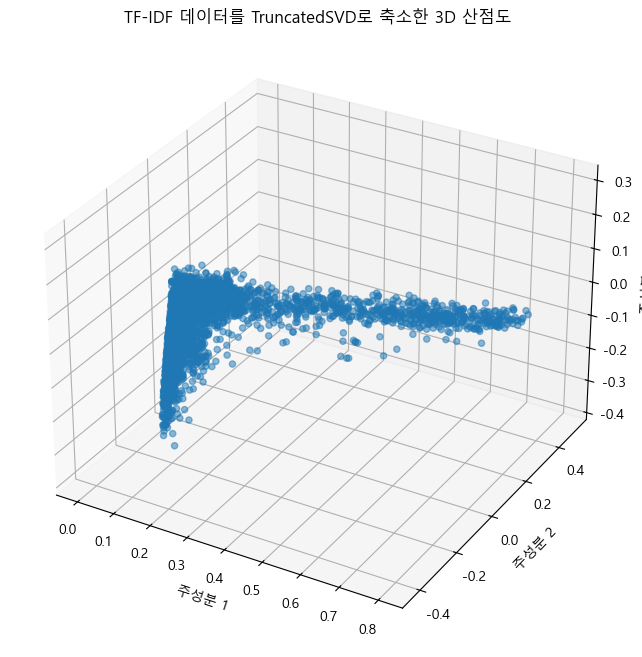

In [55]:
from mpl_toolkits.mplot3d import Axes3D

# TruncatedSVD로 3차원 축소
svd_3d = TruncatedSVD(n_components=3)
X_reduced_3d = svd_3d.fit_transform(tfidf_matrix)

# 3D 산점도 시각화
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_reduced_3d[:, 0], X_reduced_3d[:, 1], X_reduced_3d[:, 2], alpha=0.5)
ax.set_xlabel("주성분 1")
ax.set_ylabel("주성분 2")
ax.set_zlabel("주성분 3")
ax.set_title("TF-IDF 데이터를 TruncatedSVD로 축소한 3D 산점도")
plt.show()

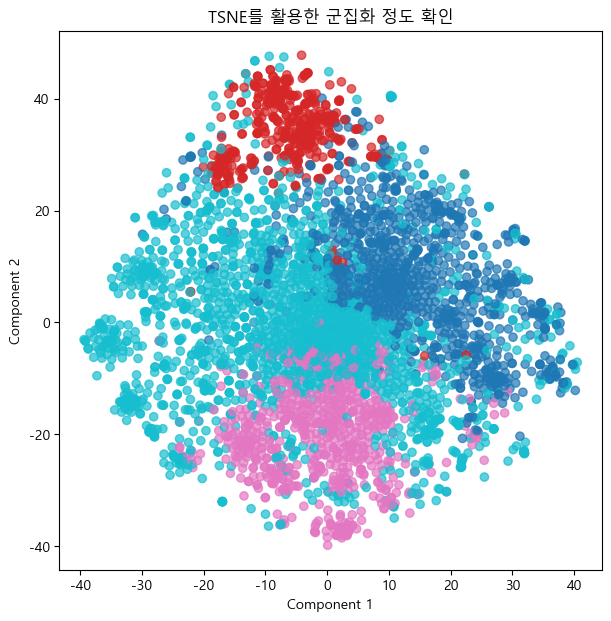

In [73]:
from sklearn.manifold import TSNE
from umap import UMAP  # UMAP을 사용하려면 설치 필요: !pip install umap-learn

# PCA를 사용하는 경우
# pca = PCA(n_components=2)
# reduced_data = pca.fit_transform(tfidf_matrix.toarray())

# t-SNE를 사용하는 경우
tsne = TSNE(n_components=2, random_state=42)
reduced_data = tsne.fit_transform(tfidf_matrix.toarray())

# UMAP을 사용하는 경우
# umap = UMAP(n_components=2, random_state=42)
# reduced_data = umap.fit_transform(tfidf_matrix.toarray())

# 시각화
plt.figure(figsize=(7, 7))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=[cluster_color_map[label] for label in clusters], alpha=0.7)
plt.title('TSNE를 활용한 군집화 정도 확인')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.show()

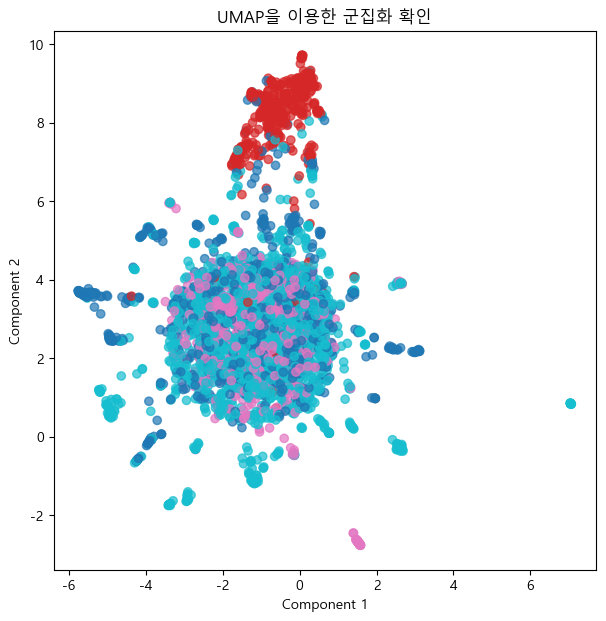

In [74]:
# UMAP을 사용하는 경우
umap = UMAP(n_components=2)
reduced_data = umap.fit_transform(tfidf_matrix.toarray())

# 시각화
plt.figure(figsize=(7, 7))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=[cluster_color_map[label] for label in clusters], alpha=0.7)
plt.title('UMAP을 이용한 군집화 확인')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.show()

In [83]:
from gensim import corpora
from gensim.models import LdaModel


# 불용어 제거 함수
def remove_stopwords_list(tokens):
    return [word for word in tokens if word not in stopwords]  # 불용어 제거

Lda_normalized = normalized.apply(lambda x: x.split()) #normalized를 바탕으로 Lda_normalized 추출
Lda_filtered_normalized = Lda_normalized.apply(remove_stopwords_list)



# 사전(dictionary) 생성 및 코퍼스(corpus) 구성
dictionary = corpora.Dictionary(Lda_filtered_normalized) #하나의 문자열이 아닌 리스트로 넣어야한다.
corpus = [dictionary.doc2bow(text) for text in Lda_filtered_normalized]

# LDA 모델 설정 및 학습
num_topics = 4
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, random_state=42,    passes=10,              # 반복 학습 횟수
    iterations=100,         # 내부 반복 횟수
    alpha='auto',           # 문서 주제 분포
    eta='auto',             # 주제의 단어 분포
    update_every=1 )

# 주제별 상위 단어 출력
for idx, topic in lda_model.print_topics(num_words=10):
    print(f"Topic {idx + 1}: {topic}")

Topic 1: 0.008*"집회" + 0.007*"경찰" + 0.007*"폭행" + 0.007*"폭력" + 0.006*"경찰관" + 0.005*"시위" + 0.005*"죄" + 0.005*"방해" + 0.004*"볼" + 0.004*"차량"
Topic 2: 0.009*"죄" + 0.007*"형" + 0.005*"의사" + 0.005*"볼" + 0.005*"거래" + 0.005*"가중" + 0.004*"금고" + 0.004*"사망" + 0.004*"치료" + 0.004*"수술"
Topic 3: 0.013*"회사" + 0.005*"지시" + 0.005*"징계" + 0.005*"보고" + 0.004*"사업" + 0.004*"관리" + 0.004*"수행" + 0.004*"전달" + 0.004*"작업" + 0.004*"주식회사"
Topic 4: 0.038*"보험" + 0.029*"사고" + 0.018*"지급" + 0.014*"손해" + 0.013*"계약" + 0.009*"치료" + 0.009*"자동차" + 0.009*"의무" + 0.009*"차량" + 0.008*"보험금"


In [86]:
# 주제별 상위 단어 출력
for idx, topic in lda_model.print_topics(num_words=20):
    print(f"Topic {idx + 1}: {topic}")

Topic 1: 0.008*"집회" + 0.007*"경찰" + 0.007*"폭행" + 0.007*"폭력" + 0.006*"경찰관" + 0.005*"시위" + 0.005*"죄" + 0.005*"방해" + 0.004*"볼" + 0.004*"차량" + 0.004*"직원" + 0.004*"말" + 0.004*"공무" + 0.004*"공무원" + 0.004*"직무" + 0.004*"사람" + 0.004*"조사" + 0.004*"장소" + 0.004*"단체" + 0.004*"신고"
Topic 2: 0.009*"죄" + 0.007*"형" + 0.005*"의사" + 0.005*"볼" + 0.005*"거래" + 0.005*"가중" + 0.004*"금고" + 0.004*"사망" + 0.004*"치료" + 0.004*"수술" + 0.004*"폭행" + 0.004*"칼" + 0.004*"부외" + 0.004*"징역" + 0.003*"병원" + 0.003*"강간" + 0.003*"형사소송법" + 0.003*"부위" + 0.003*"오해" + 0.003*"대출"
Topic 3: 0.013*"회사" + 0.005*"지시" + 0.005*"징계" + 0.005*"보고" + 0.004*"사업" + 0.004*"관리" + 0.004*"수행" + 0.004*"전달" + 0.004*"작업" + 0.004*"주식회사" + 0.004*"직원" + 0.003*"안전" + 0.003*"대통령" + 0.003*"근로자" + 0.003*"수사" + 0.003*"정보" + 0.003*"국가정보원" + 0.003*"자료" + 0.003*"과정" + 0.003*"활동"
Topic 4: 0.038*"보험" + 0.029*"사고" + 0.018*"지급" + 0.014*"손해" + 0.013*"계약" + 0.009*"치료" + 0.009*"자동차" + 0.009*"의무" + 0.009*"차량" + 0.008*"보험금" + 0.007*"손해배상" + 0.007*"운전" + 0.006*"망인" + 0.006*"장해" +

In [84]:
import pyLDAvis.gensim_models
import pyLDAvis

# pyLDAvis를 사용한 LDA 시각화
pyLDAvis.enable_notebook()  # Jupyter Notebook에서 사용 시
lda_vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary)
pyLDAvis.display(lda_vis)

#감마값은 1에 가까울 수록 토픽에서 나오는 단어들의 빈도순으로 키워드들이 나오고 0에 가까워질수록 데이터 전체에서 나오는 단어들은 제하고 해당 토픽에만 나오는 단어들에 가중치를 줘서 키워드를 도출한다

In [85]:
from gensim import corpora
from gensim.models import LdaModel
import pandas as pd
import numpy as np

# LDA 모델 생성 후 corpus, dictionary 준비가 되어 있다고 가정합니다.
num_topics = 4  # 예시로 설정한 주제 개수

# λ=0.5로 relevance 기반의 단어 중요도 계산 함수
def get_relevant_words(lda_model, num_words=10, lambda_value=0.5):
    topics = lda_model.show_topics(formatted=False)
    topic_words = {}

    for topic_idx, topic_terms in topics:
        term_weights = []
        for term, weight in topic_terms:
            # 토픽별 단어 중요도를 λ에 따라 조정
            term_prob = lda_model.get_term_topics(term, minimum_probability=0)
            relevance = lambda_value * weight + (1 - lambda_value) * sum([tp[1] for tp in term_prob if tp[0] == topic_idx])
            term_weights.append((term, relevance))
        
        # relevance가 높은 상위 num_words 단어만 선택
        sorted_terms = sorted(term_weights, key=lambda x: x[1], reverse=True)[:num_words]
        topic_words[topic_idx] = sorted_terms

    return topic_words

# 토픽별로 중요도가 높은 단어 출력 (λ=0.5)
lambda_value = 0.5
topic_words = get_relevant_words(lda_model, num_words=10, lambda_value=lambda_value)

# 출력 형식으로 표시
for topic_idx, words in topic_words.items():
    print(f"Topic {topic_idx + 1}:")
    for term, relevance in words:
        print(f" {term}: {relevance:.3f}")
    print("\n")

Topic 1:
 집회: 0.008
 경찰: 0.007
 폭행: 0.007
 폭력: 0.007
 경찰관: 0.006
 시위: 0.005
 죄: 0.005
 방해: 0.005
 볼: 0.004
 차량: 0.004


Topic 2:
 죄: 0.009
 형: 0.007
 의사: 0.005
 볼: 0.005
 거래: 0.005
 가중: 0.005
 금고: 0.004
 사망: 0.004
 치료: 0.004
 수술: 0.004


Topic 3:
 회사: 0.013
 지시: 0.005
 징계: 0.005
 보고: 0.005
 사업: 0.004
 관리: 0.004
 수행: 0.004
 전달: 0.004
 작업: 0.004
 주식회사: 0.004


Topic 4:
 보험: 0.038
 사고: 0.029
 지급: 0.018
 손해: 0.014
 계약: 0.013
 치료: 0.009
 자동차: 0.009
 의무: 0.009
 차량: 0.009
 보험금: 0.008




In [87]:
topic_labels = {
    0: "집회와 공무집행 방해",
    1: "형사 사건 및 의료사고",
    2: "회사 내 규정 위반 및 관리 이슈",
    3: "보험 사고 및 손해 배상"
}

# 각 문서에 대해 가장 높은 토픽 확률을 갖는 라벨 할당
def label_documents(lda_model, corpus, topic_labels):
    document_labels = []
    for bow in corpus:
        # 각 문서의 토픽 분포를 계산
        topic_probs = lda_model.get_document_topics(bow)
        # 가장 높은 확률의 토픽을 선택하여 라벨링
        best_topic = max(topic_probs, key=lambda x: x[1])[0]
        # 해당 토픽의 라벨 이름을 추가
        document_labels.append(topic_labels[best_topic])
    return document_labels

# 문서에 라벨링 추가
df['LDA_주제'] = label_documents(lda_model, corpus, topic_labels)

In [88]:
from sklearn.metrics import adjusted_rand_score
from sklearn.cluster import KMeans

# 1. K-means 클러스터링 수행
num_clusters = 4  # LDA 주제 개수에 맞춰 설정
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans_clusters = kmeans.fit_predict(tfidf_matrix)

# 2. LDA 주제 라벨링 수행
lda_labels = label_documents(lda_model, corpus, topic_labels)

# 3. LDA 라벨을 숫자로 변환하여 K-means 클러스터와 비교 가능하게 변환
lda_labels_numeric = [list(topic_labels.keys())[list(topic_labels.values()).index(label)] for label in lda_labels]

# 4. 일치율 계산
similarity_score = adjusted_rand_score(kmeans_clusters, lda_labels_numeric)
print(f"LDA와 K-means 간의 군집 일치도 (Adjusted Rand Index): {similarity_score:.3f}")

LDA와 K-means 간의 군집 일치도 (Adjusted Rand Index): 0.192


In [44]:
df['클러스터'].value_counts()

클러스터
1    2437
2    1322
4     356
3      74
Name: count, dtype: int64

In [113]:
clusters_list = {
    1: ["사고", "손해배상", "손해", "차량", "운전", "치료", "지급", "자동차", "운행", "노동"],
    2: ["보험", "계약", "보험금", "지급", "자동차", "사고", "손해", "급여", "사망", "회사"],
    3: ["강간", "폭력", "징역", "폭행", "강도", "가중", "산입", "강도상해죄", "절도", "형사소송법"],
    4: ["폭행", "회사", "경찰관", "치료", "의사", "형사소송법", "오해", "징계", "사고", "경찰"]
}

In [114]:
df['키워드'] = df['클러스터'].map(clusters_list)

In [117]:
df.columns

Index(['판례일련번호', '사건명', '사건번호', '선고일자', '법원명', '사건종류명', '판례상세링크', '판례정보일련번호',
       '사건번호.1', '선고', '판결유형', '판시사항', '판결요지', '참조조문', '참조판례', '판례내용',
       '판례내용_상단', '판례내용_이유', '판례내용_이유_불용어제거', '클러스터', '키워드', '판례내용_이유_전처리'],
      dtype='object')

In [119]:
df1=df[['판례일련번호','사건번호','선고일자','판시사항','판결요지','판례내용_상단','판례내용_이유','판례내용_이유_전처리','판례내용_이유_불용어제거','클러스터','키워드']]
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4189 entries, 0 to 4188
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   판례일련번호         4189 non-null   int64 
 1   사건번호           4189 non-null   object
 2   선고일자           4189 non-null   object
 3   판시사항           3417 non-null   object
 4   판결요지           3028 non-null   object
 5   판례내용_상단        4189 non-null   object
 6   판례내용_이유        4189 non-null   object
 7   판례내용_이유_전처리    4189 non-null   object
 8   판례내용_이유_불용어제거  4189 non-null   object
 9   클러스터           4189 non-null   int32 
 10  키워드            4189 non-null   object
dtypes: int32(1), int64(1), object(9)
memory usage: 343.8+ KB


In [120]:
df1.to_csv('data/df_injury_keyword_realreal_final.csv',index=False)

 최종결과보고
=============


## 클러스터 1: 교통사고 및 손해배상


중심 단어: 사고, 손해배상, 손해, 차량, 운전, 치료, 지급, 자동차, 운행, 노동
<br><br>

요약: 주로 교통사고와 이로 인한 손해배상에 관한 내용을 다룹니다. 사고가 발생했을 때 손해의 발생, 피해자에 대한 치료비 지급, 노동력 상실에 대한 배상 등의 문제를 다루며, 운전자와 차량 관련 손해배상 절차에 대한 법적 논의가 포함됩니다.
<br><br>

## 클러스터 2: 보험 및 보험금 지급

중심 단어: 보험, 계약, 보험금, 지급, 자동차, 사고, 손해, 급여, 사망, 회사
<br><br>

요약: 보험 계약과 보험금 지급과 관련된 문제를 다룹니다. 자동차 사고, 사망 또는 상해로 인한 손해에 대해 보험사가 보험금을 지급하는 절차, 계약 조건, 그리고 보험사의 책임에 관한 내용을 중심으로 합니다. 계약자와 보험회사 간의 분쟁도 주요 이슈로 다뤄집니다.
<br><br>

## 클러스터 3: 형사 사건 및 폭력

중심 단어: 강간, 폭력, 징역, 폭행, 강도, 가중, 산입, 강도상해죄, 절도, 형사소송법
<br><br>

요약: 강간, 폭력, 강도 등 강력 범죄와 관련된 형사 사건을 다룹니다. 강력 범죄에 대한 처벌, 징역형 및 가중처벌 여부, 법정에서의 증거 제출과 판결 과정 등 형사소송법에 관한 법적 논의가 이루어집니다. 이러한 사건에서의 가중 처벌과 혐의 인정 여부가 중요하게 논의됩니다.
<br><br>


## 클러스터 4: 직장 내 폭행 및 징계

중심 단어: 폭행, 회사, 경찰관, 치료, 의사, 형사소송법, 오해, 징계, 사고, 경찰
<br><br>

요약: 폭행 사건과 이를 둘러싼 법적 문제를 다룹니다. 특히 회사 내에서 발생하는 폭행 사건이나 경찰과 관련된 문제를 중심으로 하며, 경찰관이나 의사의 역할이 강조됩니다. 형사소송법을 통해 사건 해결과 징계, 오해로 인한 충돌이 다뤄지며, 이러한 상황에서의 법적 대응 절차에 대한 논의가 포함됩니다.

In [1]:
import pandas as pd
df=pd.read_csv('data/df_injury_keyword_realreal_final.csv')

In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4189 entries, 0 to 4188
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   판례일련번호         4189 non-null   int64 
 1   사건번호           4189 non-null   object
 2   선고일자           4189 non-null   object
 3   판시사항           3417 non-null   object
 4   판결요지           3028 non-null   object
 5   판례내용_상단        4189 non-null   object
 6   판례내용_이유        4184 non-null   object
 7   판례내용_이유_전처리    4189 non-null   object
 8   판례내용_이유_불용어제거  4184 non-null   object
 9   클러스터           4189 non-null   int64 
 10  키워드            4189 non-null   object
dtypes: int64(2), object(9)
memory usage: 360.1+ KB


In [3]:
# db로 저장
import pandas as pd
from sqlalchemy import create_engine
from sqlalchemy.dialects.mysql import LONGTEXT, TEXT
from db_info import user, password, host, port, database

####pandas dataframe에서는 불러올때 타입을 기본str로 불러와서 긴내용의 데이터삽입을 하려면 dtype을 설정해줘야함####
dtype = {
    '판례내용' : LONGTEXT,
    '판시사항': TEXT,
    '판결요지': TEXT,
    '판례내용_이유': LONGTEXT,
    '판례내용_상단': LONGTEXT,
    '판례내용_이유_전처리': LONGTEXT,
    '판례내용_이유_불용어제거': LONGTEXT,
}
#판례내용_이유,판례내용_이유(전처리),판례내용_이유(불용어제거),클러스터,키워드

# DB정보
user = user
password = password
host = host
port = port
database = database


# MySQL 데이터베이스 연결 설정
engine = create_engine(f"mysql+pymysql://{user}:{password}@{host}:{port}/{database}")

# 데이터프레임을 MySQL 테이블에 저장
df.to_sql('injury_keyword', con=engine, if_exists='replace', index=False, dtype=dtype)
# 연결 닫기
engine.dispose()

print("데이터베이스 저장 완료")

데이터베이스 저장 완료


In [85]:
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer

df['판례내용_이유_불용어제거']=normalized_cleaned

# TF-IDF 벡터라이저 적용
vectorizer = TfidfVectorizer(min_df=2, max_df=0.95)
tfidf_matrix = vectorizer.fit_transform(normalized_cleaned)

# K-Means 클러스터링 수행 (k=5로 설정)
num_clusters = 6
km = KMeans(n_clusters=num_clusters,random_state=42)
km.fit(tfidf_matrix)

df['클러스터']=km.labels_+1
# 결과 확인
print("클러스터링 결과:")
print(df[['판례내용_이유_불용어제거', '클러스터']].head())


클러스터링 결과:
                                       판례내용_이유_불용어제거  클러스터
0  승소 적법 승소 상소 두 취소 승소 여 로써 불복 존재 과세표준 증명책임 사업 연도...     5
1  폭행 특수 특수 협박 주거지 입금 주기 형광등 값 화가 손 머리 수회 발 옆구리 주...     5
2  개요 쟁점 진행 경과 인천 건조물 침입 죄 제기 징역 구속영장 발부 건 언급 건조물...     5
3  경합 동시 기소 개일 분리 일부상소 쌍방 상소 분리 경합 지남 무죄판결 주거침입 벌...     5
4  죄 사 실 전력 수원지방법원 폭력 감금 죄 징역 집행유예 중앙 마약 류 관리 대마 ...     5


In [86]:
# 6. 클러스터 중심 계산
cluster_centers = km.cluster_centers_

# 7. 각 클러스터의 중심 단어 추출
def get_top_keywords_for_clusters(cluster_centers, vectorizer, n_words=10):
    order_centroids = cluster_centers.argsort()[:, ::-1]  # 각 클러스터의 중심 단어 인덱스 정렬
    terms = vectorizer.get_feature_names_out()  # 단어 목록
    
    cluster_keywords = {}
    for i in range(num_clusters):
        cluster_keywords[i] = [terms[ind] for ind in order_centroids[i, :n_words]]  # 상위 n_words 단어
    
    return cluster_keywords

# 8. 클러스터 중심 단어 출력
cluster_keywords = get_top_keywords_for_clusters(cluster_centers, vectorizer)
for cluster_num, keywords in cluster_keywords.items():
    print(f"\n클러스터 {cluster_num + 1}의 중심 단어들: {', '.join(keywords)}")


# 클러스터별 상위 단어 및 그 단어들의 TF-IDF 값 확인
order_centroids = km.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names_out()
print("클러스터별 상위 단어 및 TF-IDF 값:")
for i in range(num_clusters):
    print(f"\n클러스터 {i+1}:")
    for ind in order_centroids[i, :10]:  # 상위 10개의 단어
        print(f"단어: {terms[ind]} - TF-IDF 값: {km.cluster_centers_[i, ind]}")


클러스터 1의 중심 단어들: 파견, 근로자, 평화, 산업, 근로, 안전, 순찰, 업주, 사출, 사업

클러스터 2의 중심 단어들: 백화점, 가액, 이득, 합자회사, 취득, 재산, 양도, 사원, 가치, 폭력

클러스터 3의 중심 단어들: 기초, 다툼, 영상, 지위, 결의, 손해배상, 소유, 아들, 추가, 운전면허

클러스터 4의 중심 단어들: 불금, 지급, 망인, 손해, 가불, 보험, 금액, 재산, 위자료, 회사

클러스터 5의 중심 단어들: 사고, 손해배상, 손해, 치료, 차량, 회사, 폭행, 운전, 오인, 다툼

클러스터 6의 중심 단어들: 보험, 계약, 보험금, 지급, 자동차, 사고, 손해, 회사, 사망, 금액
클러스터별 상위 단어 및 TF-IDF 값:

클러스터 1:
단어: 파견 - TF-IDF 값: 0.46419993875462073
단어: 근로자 - TF-IDF 값: 0.2628096971977074
단어: 평화 - TF-IDF 값: 0.2545891774883009
단어: 산업 - TF-IDF 값: 0.19902325226342504
단어: 근로 - TF-IDF 값: 0.19220216950703098
단어: 안전 - TF-IDF 값: 0.1879953797092216
단어: 순찰 - TF-IDF 값: 0.17277574403763954
단어: 업주 - TF-IDF 값: 0.14880952502308645
단어: 사출 - TF-IDF 값: 0.1298619283000284
단어: 사업 - TF-IDF 값: 0.11529980676150609

클러스터 2:
단어: 백화점 - TF-IDF 값: 0.36038933128089845
단어: 가액 - TF-IDF 값: 0.30153350016820796
단어: 이득 - TF-IDF 값: 0.2741213637892799
단어: 합자회사 - TF-IDF 값: 0.23760609101668584
단어: 취득 - TF-IDF 값: 0.23186510726536846
단어: 재산 - TF-IDF 값: 0.2295

In [84]:
df['클러스터'].value_counts()

클러스터
1    2437
2    1322
4     356
3      74
Name: count, dtype: int64

In [ ]:
clusters_list = {
    1: ["파견", "근로자", "평화", "산업", "근로", "안전", "순찰", "업주", "사출", "사업"],
    2: ["백화점", "가액", "이득", "합자회사", "취득", "재산", "양도", "사원", "가치", "폭력"],
    3: ["기초", "다툼", "영상", "지위", "결의", "손해배상", "소유", "보험", "아들", "추가"],
    4: ["불금", "지급", "망인", "손해", "가불", "보험", "금액", "재산", "위자료", "회사"],
    5: ["보험", "사고", "손해배상", "손해", "지급", "자동차", "치료", "회사", "계약", "차량"]
}

In [51]:
df['키워드'] = df['클러스터'].map(clusters_list)

In [52]:
df.columns

Index(['판례일련번호', '사건명', '사건번호', '선고일자', '법원명', '사건종류명', '판례상세링크', '판례정보일련번호',
       '사건번호.1', '선고', '판결유형', '판시사항', '판결요지', '참조조문', '참조판례', '판례내용',
       '판례내용_상단', '판례내용_이유', '판례내용_이유_전처리', '판례내용_이유_불용어제거', '클러스터', '키워드'],
      dtype='object')

-키워드 테이블
판례일련번호, 사건번호, 판시사항, 판결요지, 판례내용_상단, 판례내용_이유, 판례내용이_이유_전처리, 판례내용_이유_불용어제거,
클러스터, 키워드

In [53]:
df_new=df[['판례일련번호','사건번호','선고일자','판시사항','판결요지','판례내용_상단','판례내용_이유','판례내용_이유_전처리','판례내용_이유_불용어제거','클러스터','키워드']]

In [ ]:
df_new.to_csv('data/df_injury_keyword_final.csv',index=False)

In [6]:
import pandas as pd

df=pd.read_csv('data/df_injury_keyword_final.csv')

In [2]:
df['클러스터'].value_counts()

클러스터
5    4109
3      75
1       3
4       1
2       1
Name: count, dtype: int64

In [56]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4189 entries, 0 to 4188
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   판례일련번호         4189 non-null   int64 
 1   사건번호           4189 non-null   object
 2   선고일자           4189 non-null   object
 3   판시사항           3417 non-null   object
 4   판결요지           3028 non-null   object
 5   판례내용_상단        4189 non-null   object
 6   판례내용_이유        4184 non-null   object
 7   판례내용_이유_전처리    4189 non-null   object
 8   판례내용_이유_불용어제거  4189 non-null   object
 9   클러스터           4189 non-null   int32 
 10  키워드            4189 non-null   object
dtypes: int32(1), int64(1), object(9)
memory usage: 343.8+ KB


In [15]:
import pandas as pd
df3=pd.read_csv('data/df_injury_keyword_raw.csv')
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4187 entries, 0 to 4186
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   판례일련번호          4187 non-null   int64 
 1   사건명             4186 non-null   object
 2   사건번호            4187 non-null   object
 3   선고일자            4187 non-null   object
 4   법원명             4187 non-null   object
 5   사건종류명           4187 non-null   object
 6   판례상세링크          4187 non-null   object
 7   판례정보일련번호        4187 non-null   int64 
 8   선고              4187 non-null   object
 9   판결유형            4187 non-null   object
 10  판시사항            3415 non-null   object
 11  판결요지            3026 non-null   object
 12  참조조문            3390 non-null   object
 13  참조판례            1924 non-null   object
 14  판례내용            4187 non-null   object
 15  판례내용_상단         4187 non-null   object
 16  판례내용_이유         4187 non-null   object
 17  판례내용_이유_전처리     4187 non-null   object
 18  판례내용_이유_

In [6]:
# 불필요한 칼럼 드롭
df1 = df.drop(columns=['재판당사자', '재판당사자_텍스트', '판례내용_이유2'])
# # 원하는 순서로 칼럼 재배열
# new_order = [
#     '판례일련번호', '사건명', '사건번호', '선고일자', '법원명',
#     '사건종류명', '판례상세링크', '판례정보일련번호', '선고',
#     '판결유형', '판시사항', '판결요지', '참조조문', '참조판례', '판례내용',
#     '판례내용_상단', '판례내용_이유', '판례내용_이유(전처리)',
#     '판례내용_이유(불용어제거)', '클러스터', '키워드'
# ]

# # 새로운 순서로 재배열
# df = df[new_order]

In [7]:
df1.columns


Index(['판례정보일련번호', '사건번호', '선고', '판결유형', '판시사항', '판결요지', '참조조문', '참조판례',
       '판례내용', '판례내용_상단', '판례내용_이유', '판례내용_이유(전처리)', '판례일련번호',
       '판례내용_이유(불용어제거)', '클러스터', '키워드'],
      dtype='object')

In [8]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4189 entries, 0 to 4188
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   판례정보일련번호        4189 non-null   int64 
 1   사건번호            4189 non-null   object
 2   선고              4189 non-null   object
 3   판결유형            4189 non-null   object
 4   판시사항            3417 non-null   object
 5   판결요지            3028 non-null   object
 6   참조조문            3386 non-null   object
 7   참조판례            1908 non-null   object
 8   판례내용            4189 non-null   object
 9   판례내용_상단         4189 non-null   object
 10  판례내용_이유         4184 non-null   object
 11  판례내용_이유(전처리)    4189 non-null   object
 12  판례일련번호          4189 non-null   int64 
 13  판례내용_이유(불용어제거)  3821 non-null   object
 14  클러스터            4189 non-null   int64 
 15  키워드             4189 non-null   object
dtypes: int64(3), object(13)
memory usage: 523.8+ KB


# 결과분석

<<상해>>_키워드 및 주제

클러스터 1: 근로자 안전 및 사업 관련

핵심 키워드: 파견, 근로자, 평화, 산업, 근로, 안전, 순찰, 업주, 사출, 사업

주제 요약: 이 클러스터는 근로자와 관련된 안전 및 산업 분야의 이슈를 다룹니다. 파견 근로자와 업주 간의 관계, 근로 환경의 안전 문제, 산업 분야에서의 안전이 중요한 요소로 다뤄집니다. 또한 순찰 및 사출과 같은 구체적인 작업 환경도 중요한 이슈가 될 수 있습니다.

<br><br>

클러스터 2: 재산 및 상속 관련

핵심 키워드: 백화점, 가액, 이득, 합자회사, 취득, 재산, 양도, 사원, 가치, 폭력

주제 요약: 이 클러스터는 재산 및 상속 관련 법적 문제를 다룹니다. 백화점과 같은 상업적 자산, 가액 및 이득과 관련된 문제, 합자회사 및 재산 취득에 대한 법적 이슈가 포함됩니다. 또한 재산 양도, 사원의 권리, 가치 평가와 관련된 문제, 그리고 폭력과 관련된 상속 분쟁 등의 이슈가 포함됩니다.

<br><br>

클러스터 3: 법적 다툼 및 손해배상

핵심 키워드: 기초, 다툼, 영상, 지위, 결의, 손해배상, 소유, 보험, 아들, 추가

주제 요약: 이 클러스터는 법적 다툼과 관련된 주제를 다룹니다. 손해배상과 관련된 법적 분쟁, 결의와 같은 법적 결정이 포함되며, 소유권 문제와 관련된 분쟁도 다뤄집니다. 영상 증거와 같은 증거 수집, 그리고 보험을 통한 보상 문제, 그리고 아들과 같은 가족 간의 분쟁이 포함됩니다.

<br><br>

클러스터 4: 손해배상 및 재산 문제

핵심 키워드: 불금, 지급, 망인, 손해, 가불, 보험, 금액, 재산, 위자료, 회사

주제 요약: 이 클러스터는 손해배상 및 재산 문제를 다룹니다. 불금과 같은 특정 사건에 따른 손해, 보험금 지급과 관련된 법적 절차, 가불과 같은 금전적인 문제, 위자료와 관련된 보상 문제를 포함합니다. 망인과 관련된 사망 후 법적 절차도 중요한 요소입니다.

<br><br>

클러스터 5: 사고 및 보험 관련

핵심 키워드: 보험, 사고, 손해배상, 손해, 지급, 자동차, 치료, 회사, 계약, 차량

주제 요약: 이 클러스터는 사고와 보험 관련 문제를 다룹니다. 자동차 사고에서 발생하는 손해와 관련된 보험금 지급, 손해배상과 같은 금전적인 보상 문제, 계약과 관련된 법적 절차가 포함됩니다. 또한 치료와 관련된 법적 이슈, 그리고 차량과 관련된 사고 처리 절차도 주요 이슈입니다.

In [5]:
df.columns

Index(['판례정보일련번호', '사건번호', '선고', '판결유형', '판시사항', '판결요지', '참조조문', '참조판례',
       '판례내용', '판례내용_상단', '판례내용_이유', '재판당사자', '재판당사자_텍스트', '판례내용_이유2',
       '판례내용_이유(전처리)', '판례일련번호', '판례내용_이유(불용어제거)', '클러스터', '키워드'],
      dtype='object')

In [9]:
# 기존 DataFrame에서 특정 열 이름만 변경
df1.rename(columns={'판례내용_이유(불용어제거)': '판례내용_이유_불용어제거', '판례내용_이유(전처리)': '판례내용_이유_전처리'}, inplace=True)

In [12]:
df.to_csv('data/df_injury_keyword_raw.csv', index=False)
df1.to_csv('data/df_injury_keyword.csv',index=False)

In [2]:
import pandas as pd

df_injury_keyword=pd.read_csv('data/df_injury_keyword.csv')
df_injury_keyword.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4187 entries, 0 to 4186
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   판례일련번호         4187 non-null   int64 
 1   사건번호           4187 non-null   object
 2   판시사항           3415 non-null   object
 3   판결요지           3026 non-null   object
 4   판례내용_상단        4187 non-null   object
 5   판례내용_이유        4187 non-null   object
 6   판례내용_이유_전처리    4187 non-null   object
 7   판례내용_이유_불용어제거  4187 non-null   object
 8   클러스터           4187 non-null   int64 
 9   키워드            4187 non-null   object
dtypes: int64(2), object(8)
memory usage: 327.2+ KB


In [55]:
type(df['키워드'][0])

list

In [54]:
type(df_injury_keyword['키워드'][0])

str

In [50]:
df_injury_keyword = pd.read_csv('data/df_injury_keyword_final.csv')
df_injury_keyword = df_injury_keyword.drop(df_injury_keyword.columns[0], axis=1) 
df_injury_keyword.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4189 entries, 0 to 4188
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   판례일련번호         4189 non-null   int64 
 1   사건번호           4189 non-null   object
 2   선고일자           4189 non-null   object
 3   판시사항           3417 non-null   object
 4   판결요지           3028 non-null   object
 5   판례내용_상단        4189 non-null   object
 6   판례내용_이유        4184 non-null   object
 7   판례내용_이유_전처리    4189 non-null   object
 8   판례내용_이유_불용어제거  3821 non-null   object
 9   클러스터           4189 non-null   int64 
 10  키워드            4189 non-null   object
dtypes: int64(2), object(9)
memory usage: 360.1+ KB


In [88]:
# db로 저장
import pandas as pd
from sqlalchemy import create_engine
from sqlalchemy.dialects.mysql import LONGTEXT, TEXT
from db_info import user, password, host, port, database

####pandas dataframe에서는 불러올때 타입을 기본str로 불러와서 긴내용의 데이터삽입을 하려면 dtype을 설정해줘야함####
dtype = {
    '판례내용' : LONGTEXT,
    '판시사항': TEXT,
    '판결요지': TEXT,
    '판례내용_이유': LONGTEXT,
    '판례내용_상단': LONGTEXT,
    '판례내용_이유_전처리': LONGTEXT,
    '판례내용_이유_불용어제거': LONGTEXT,
}
#판례내용_이유,판례내용_이유(전처리),판례내용_이유(불용어제거),클러스터,키워드

# DB정보
user = user
password = password
host = host
port = port
database = database

# CSV 파일 로드
# df_injury_keyword = pd.read_csv('data/df_injury_keyword_final.csv')

# MySQL 데이터베이스 연결 설정
engine = create_engine(f"mysql+pymysql://{user}:{password}@{host}:{port}/{database}")

# 데이터프레임을 MySQL 테이블에 저장
df_injury_keyword.to_sql('injury_keyword', con=engine, if_exists='replace', index=False, dtype=dtype)
# 연결 닫기
engine.dispose()

print("데이터베이스 저장 완료")

데이터베이스 저장 완료


판례내용_이유_불용어제거가 null값이 생겼다. 이유는 판례내용_이유의 전처리가 제대로 되지 않아서이다. 이를 제대로 전처리하려면 시간이 더 필요할 것으로 보여 시간상 이유 때문에 null값은 제외한다.

In [ ]:
from db_info import user, password, host, port, database
import pandas as pd
import mysql.connector

db_connection = mysql.connector.connect(
user = user,
password = password,
host = host,
port = port,
database = database,
)

cursor = db_connection.cursor()

cursor.execute("select * from injury_keyword where 판례내용_이유_불용어제거 is not null;")

result = cursor.fetchall()

df1 = pd.DataFrame(result, columns = [i[0] for i in cursor.description])
df1.head()

In [ ]:
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer

normalized_cleaned=df1['판례내용_이유_불용어제거']

# TF-IDF 벡터라이저 적용
vectorizer = TfidfVectorizer(max_features=10000, min_df=2, max_df=0.95)
tfidf_matrix = vectorizer.fit_transform(normalized_cleaned)

# K-Means 클러스터링 수행 (k=6로 설정)
num_clusters = 6
km = KMeans(n_clusters=num_clusters, random_state=42)
km.fit(tfidf_matrix)

df1['클러스터']=km.labels_

df1.to_csv('data/df_injury_keyword.csv', index=False)


In [ ]:

####pandas dataframe에서는 불러올때 타입을 기본str로 불러와서 긴내용의 데이터삽입을 하려면 dtype을 설정해줘야함####
dtype = {
    '판례내용' : LONGTEXT,
    '판시사항': TEXT,
    '판결요지': TEXT,
    '참조조문': TEXT,
    '참조판례': TEXT,
    '판례내용_이유': LONGTEXT,
    '판례내용_상단': LONGTEXT,
    '판례내용_이유_전처리': LONGTEXT,
    '판례내용_이유_불용어제거': LONGTEXT,
}
#판례내용_이유,판례내용_이유(전처리),판례내용_이유(불용어제거),클러스터,키워드

# DB정보
user = user
password = password
host = host
port = port
database = database

# CSV 파일 로드
df_injury_keyword = pd.read_csv('data/df_injury_keyword.csv')

# MySQL 데이터베이스 연결 설정
engine = create_engine(f"mysql+pymysql://{user}:{password}@{host}:{port}/{database}")

# 데이터프레임을 MySQL 테이블에 저장
df_injury_keyword.to_sql('injury_keyword', con=engine, if_exists='replace', index=False, dtype=dtype)
# 연결 닫기
engine.dispose()

print("데이터베이스 저장 완료")